In [1]:
import numpy as np
import matplotlib.pyplot as plt
import glob

from matplotlib.backends.backend_pdf import PdfPages

from matplotlib.lines import Line2D
import matplotlib.colors as colors

from scipy.stats import gaussian_kde
from scipy.stats import mode
import seaborn as sns
from sklearn.neighbors import KernelDensity

import itertools

from funcs_v2 import get_z, get_SNR, get_dmean, get_meta
from spline_fit_v2 import spline_fit

def func(z):
    def func2(x):
        return x*(1+z)
    return func2

def inv(z):
    def inv2(x):
        return x/(1+z)
    return inv2

In [2]:
#hpath = '/media/bartosz/Volume/highz_data/'
hpath = '/media/bartosz/USB STICK/highz_data/'
hspath = hpath + 'spectra/'
hfpath = hpath + 'fits/'
hnpath = hpath + 'normed/'

hmeta_file = np.loadtxt(hpath + 'meta_data_v2.txt', dtype='str')

hnames = hmeta_file[:,0]
hz = [float(z) for z in hmeta_file[:,1]]
hsnr = [float(snr) for snr in hmeta_file[:,2]]
wl1r = [float(wl) for wl in hmeta_file[:,3]]
wl2r = [float(wl) for wl in hmeta_file[:,4]]

In [3]:
w1l = 13450     # water absorption observed WL
w1r = 14250
w2l = 18200
w2r = 19400

ATLASJ025.6821-33.4627


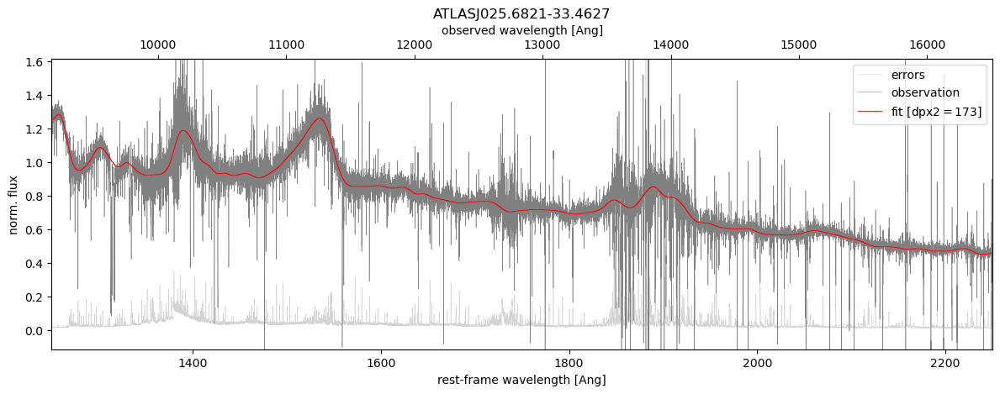

38891


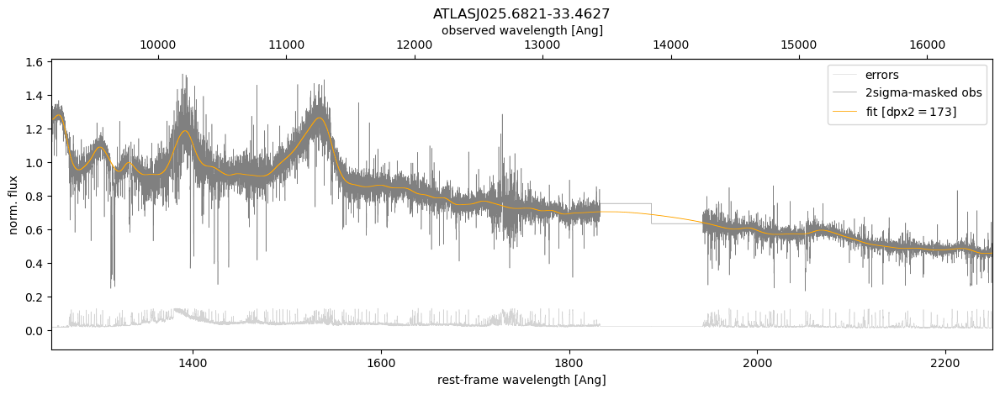

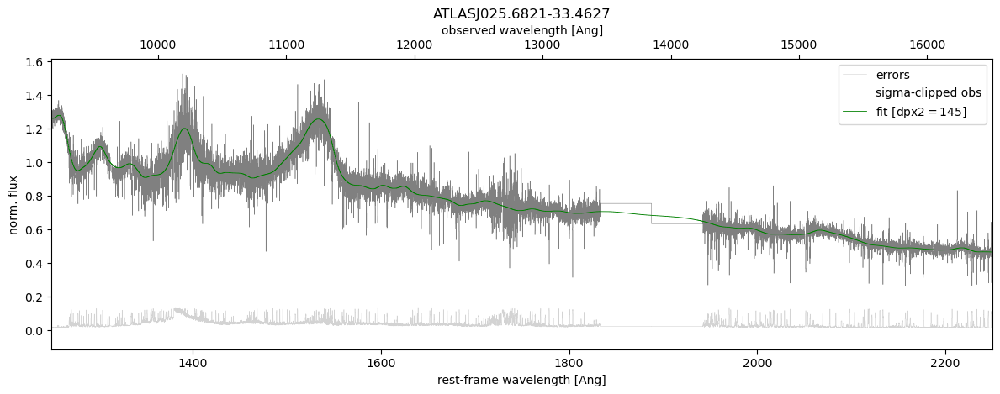

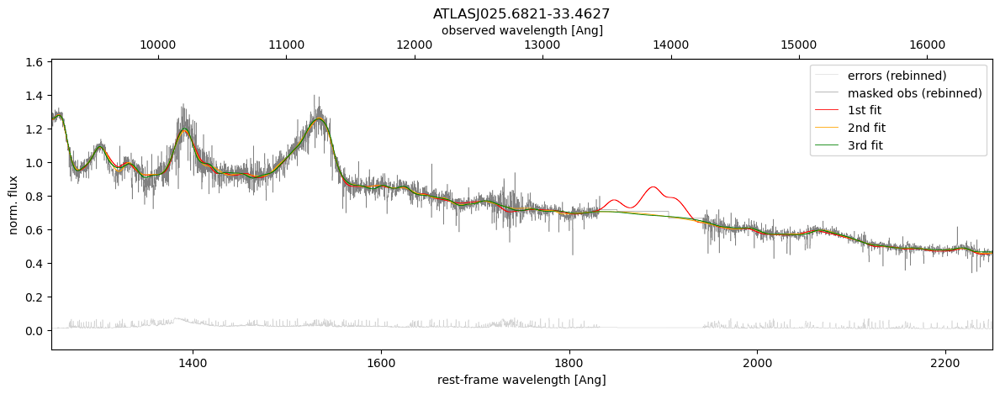

CFHQSJ1509-1749


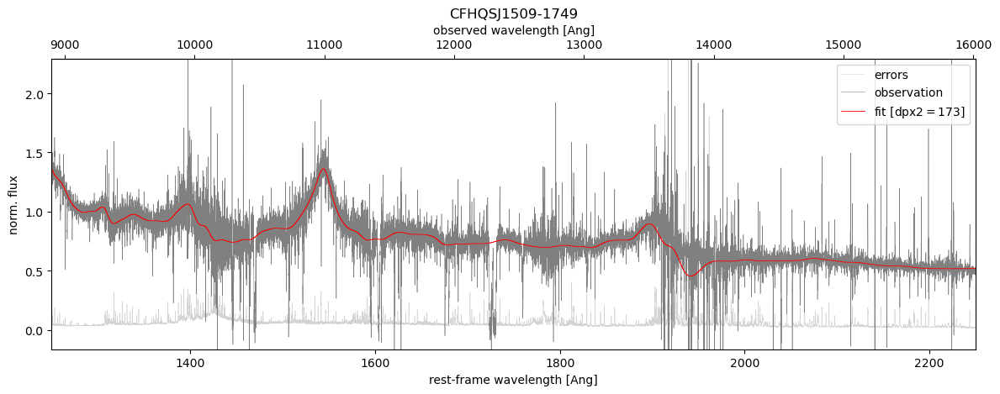

38891


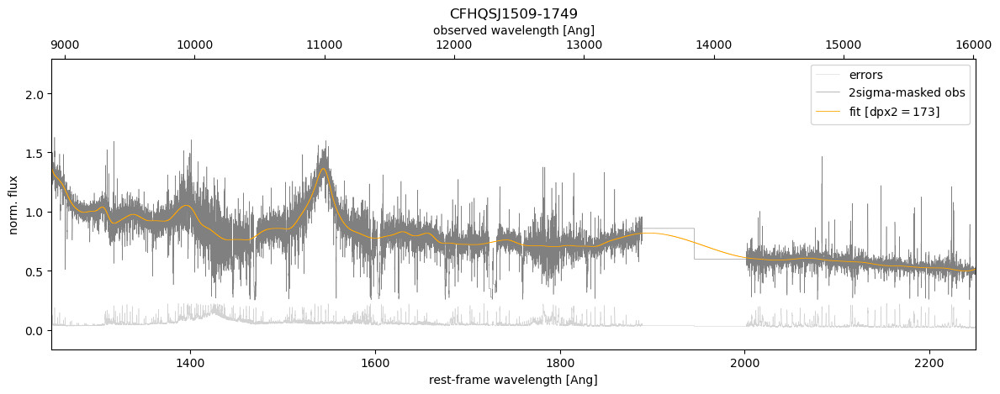

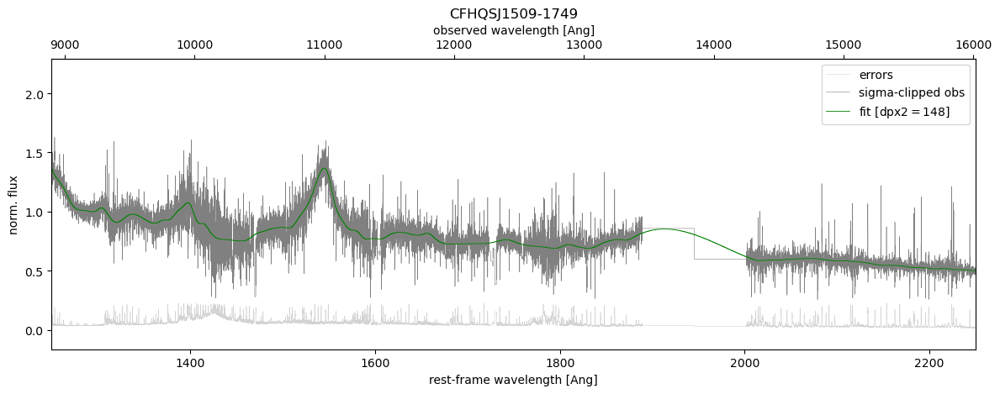

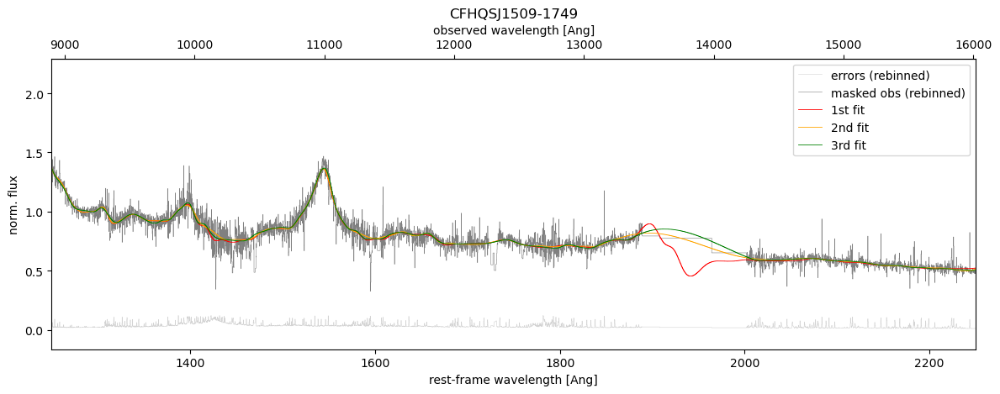

PSOJ036+03


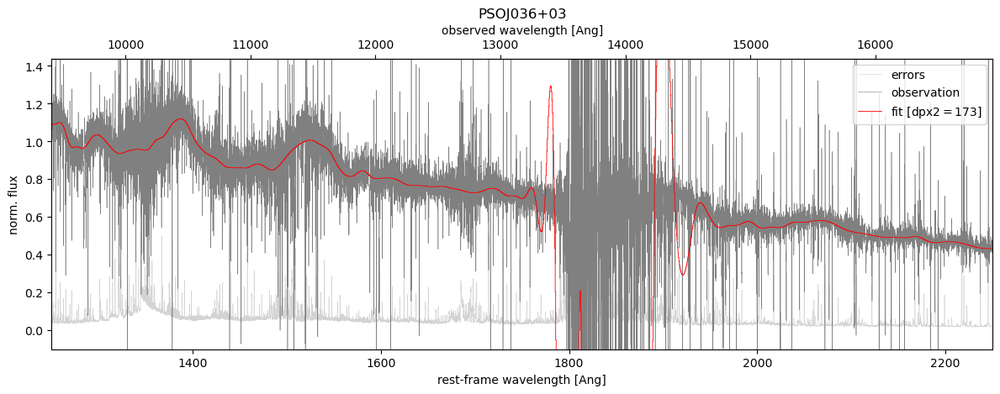

38891


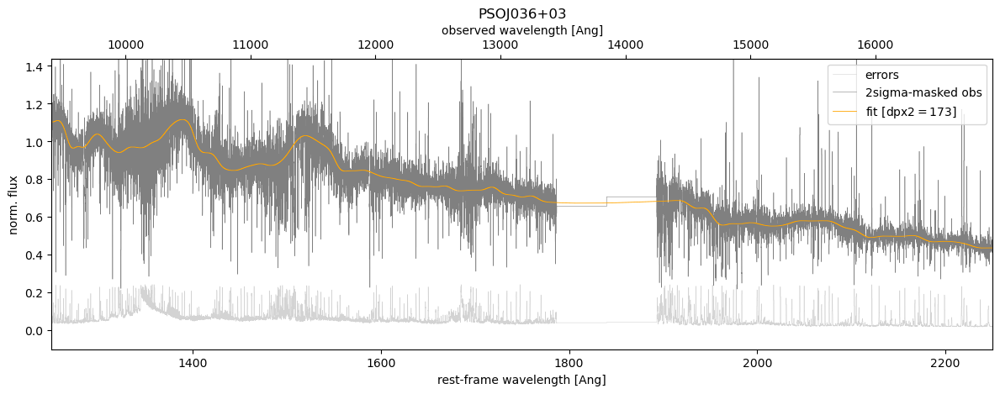

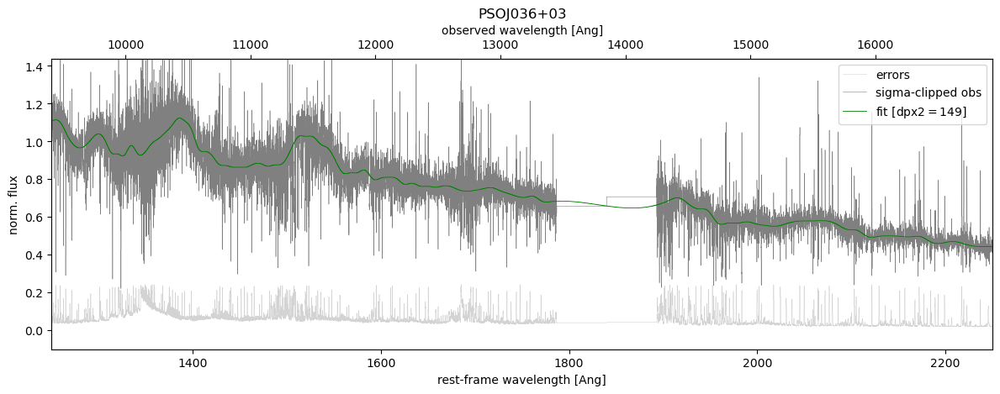

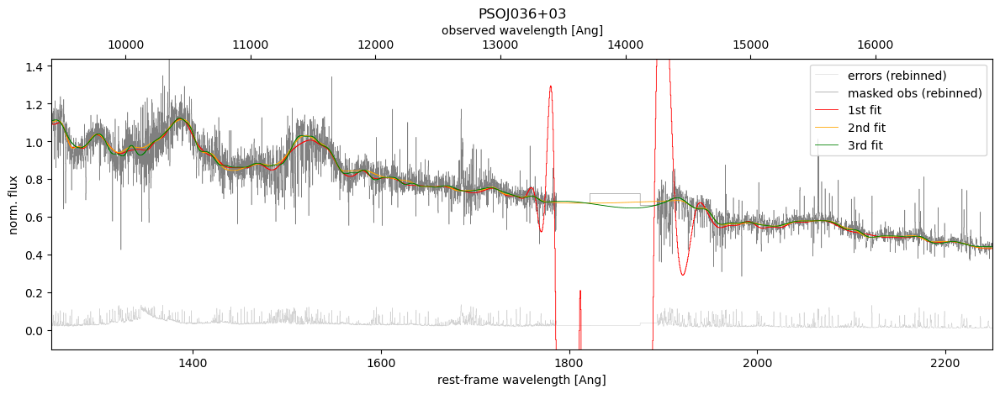

SDSSJ0100+2802


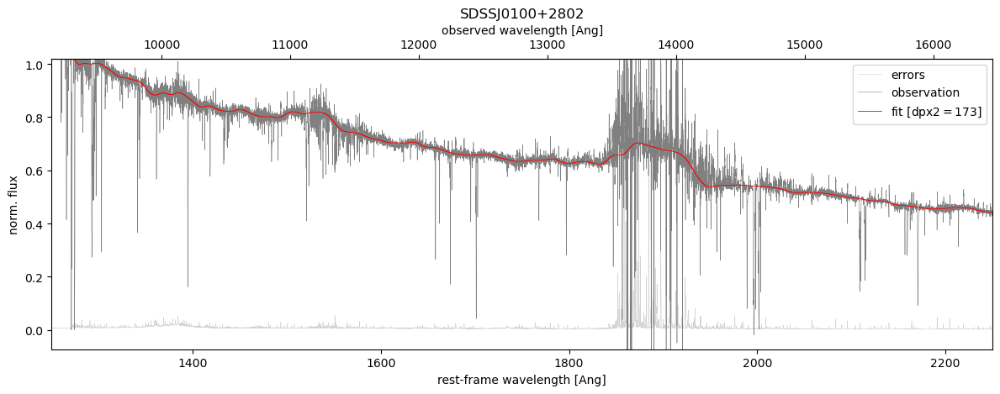

38891


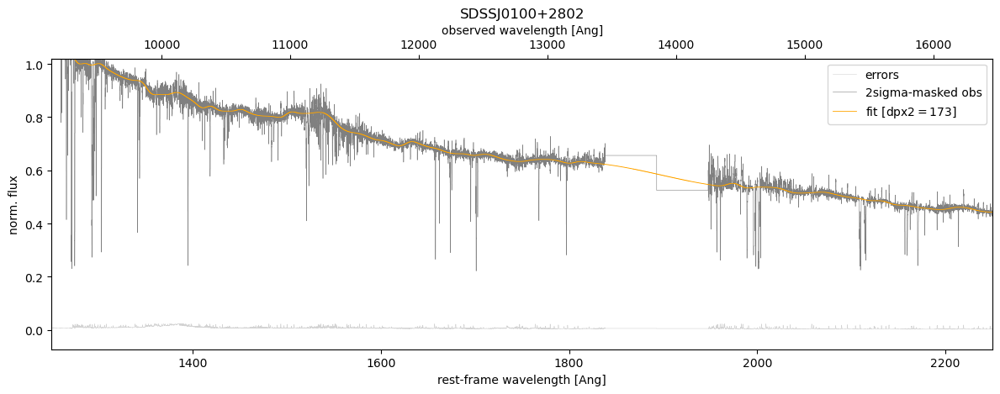

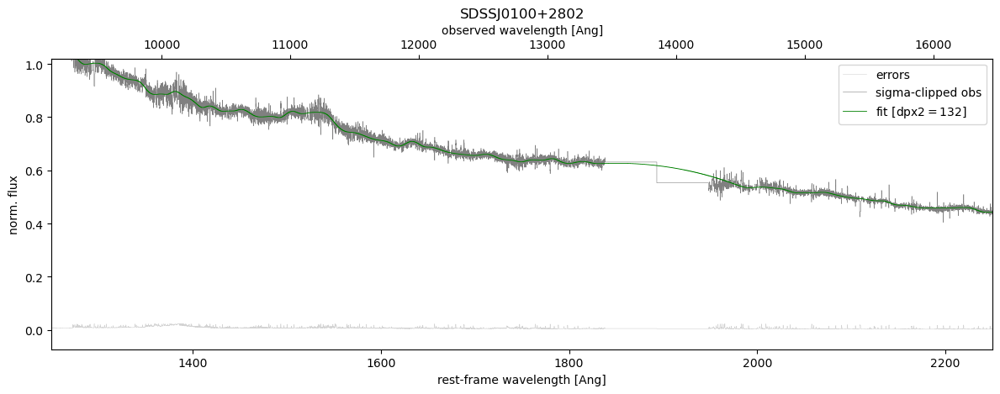

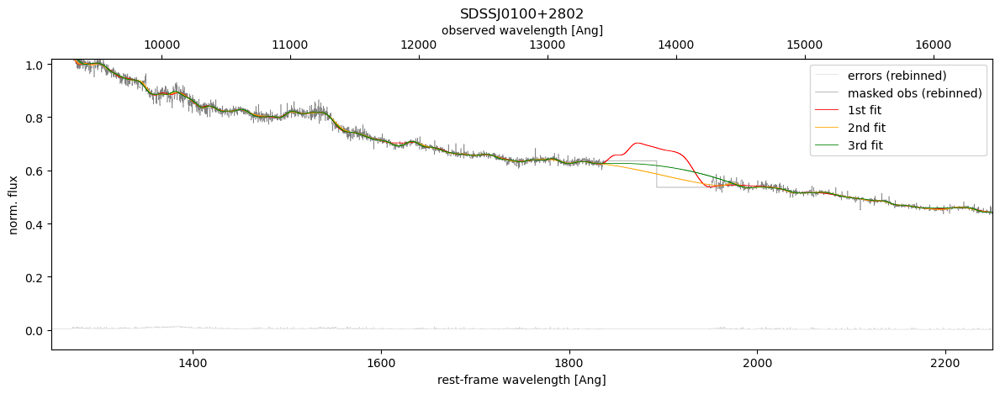

SDSSJ0818+1722


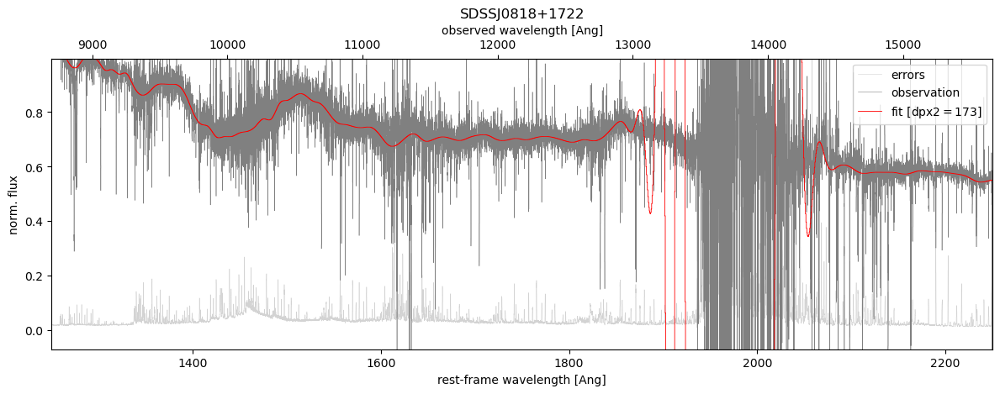

38891


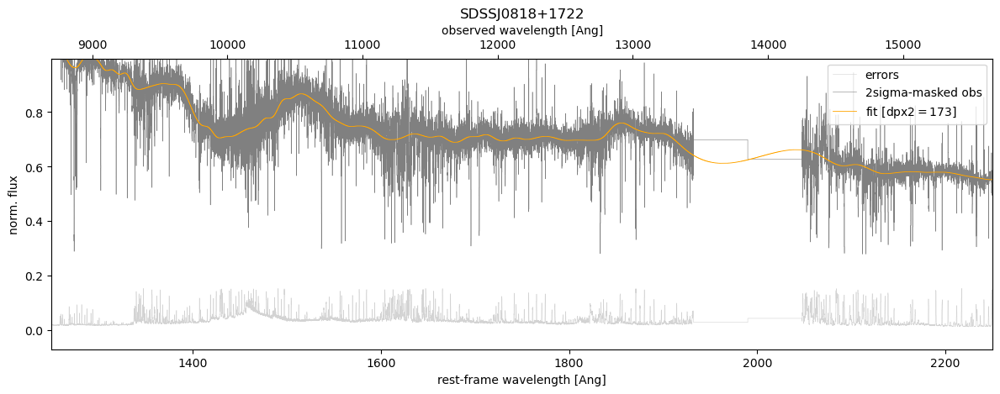

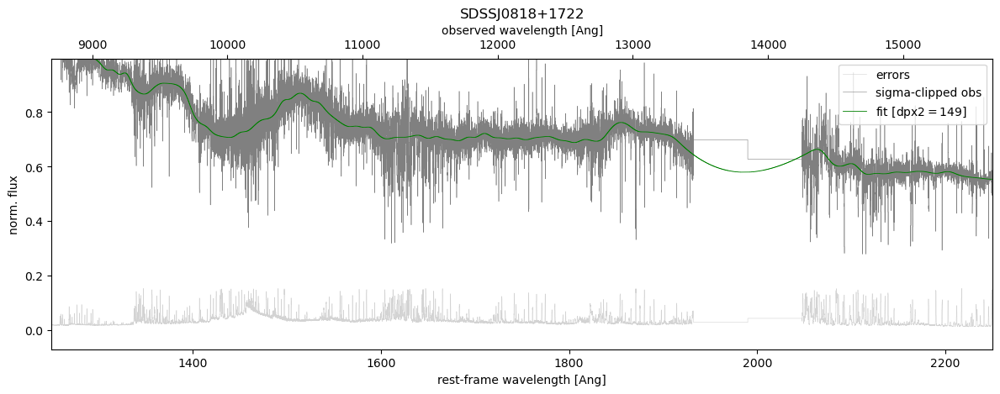

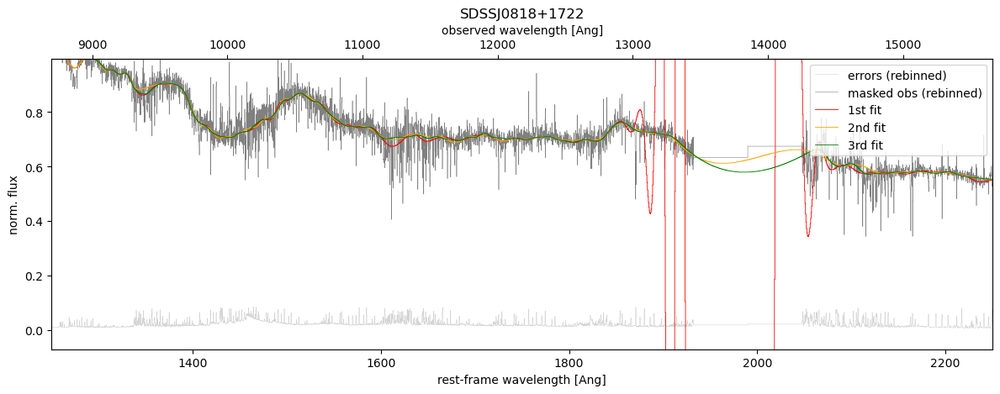

SDSSJ0836+0054


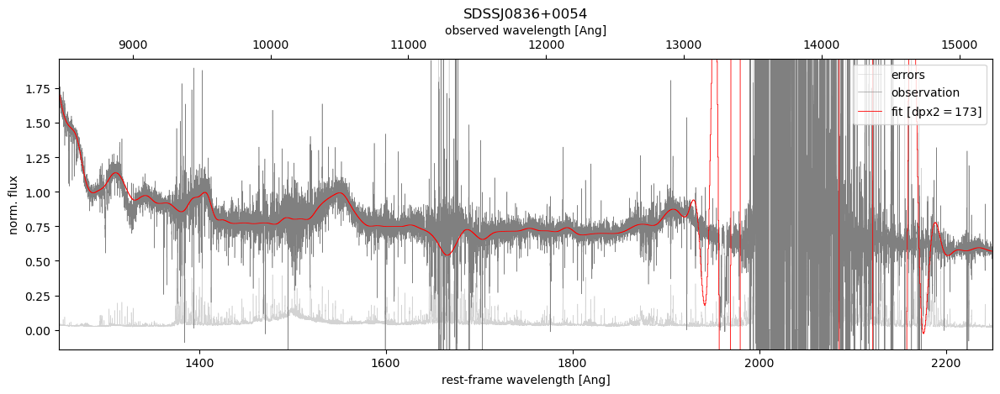

38891


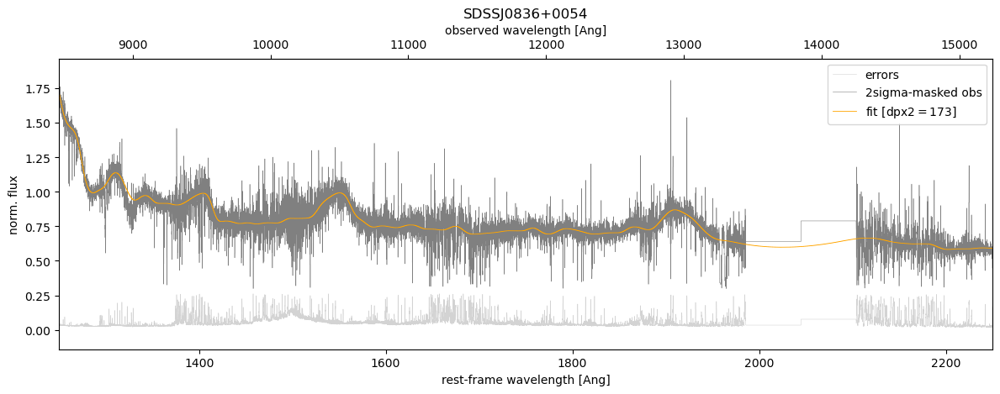

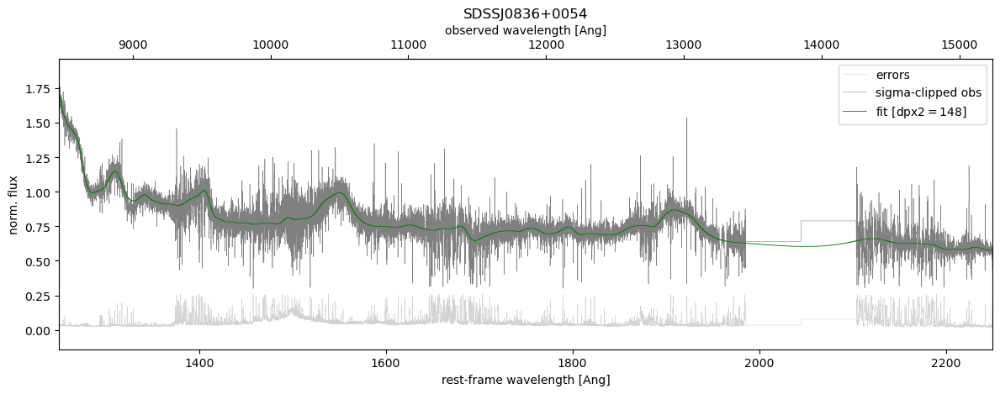

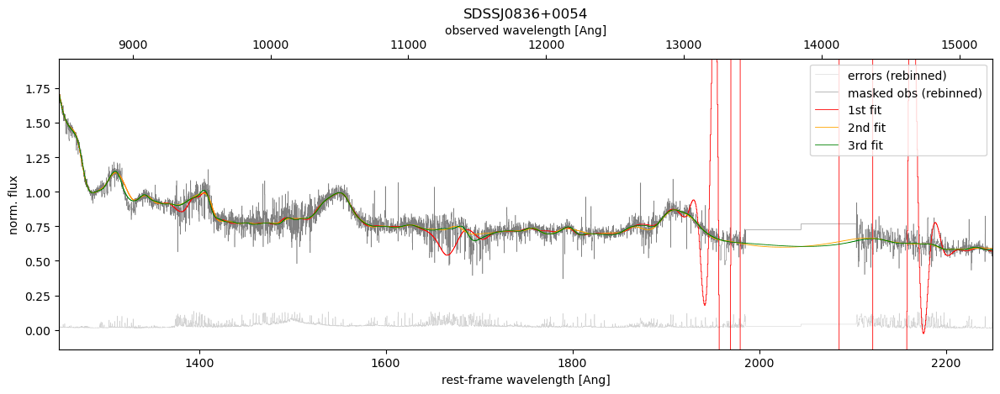

SDSSJ0927+2001


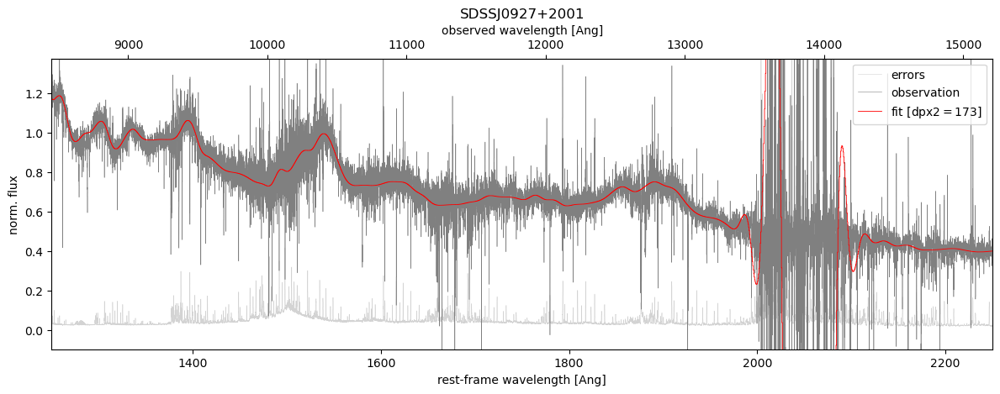

38891


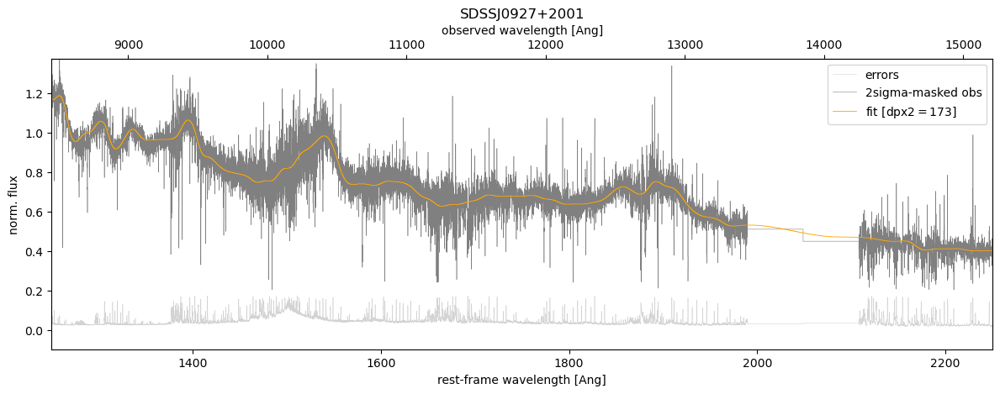

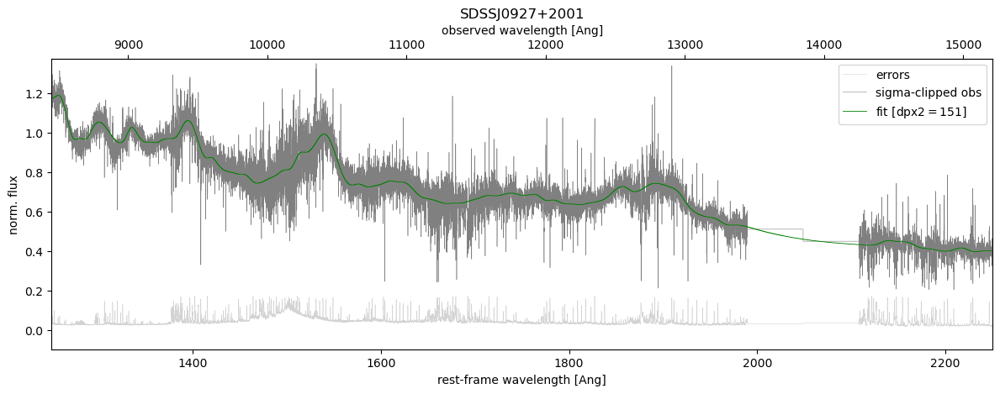

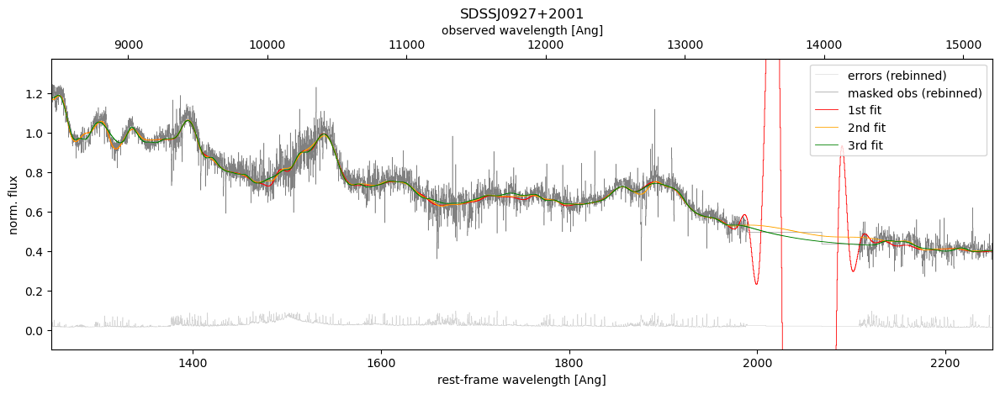

SDSSJ1030+0524


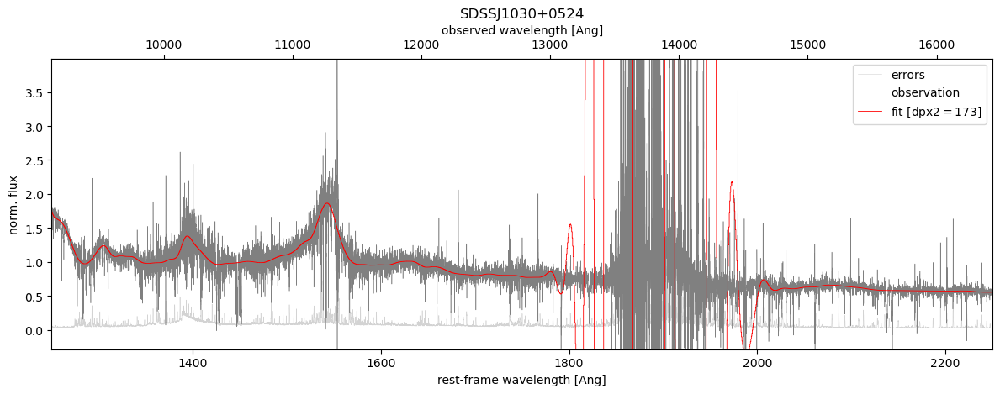

38890


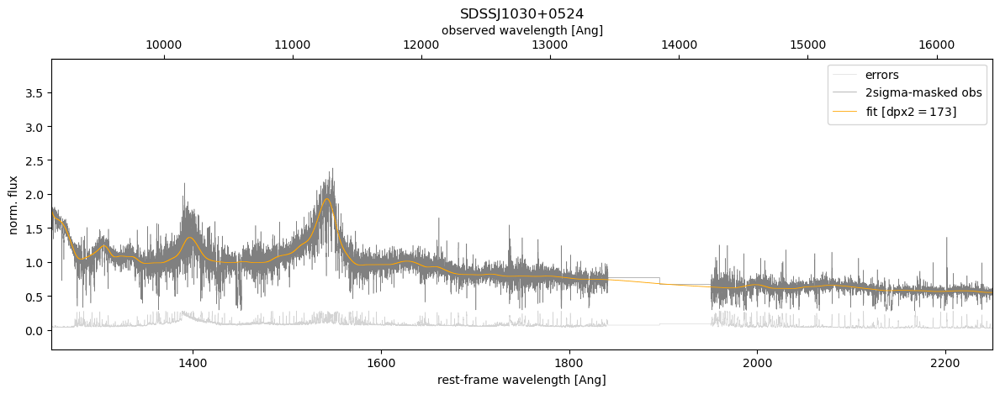

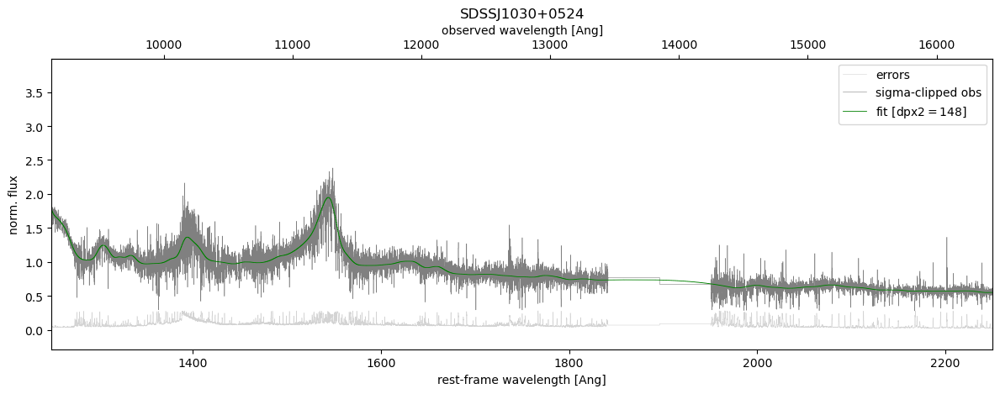

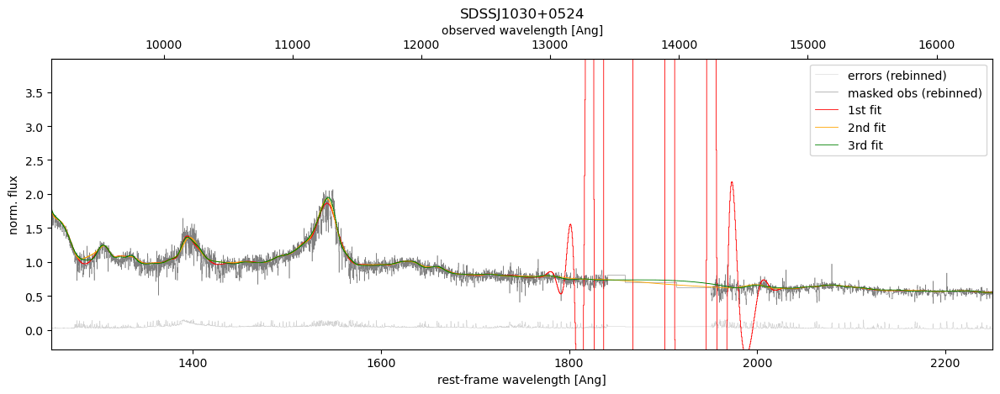

SDSSJ1306+0356


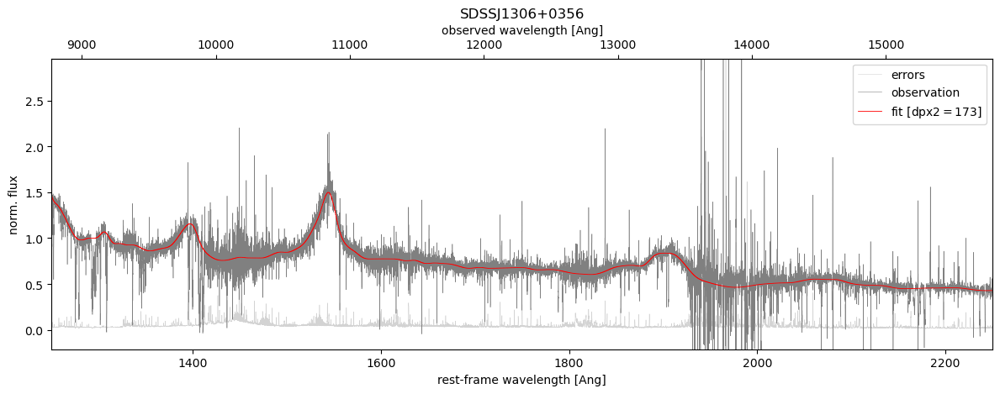

38891


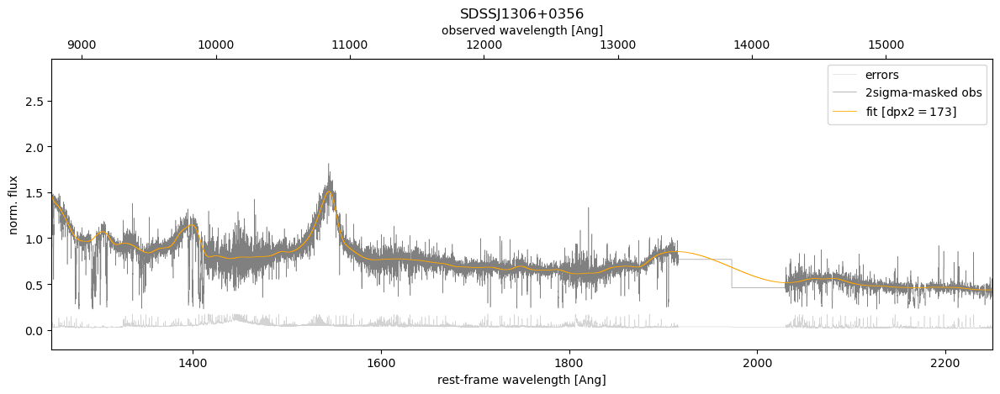

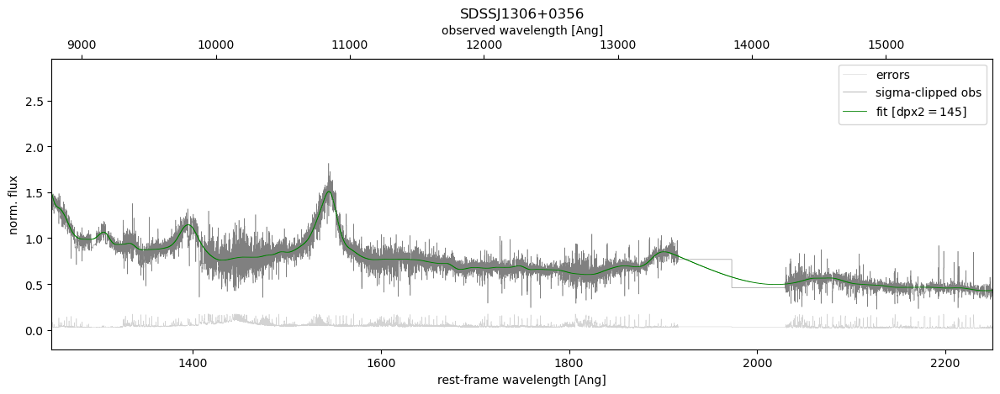

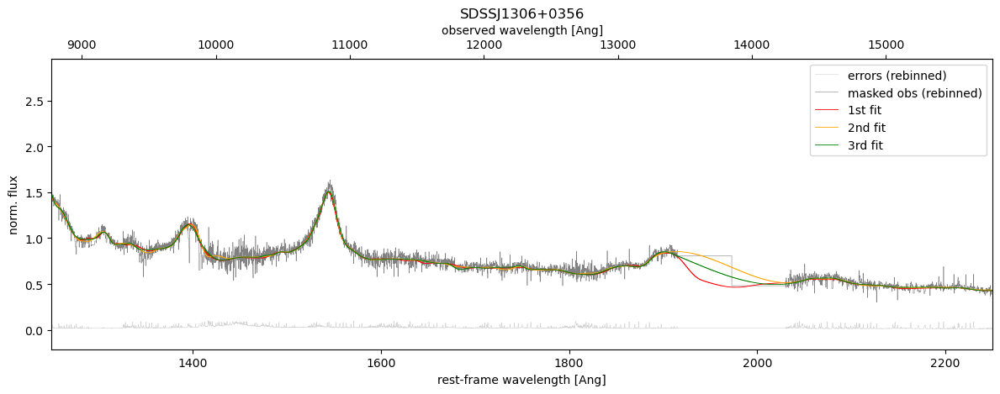

ULASJ0148+0600


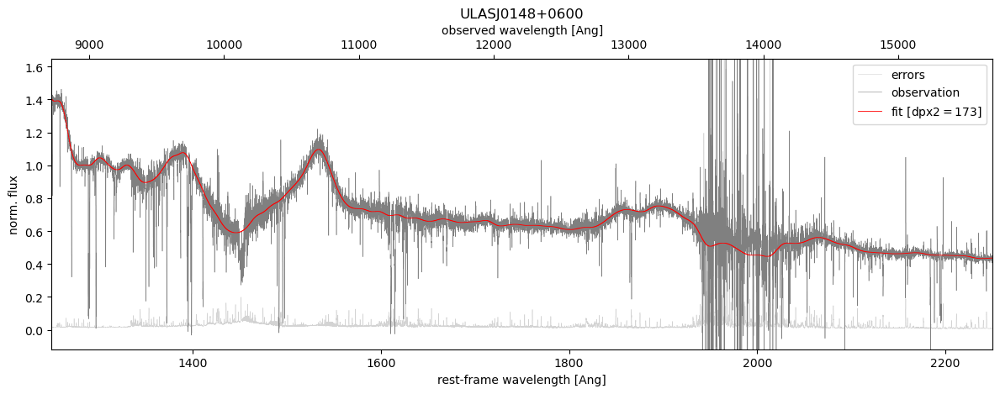

38891


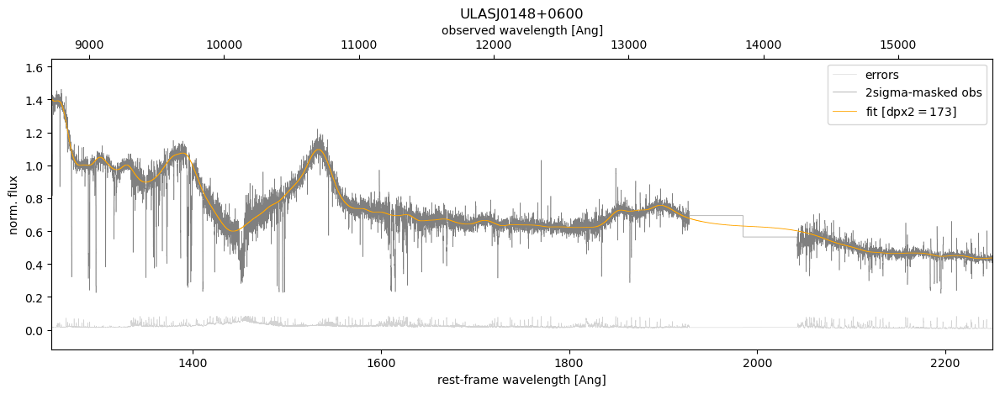

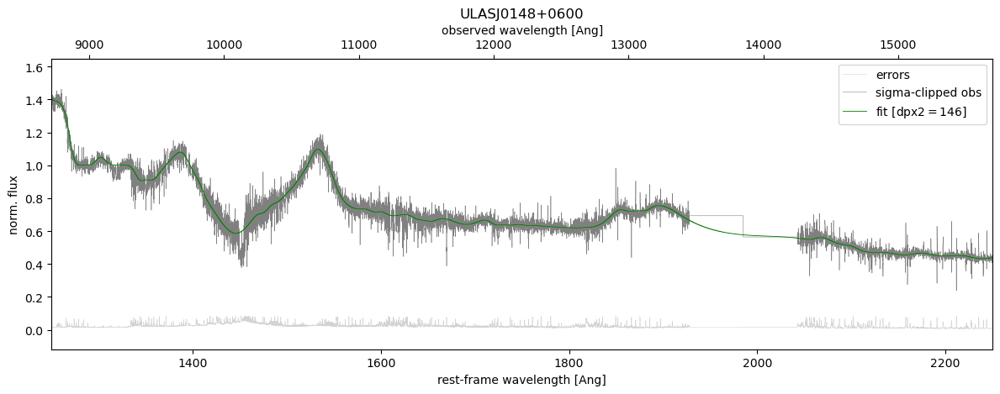

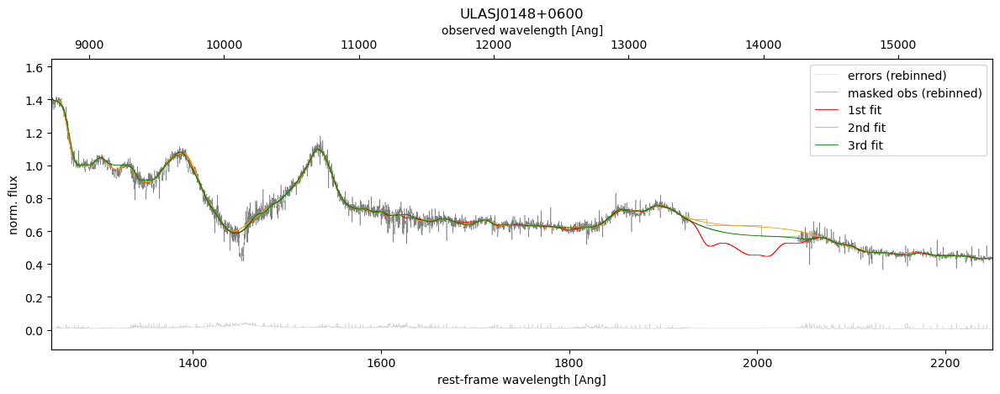

ULASJ1319+0950


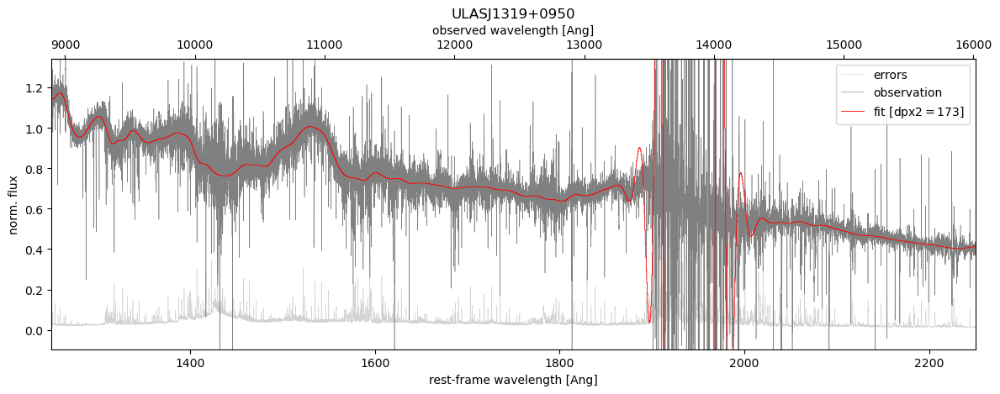

38891


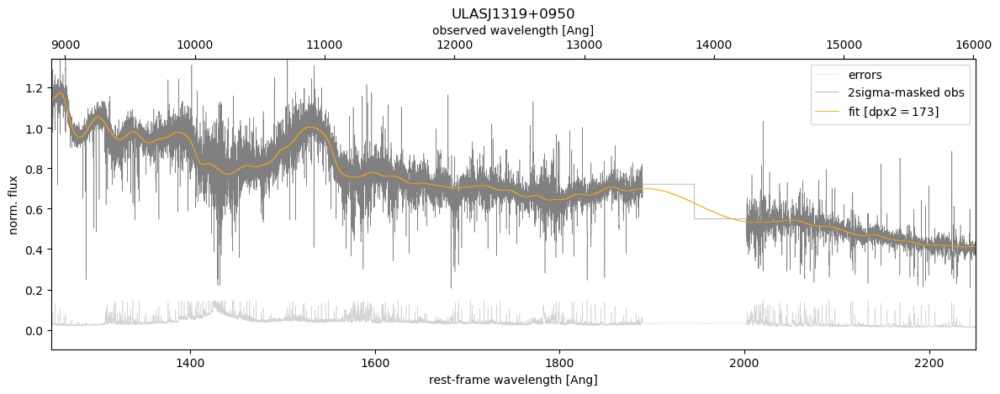

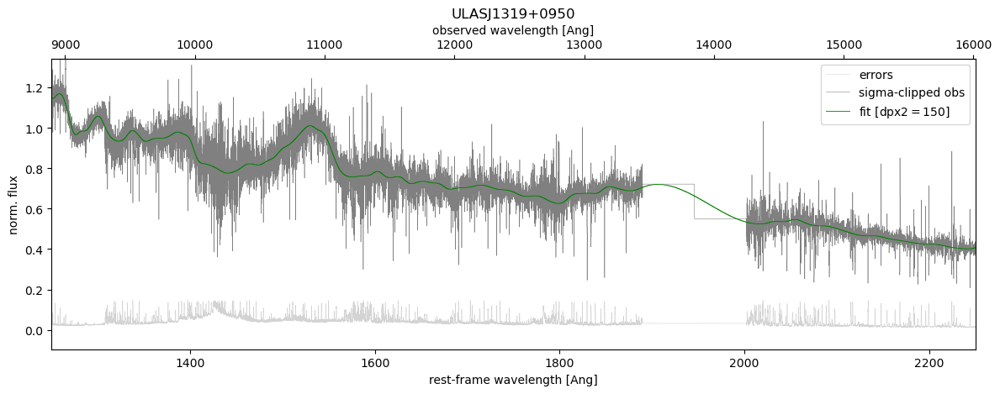

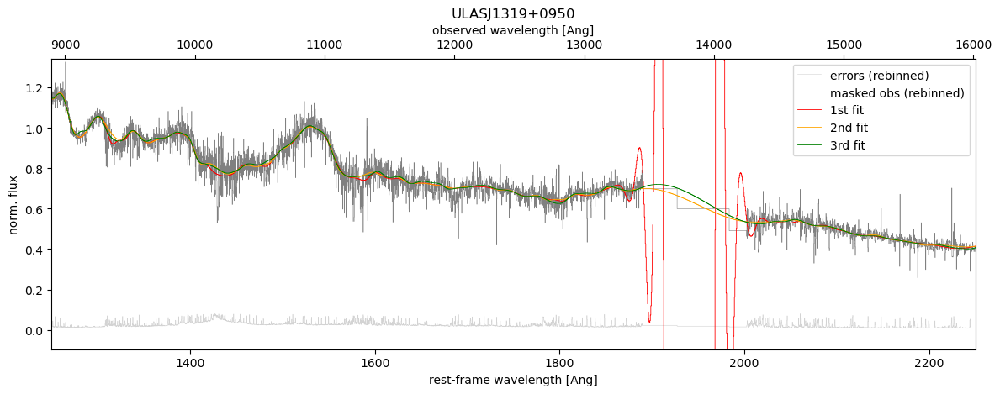

J0108+0711


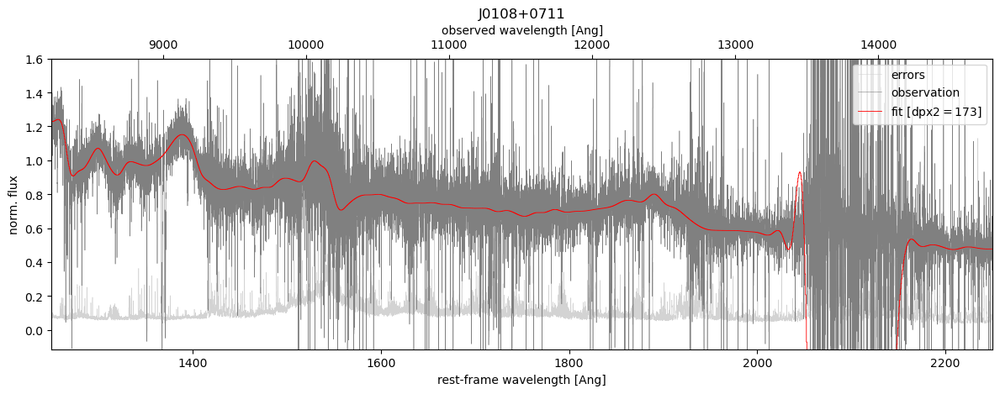

38890


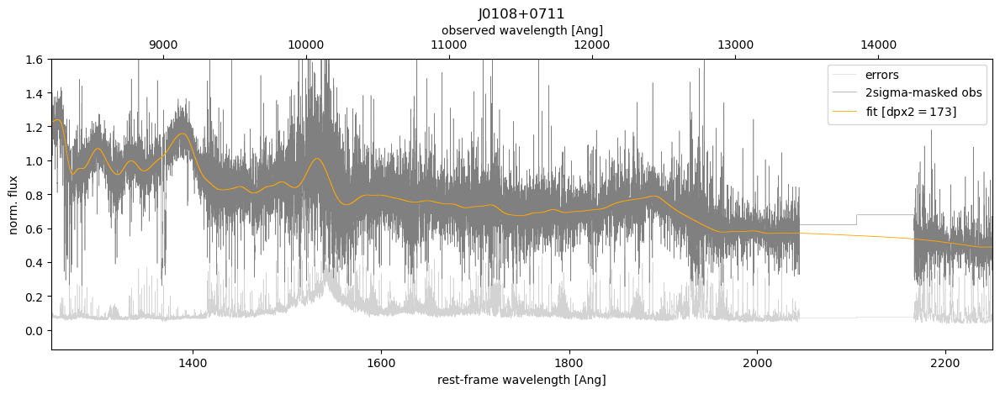

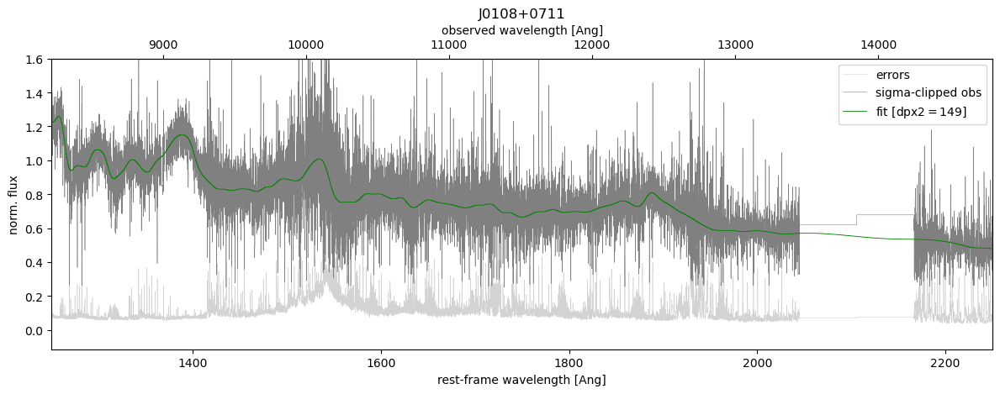

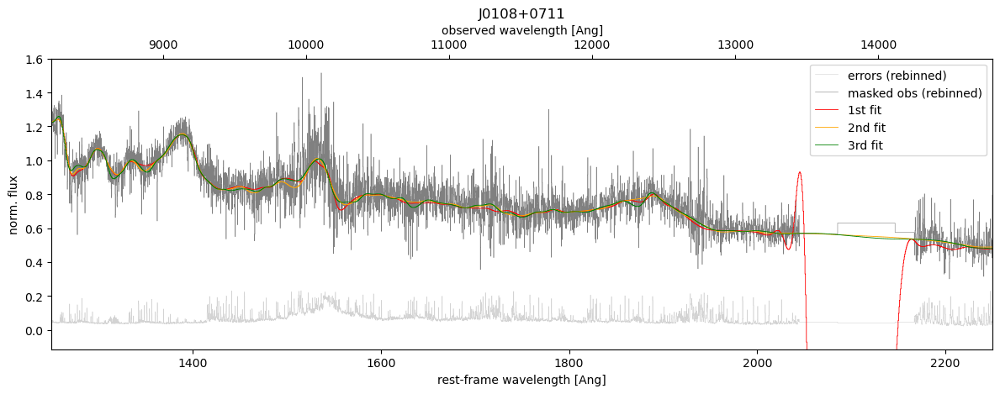

J1335-0328


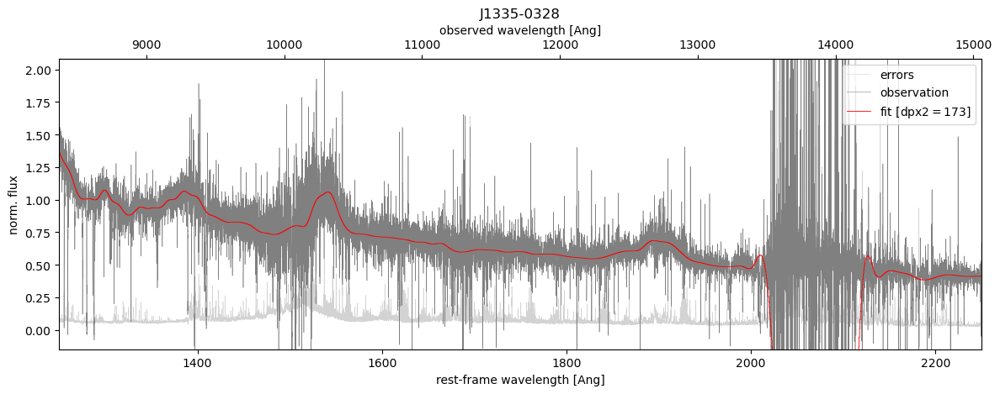

38889


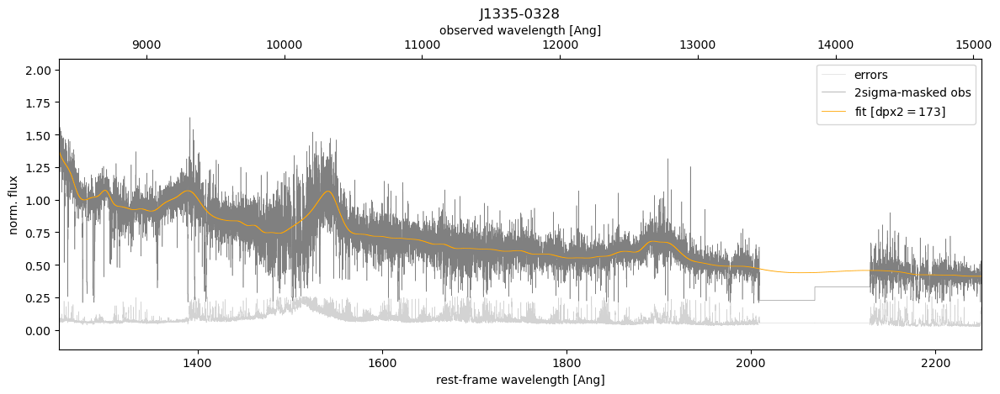

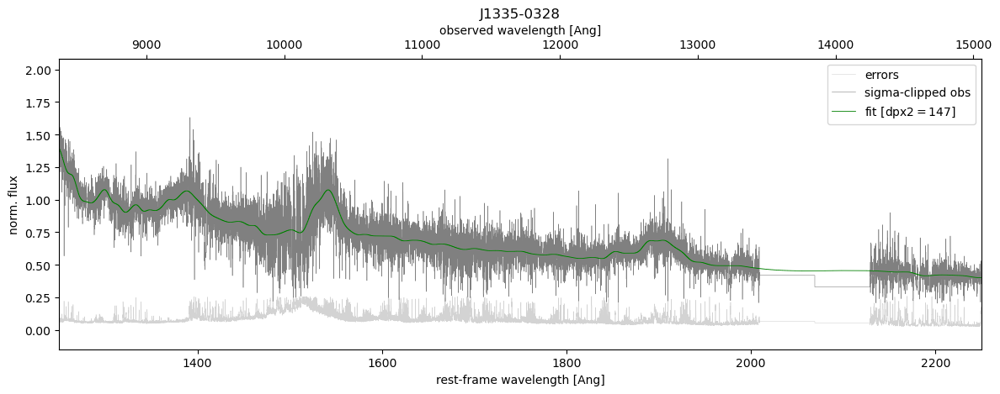

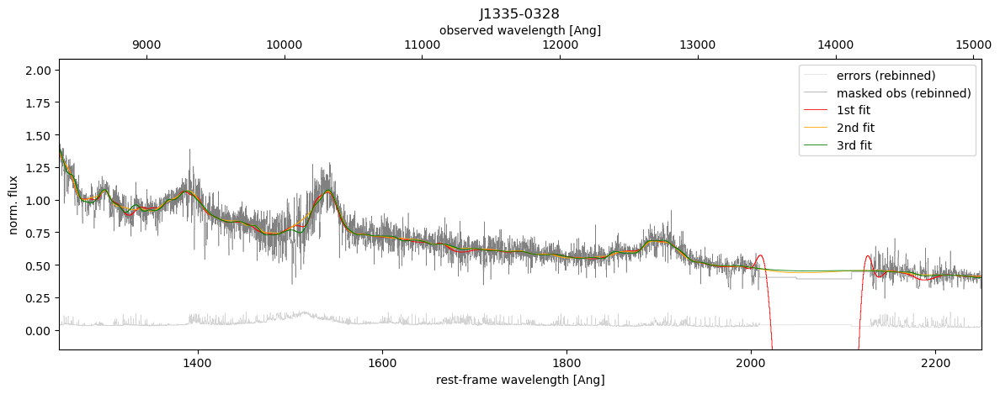

J2100-1715


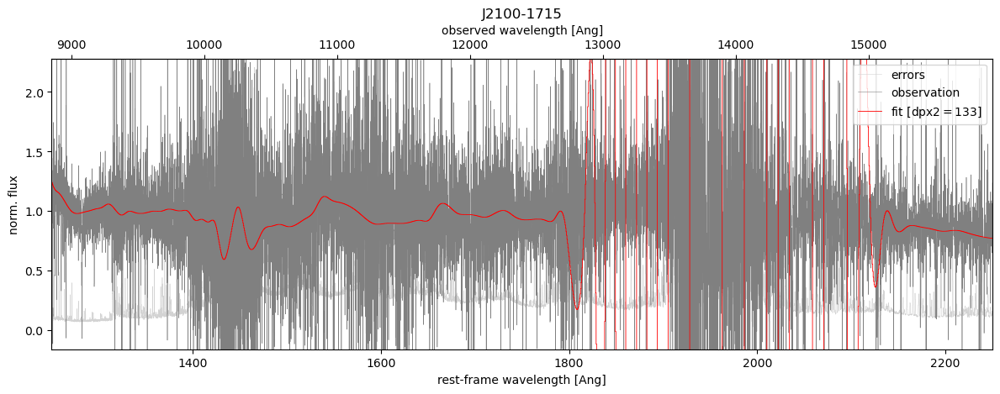

33326
1st fit was not possible: IndexError


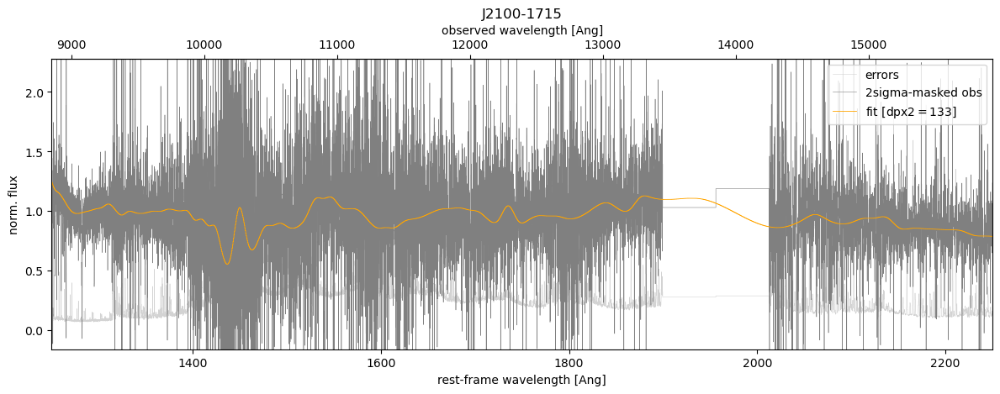

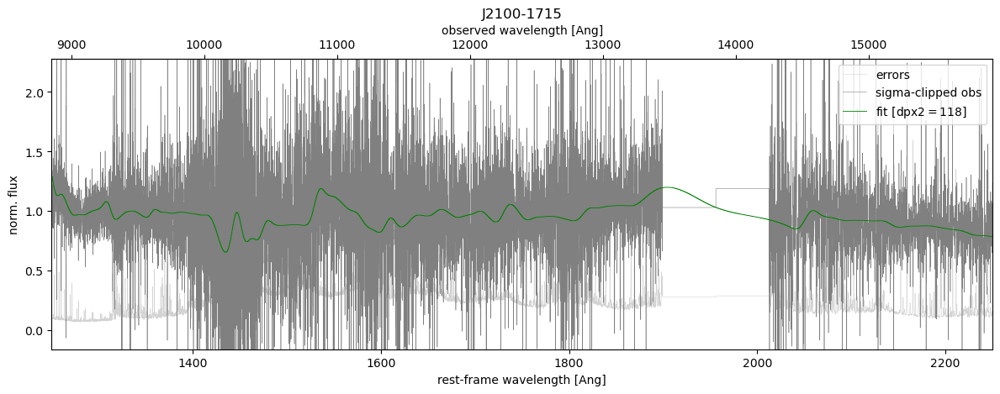

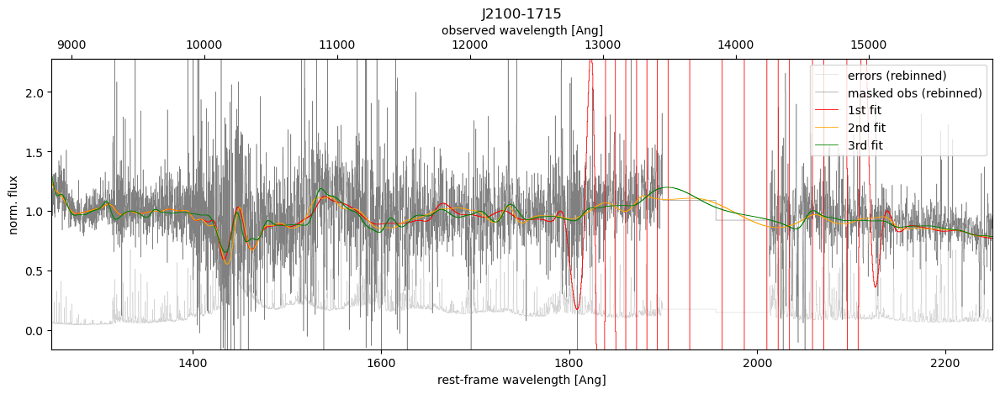

J2207-0416


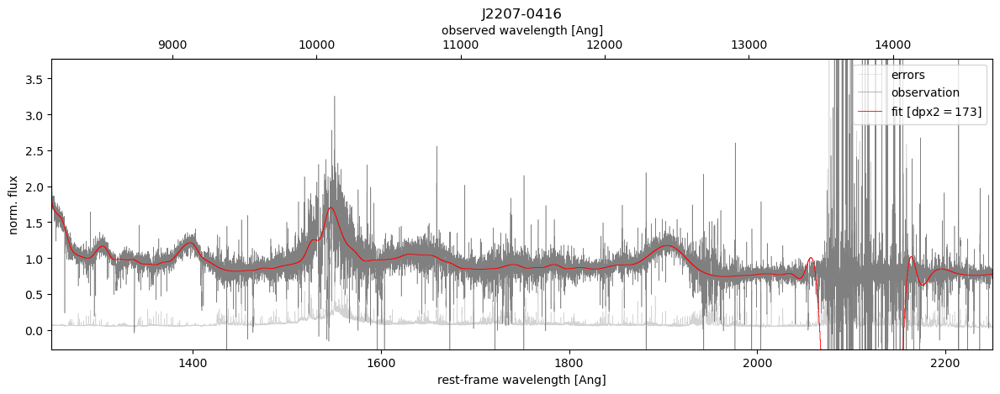

38891


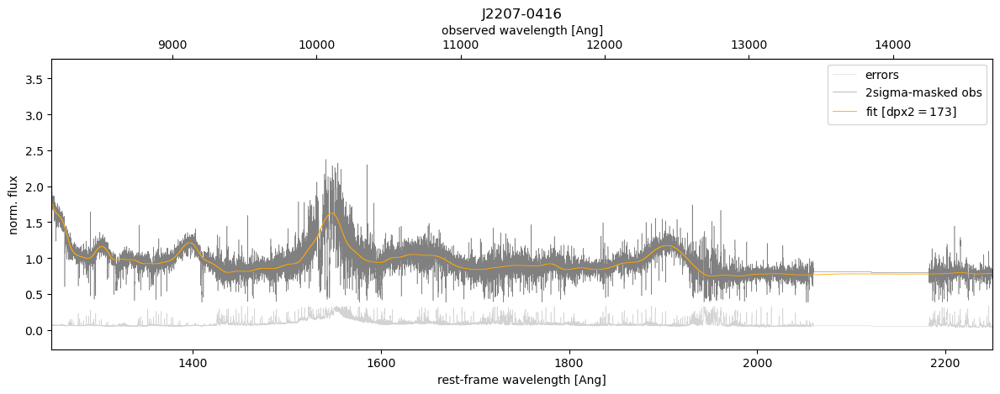

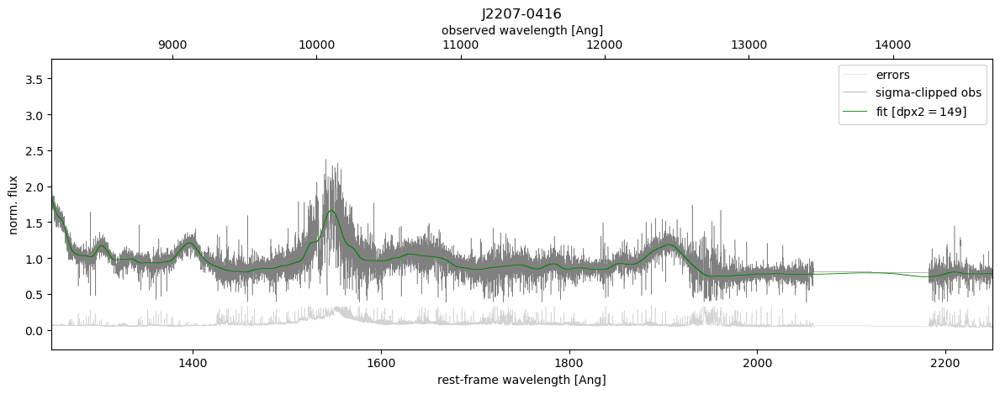

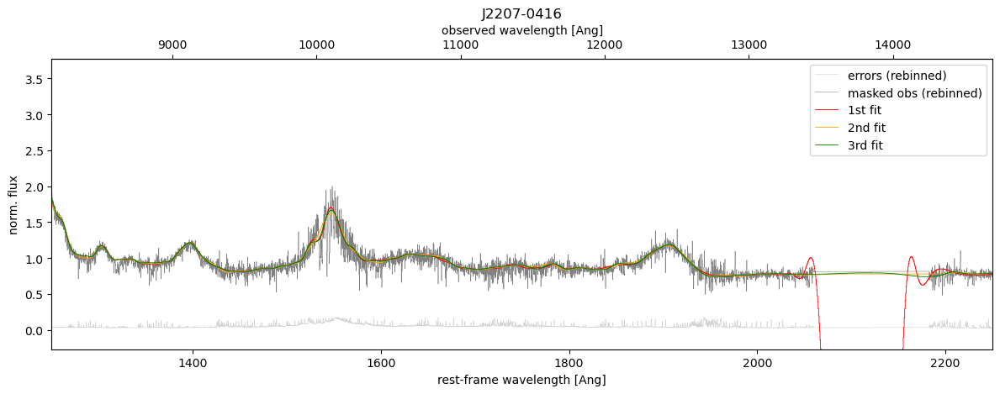

PSOJ004+17


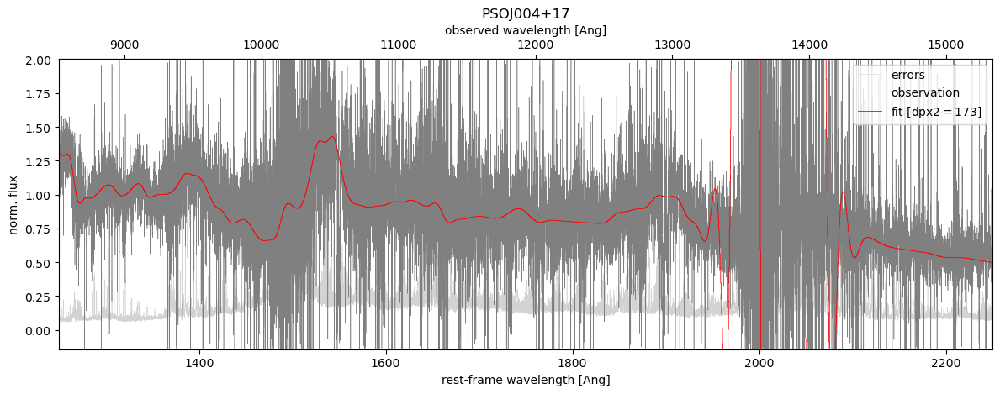

38890


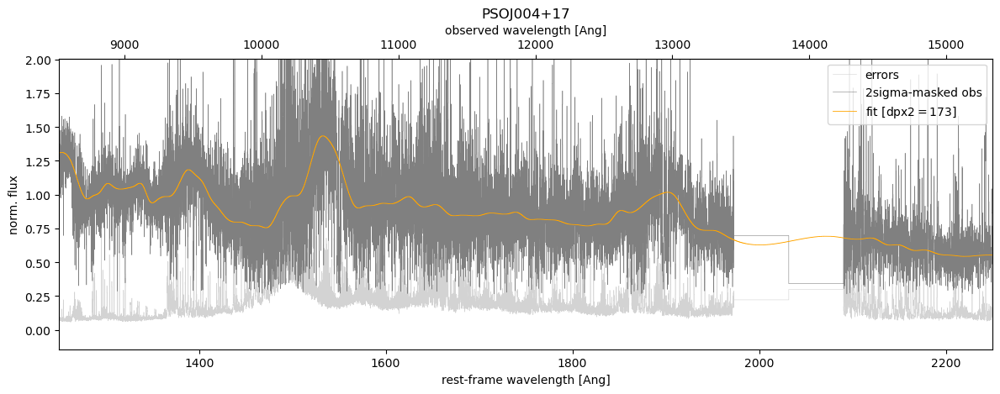

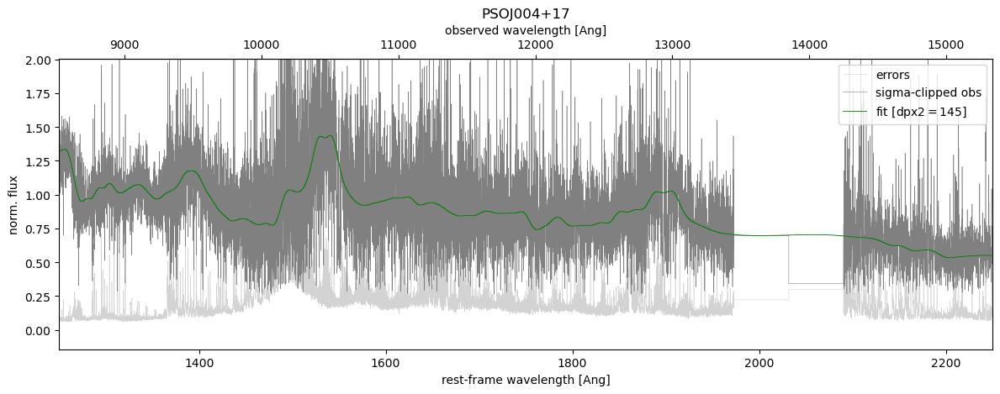

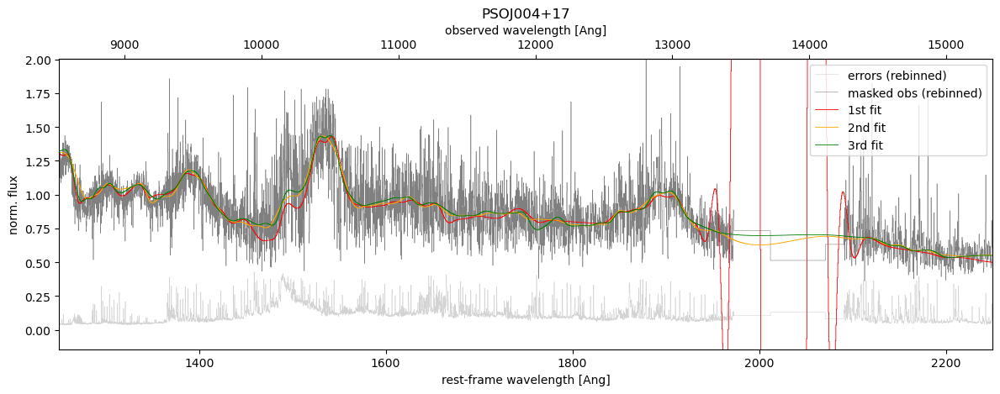

PSOJ011+09


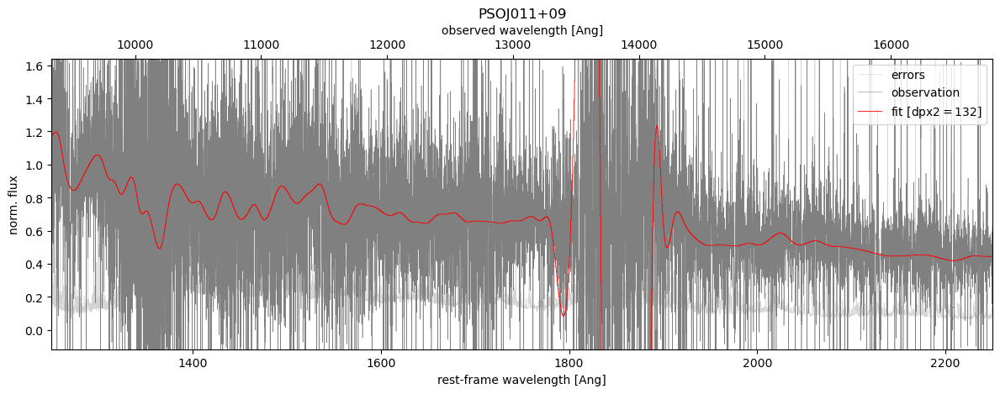

33384
1st fit was not possible: IndexError


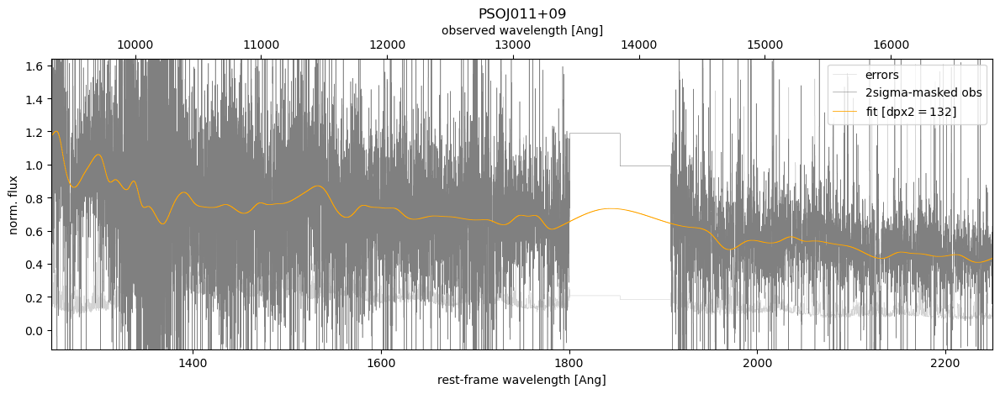

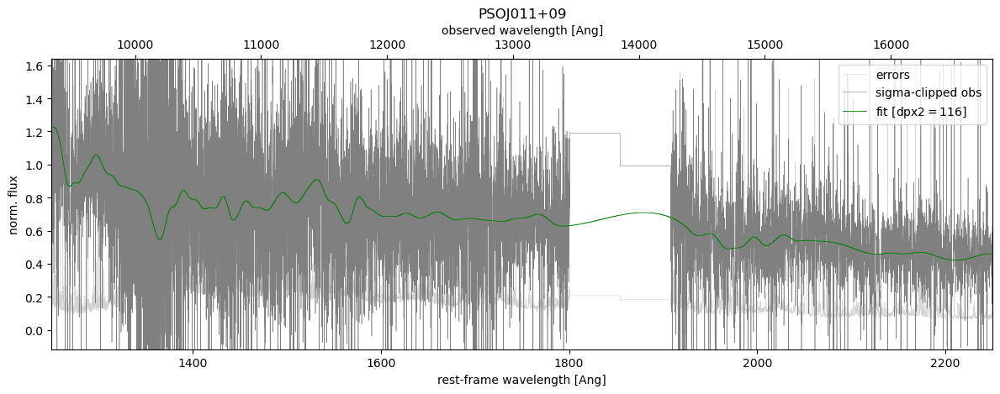

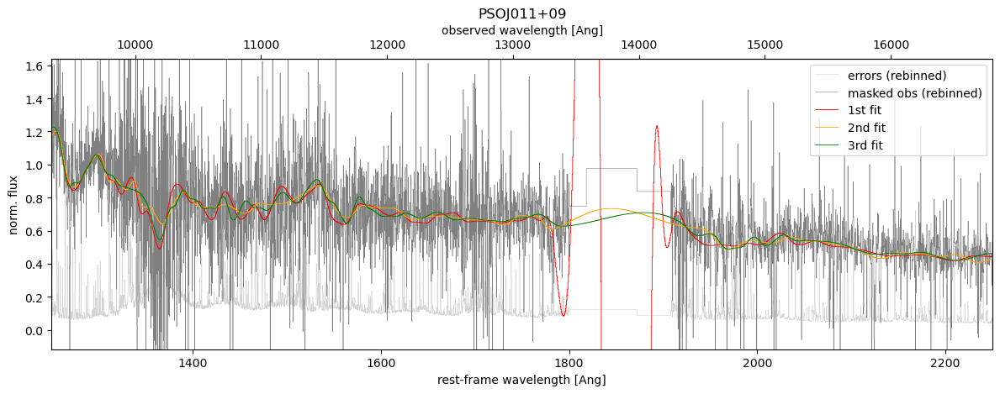

PSOJ056-16


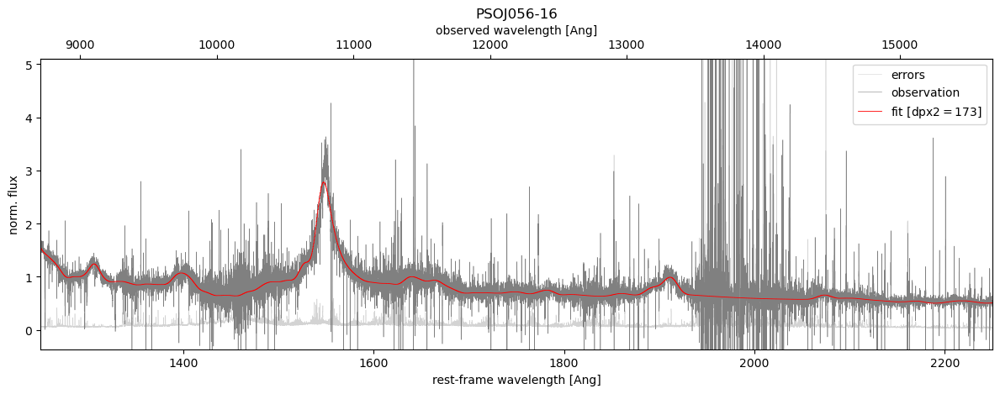

38890


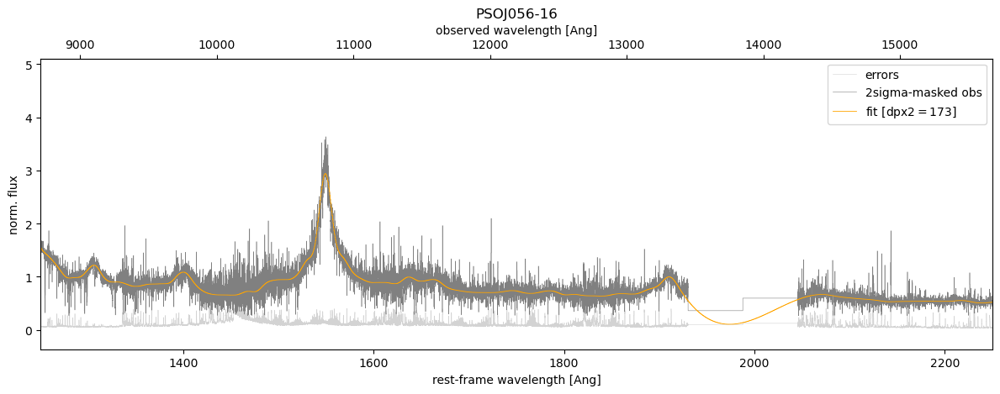

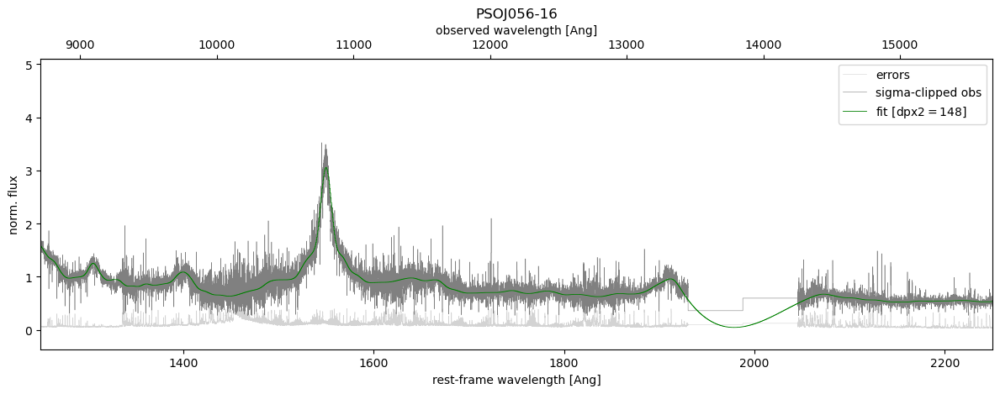

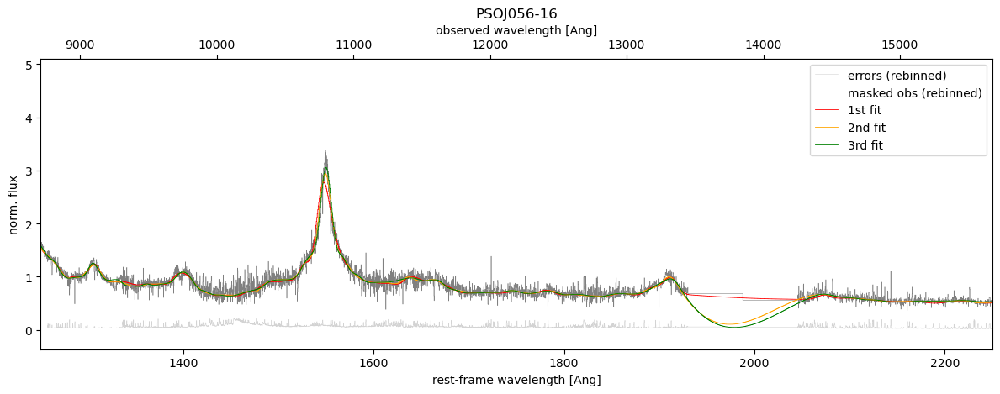

PSOJ159-02


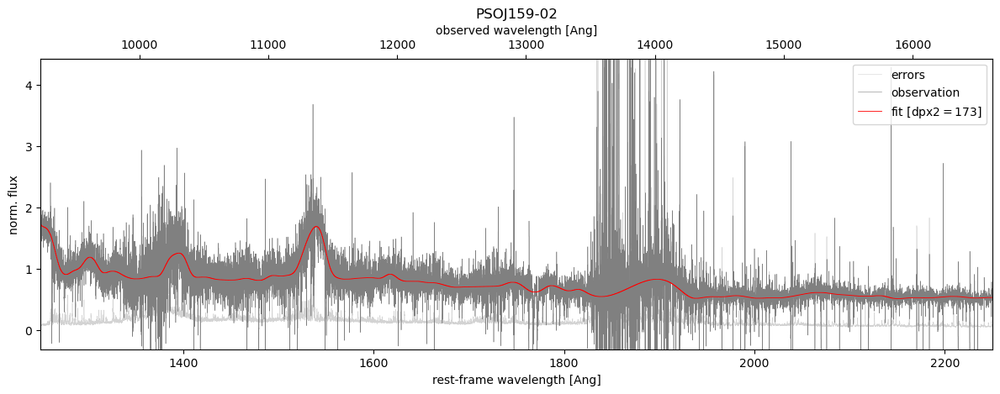

38891


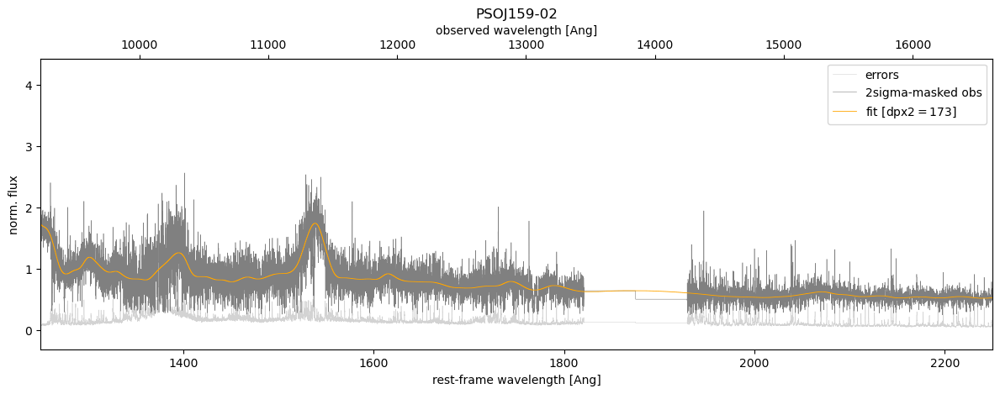

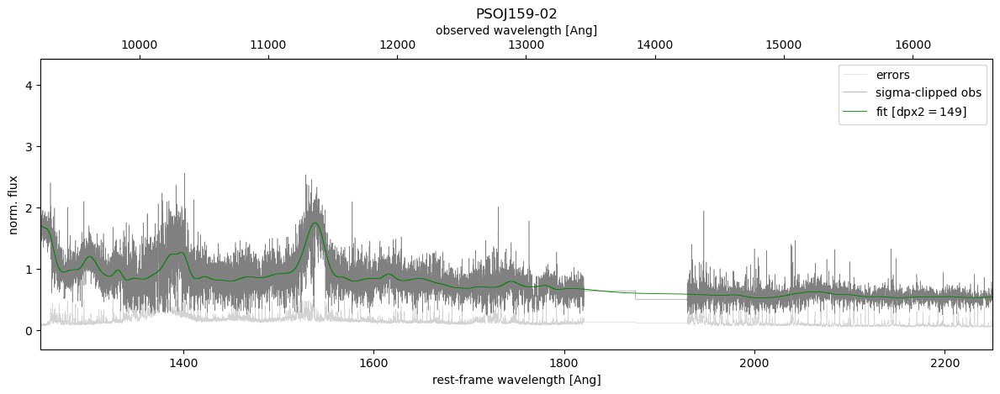

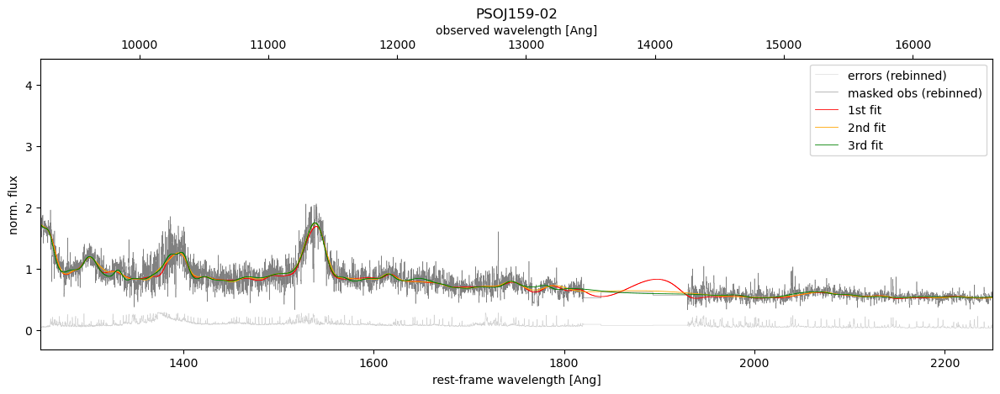

PSOJ215.1514-16.0417


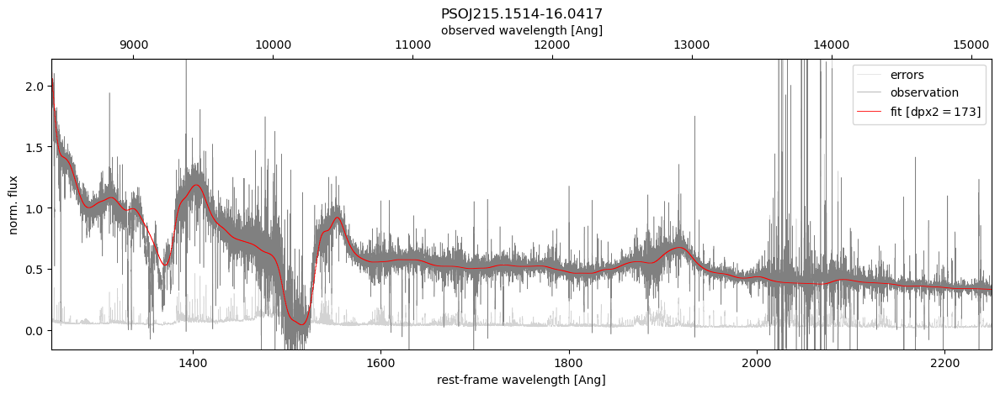

38890


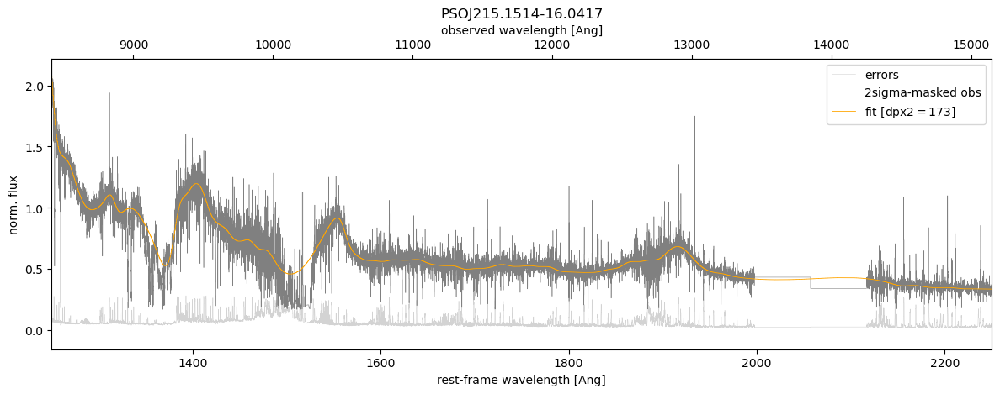

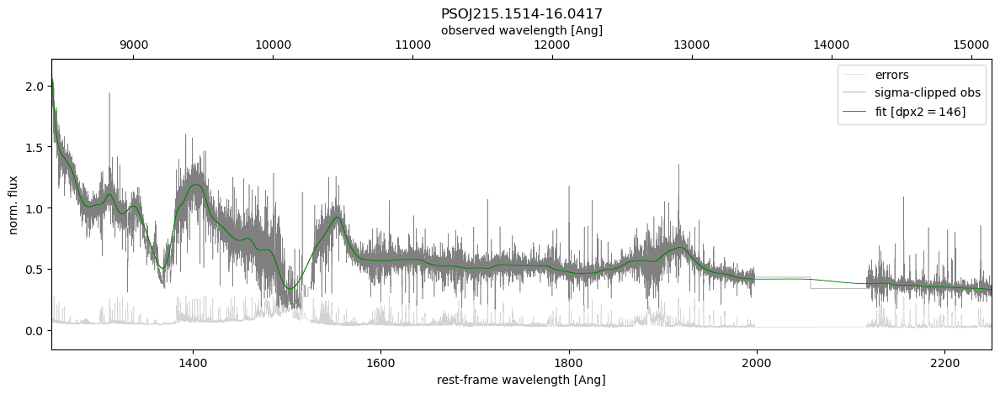

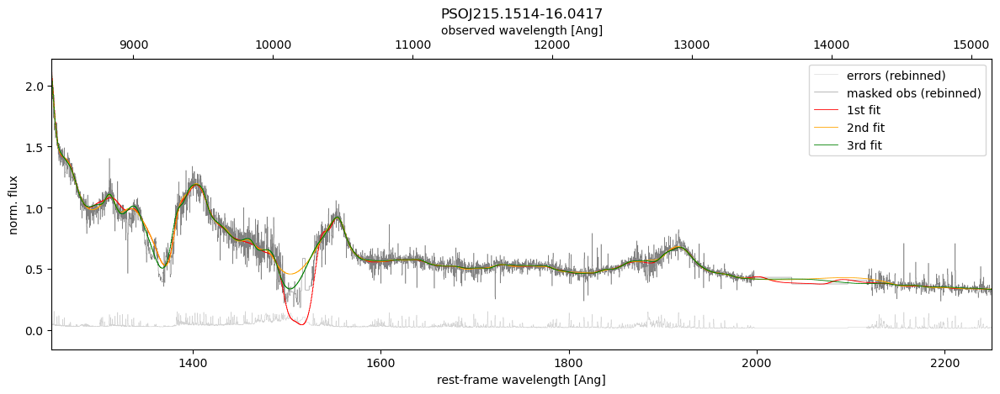

PSOJ308-21


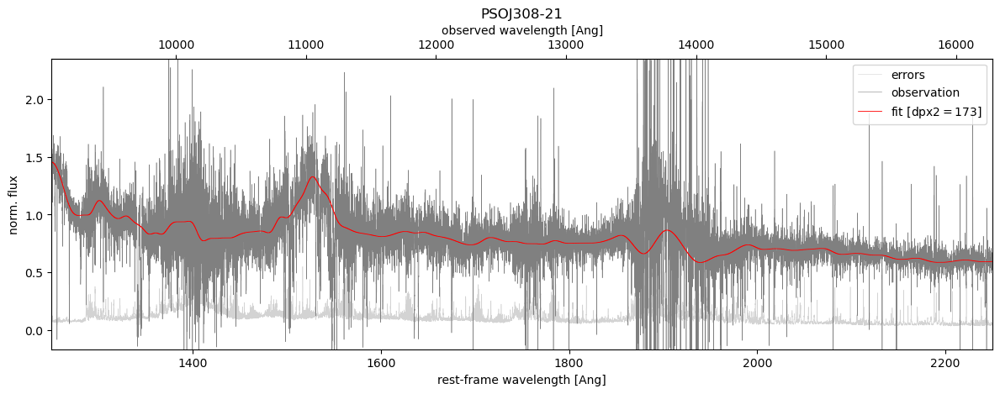

38890


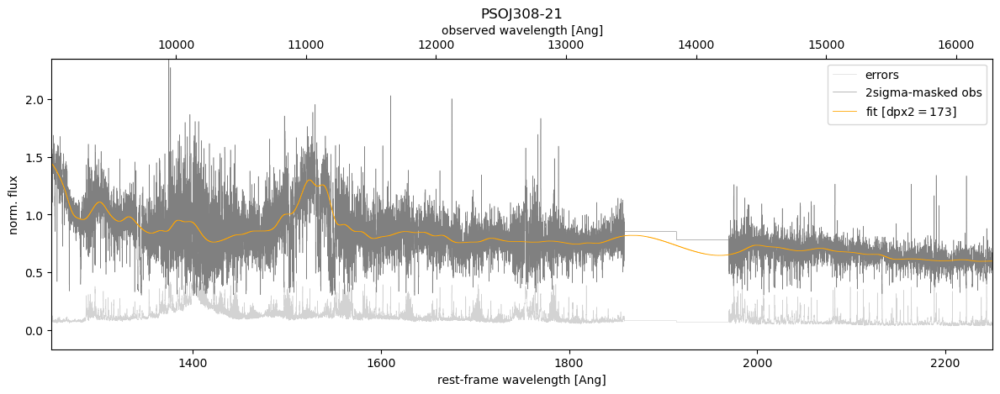

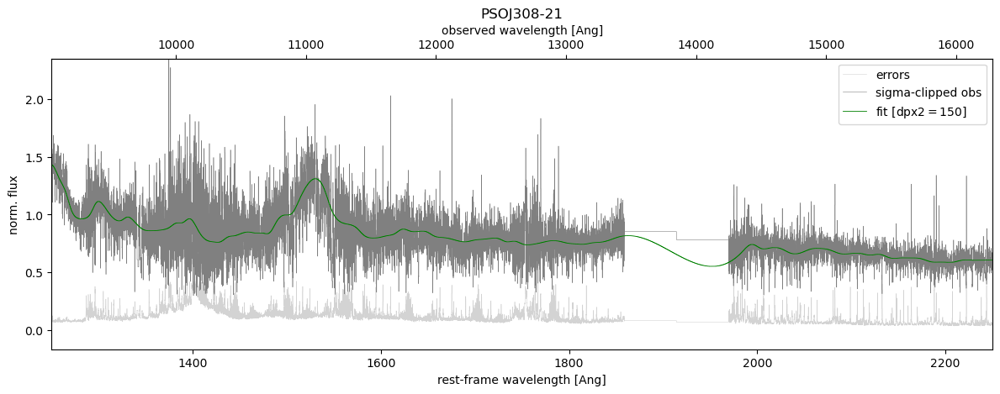

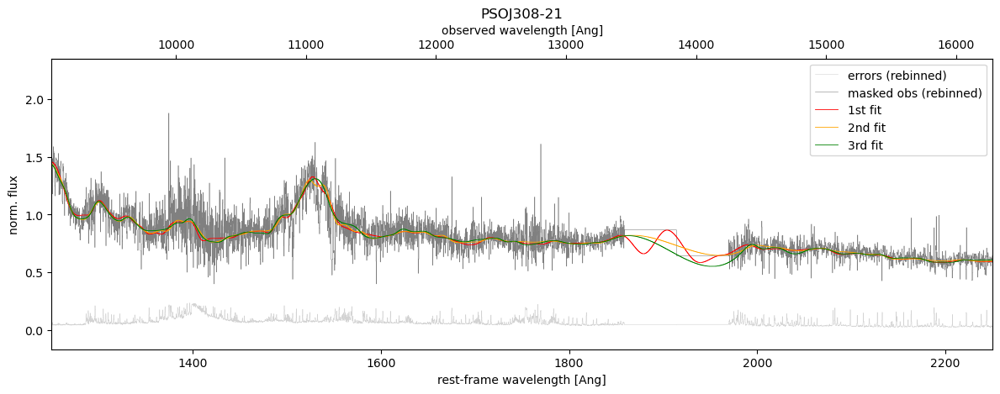

PSOJ340-18


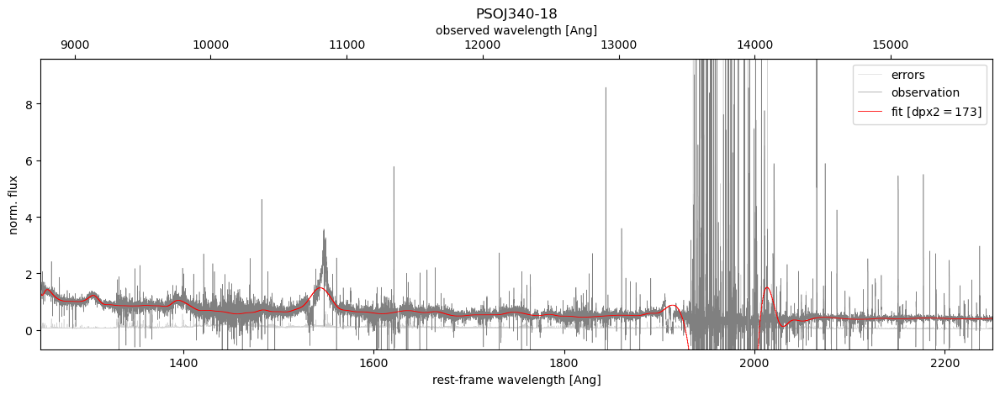

38891


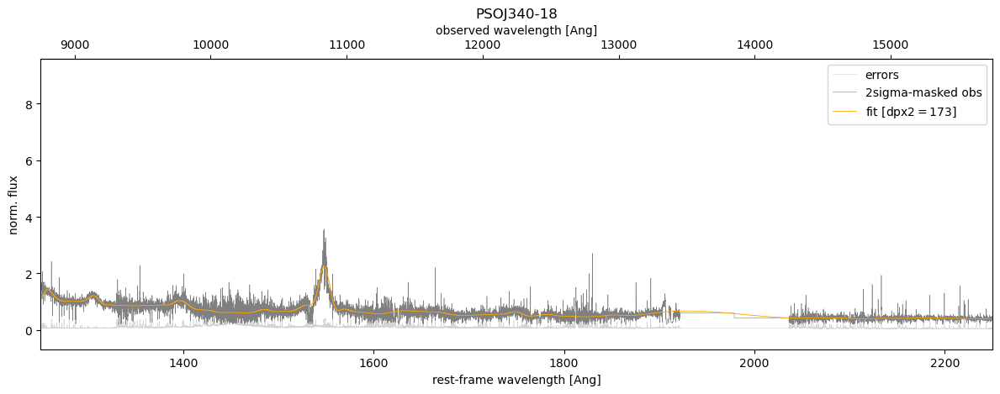

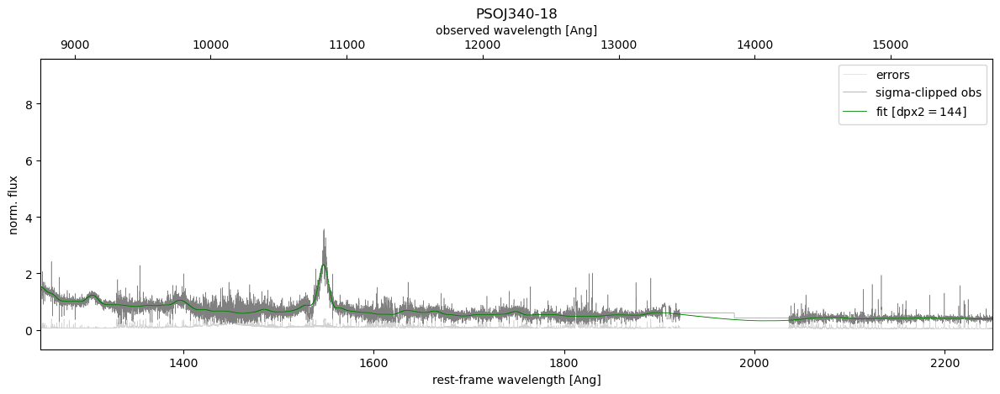

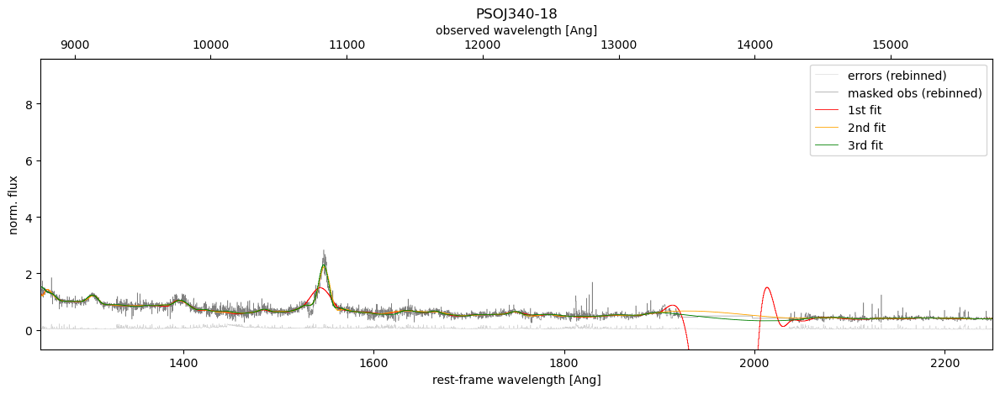

ULASJ1207+0630


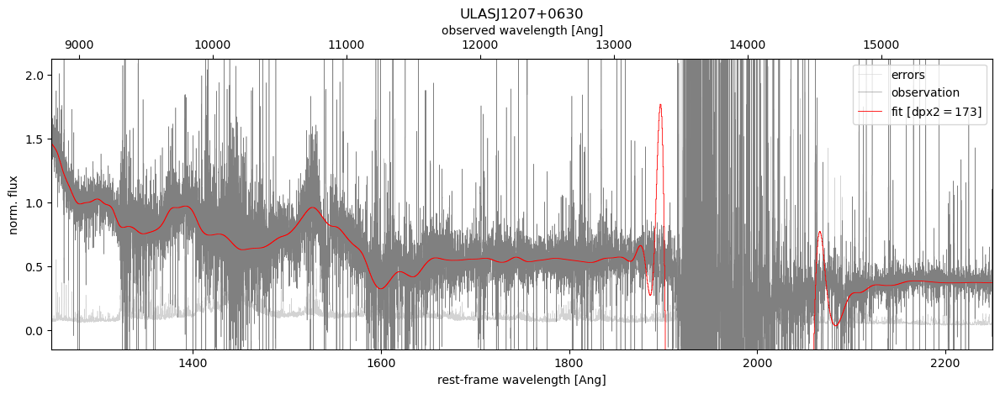

38890


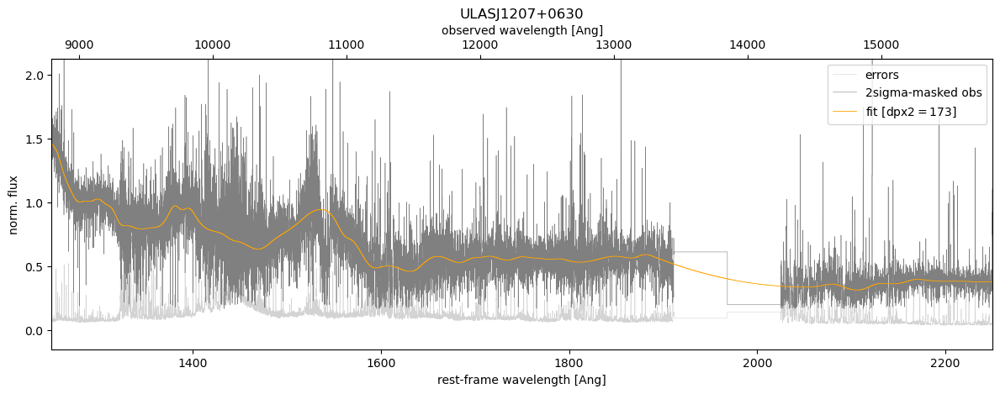

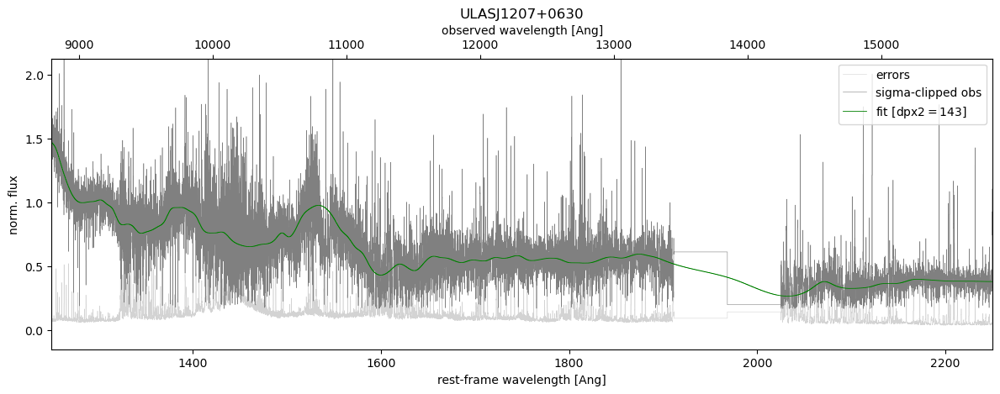

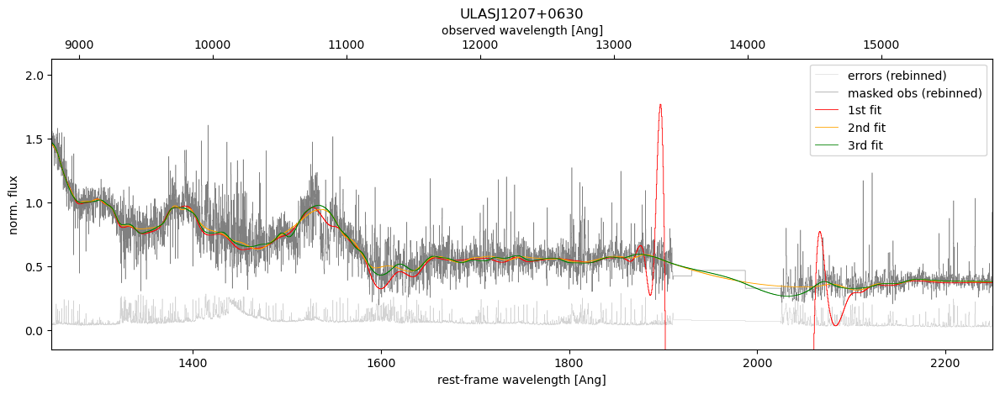

VDESJ0330-4025


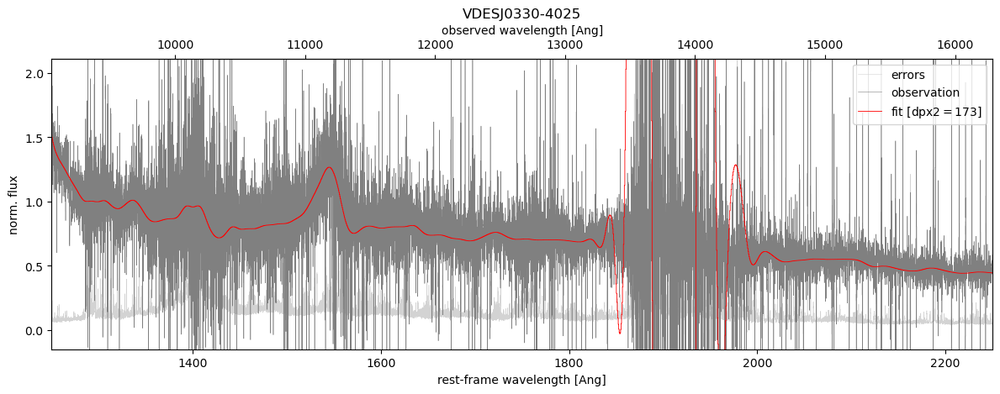

38890


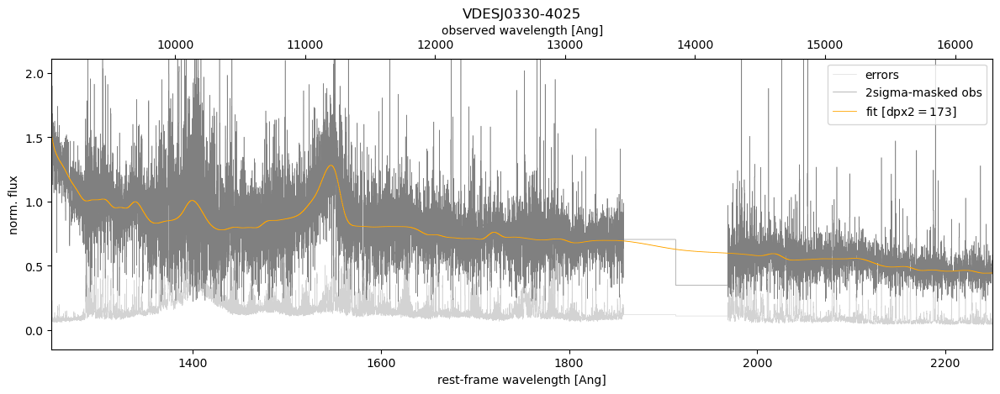

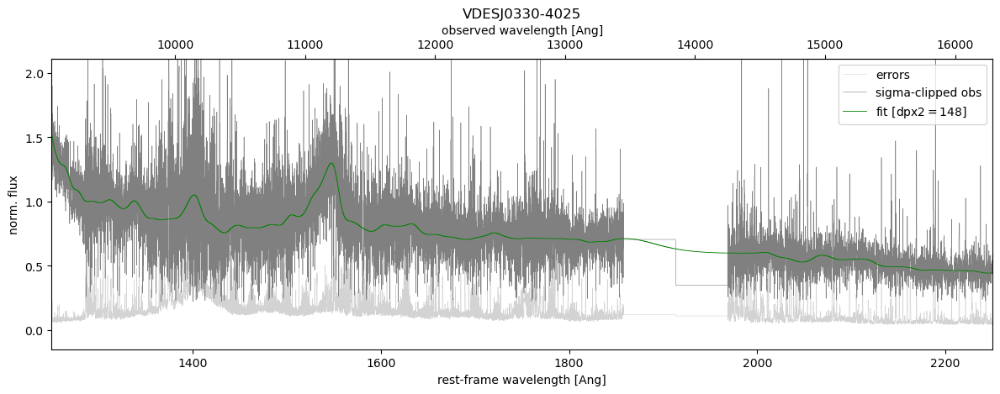

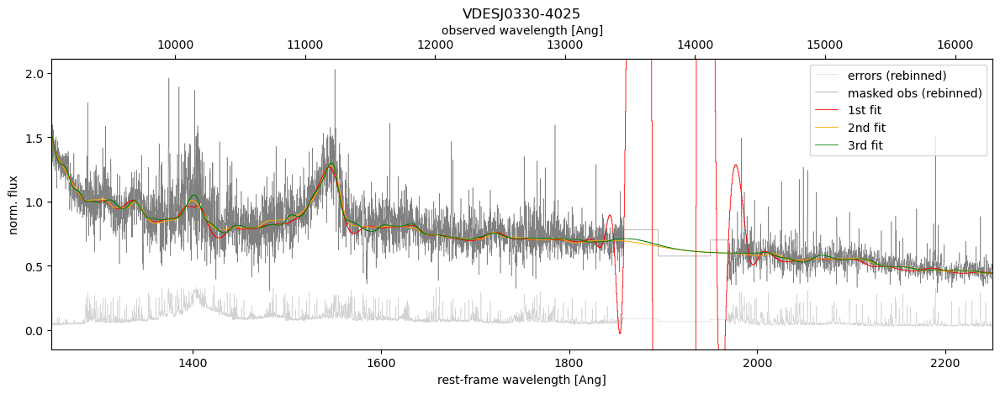

VIKJ0046-2837


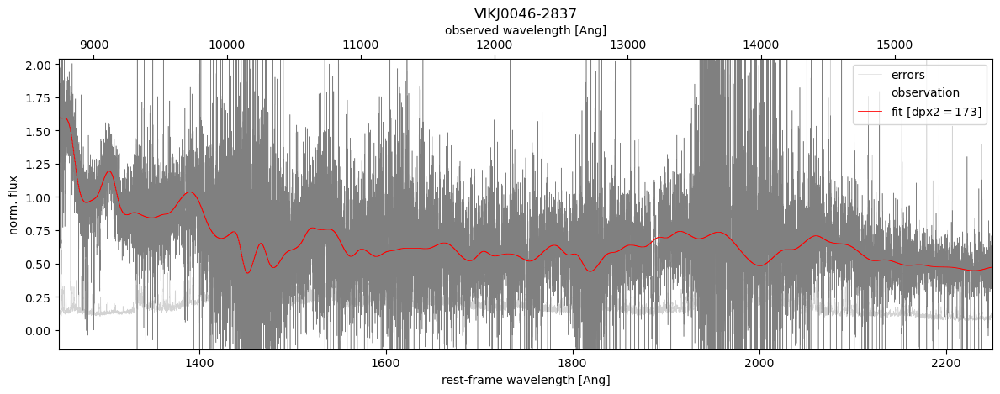

38890


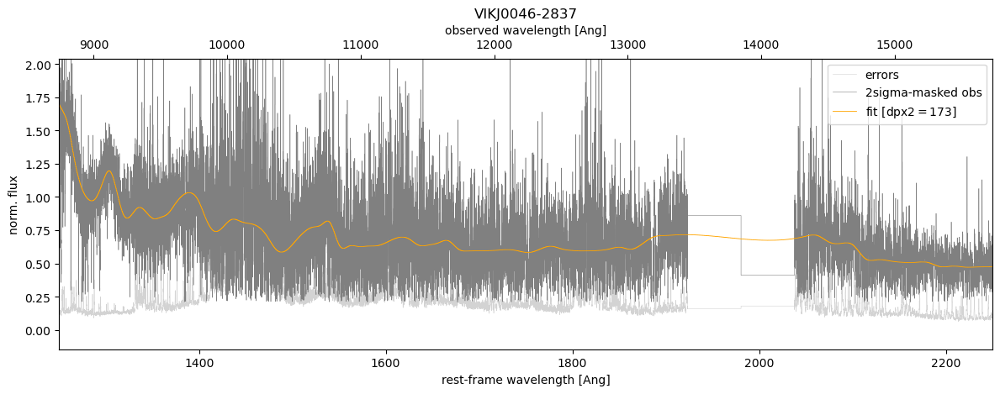

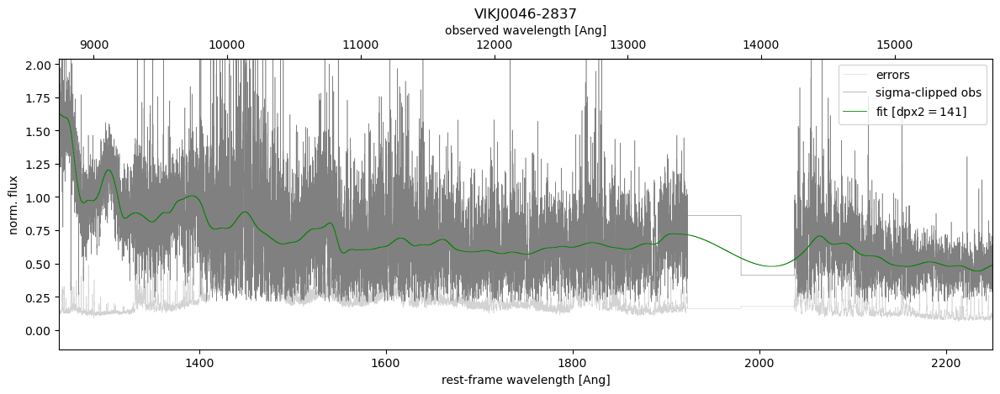

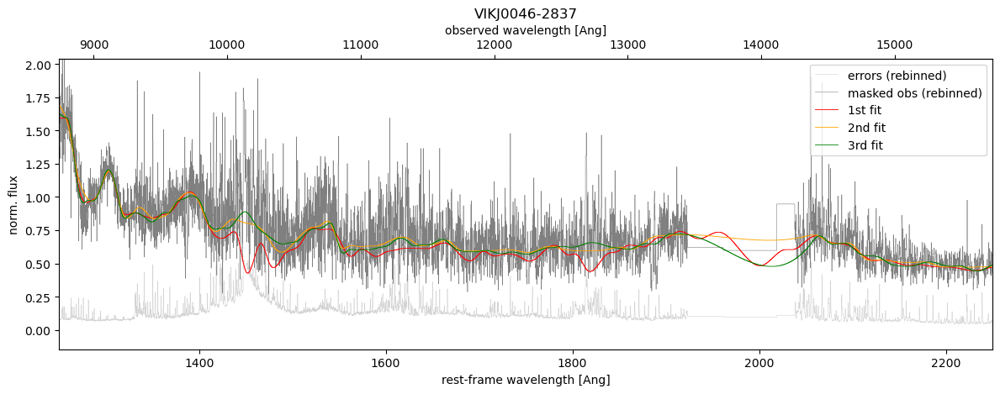

VIKJ2318-3029


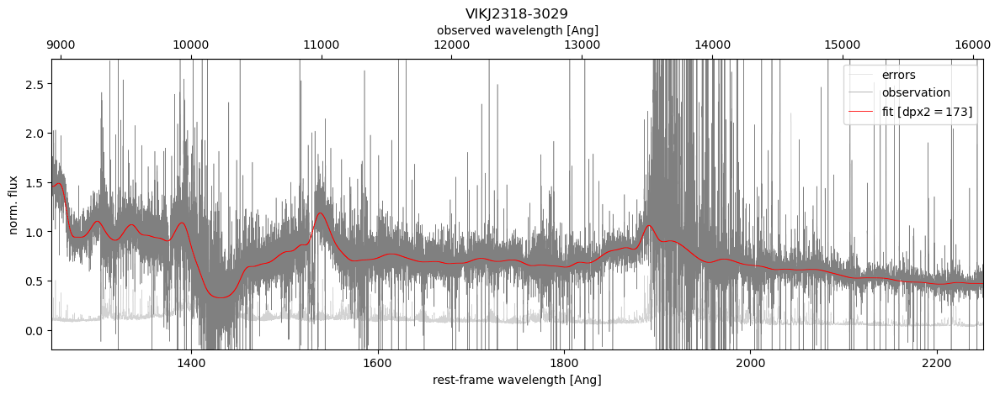

38891


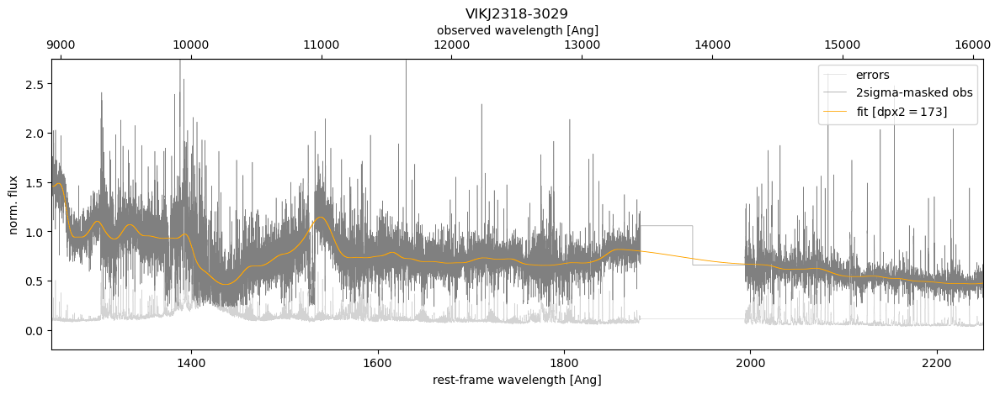

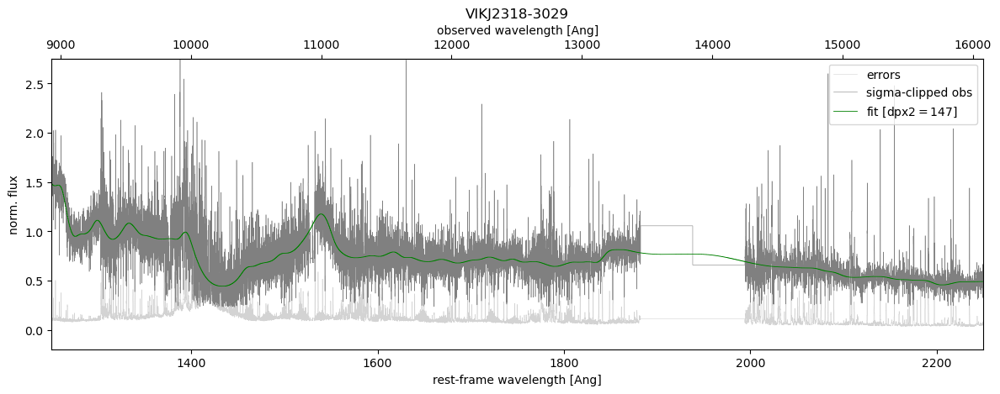

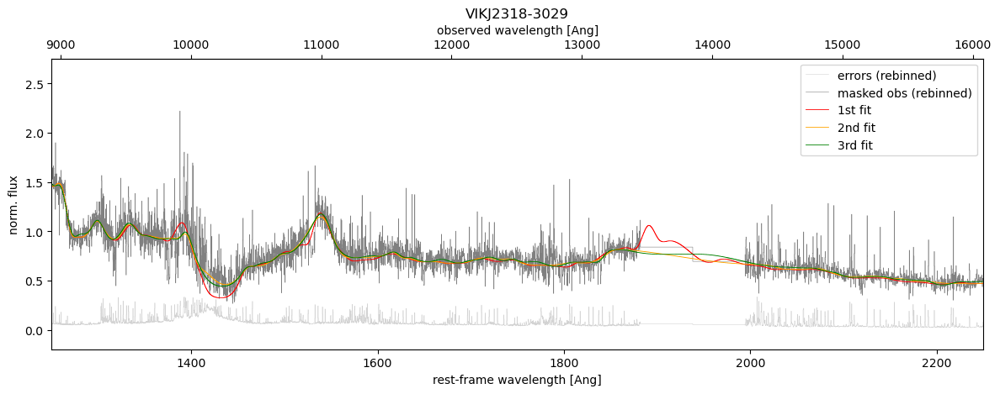

PSOJ060+24


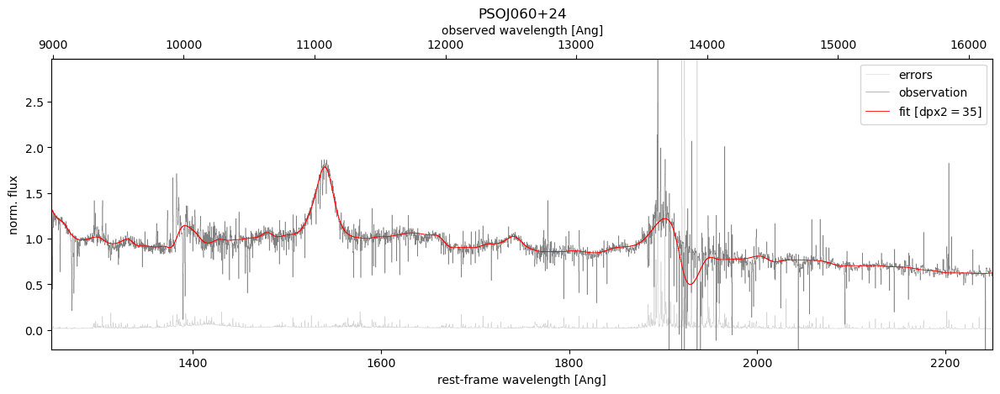

7779


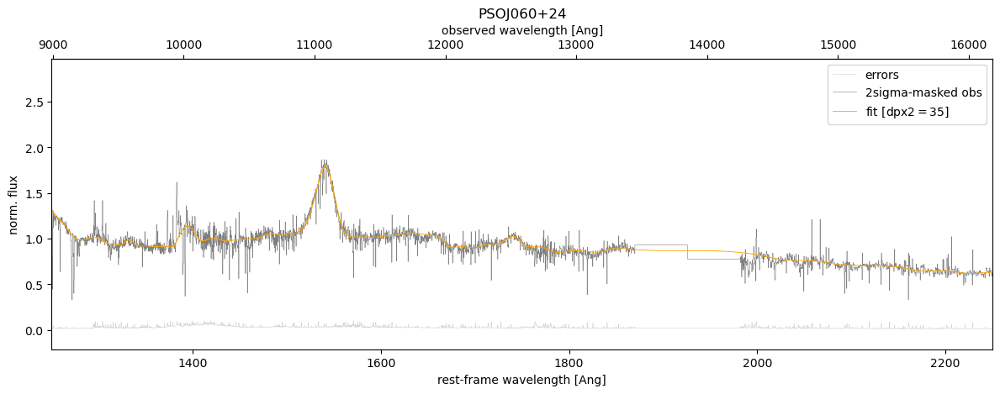

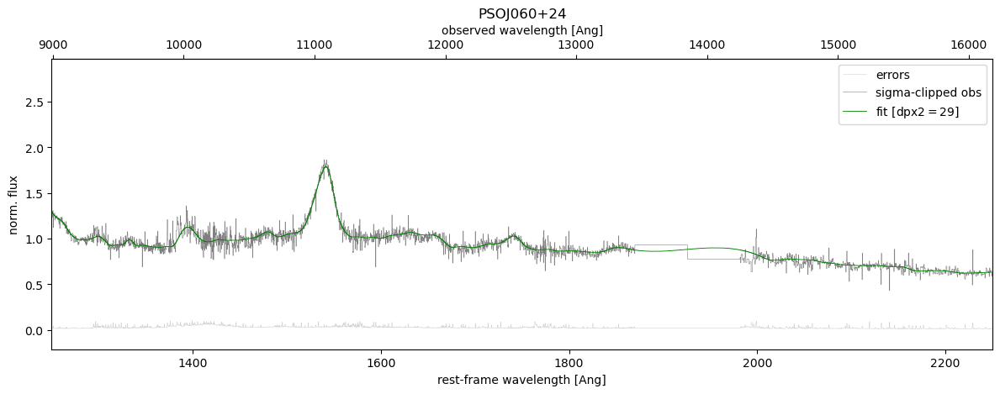

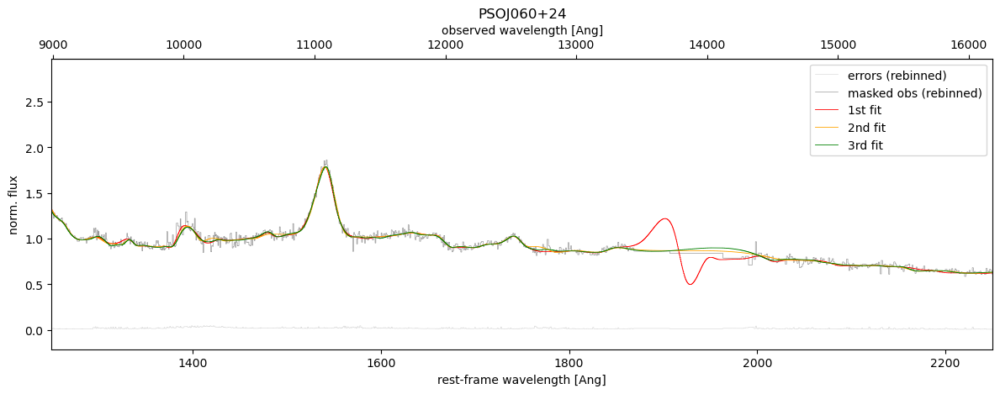

PSOJ242-12


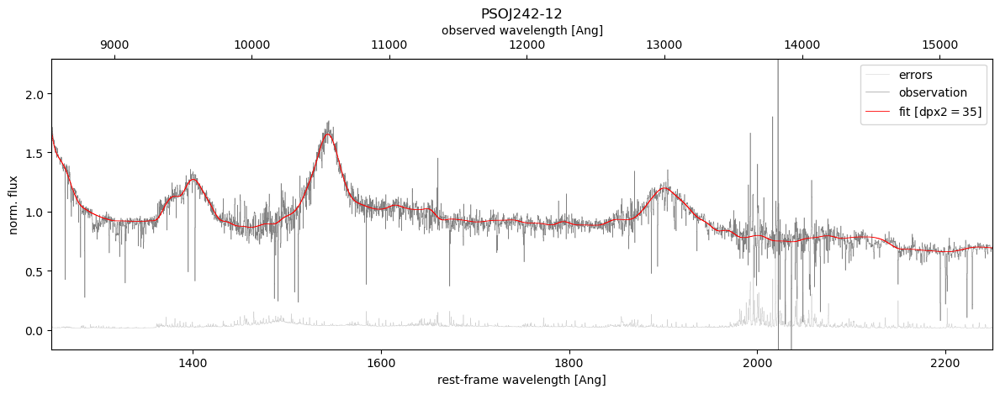

7779


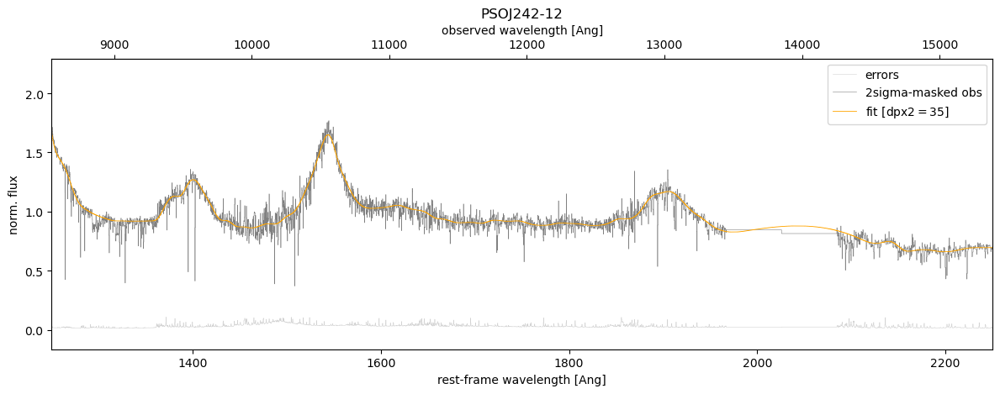

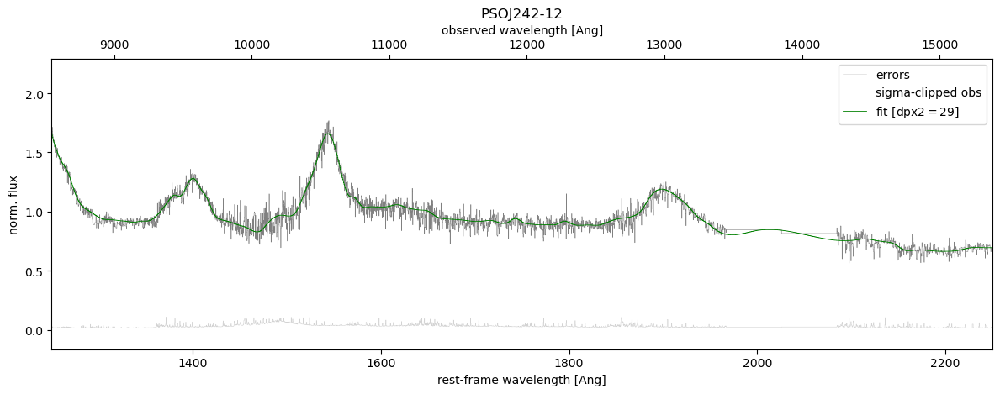

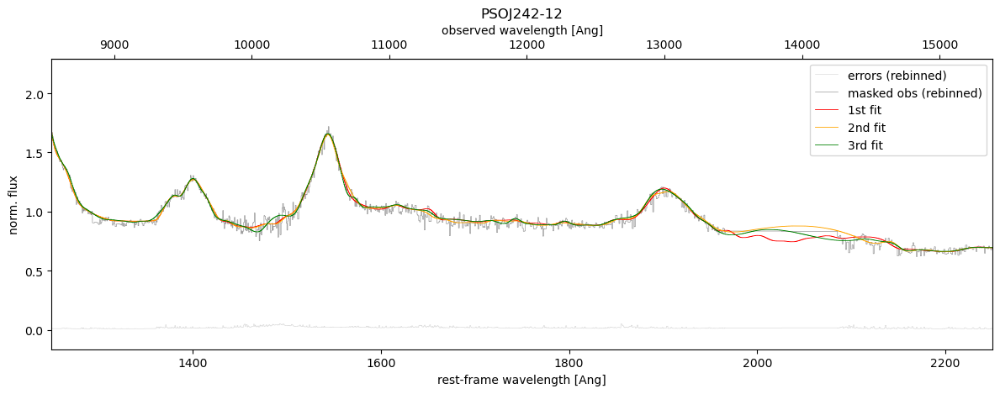

PSOJ308-27


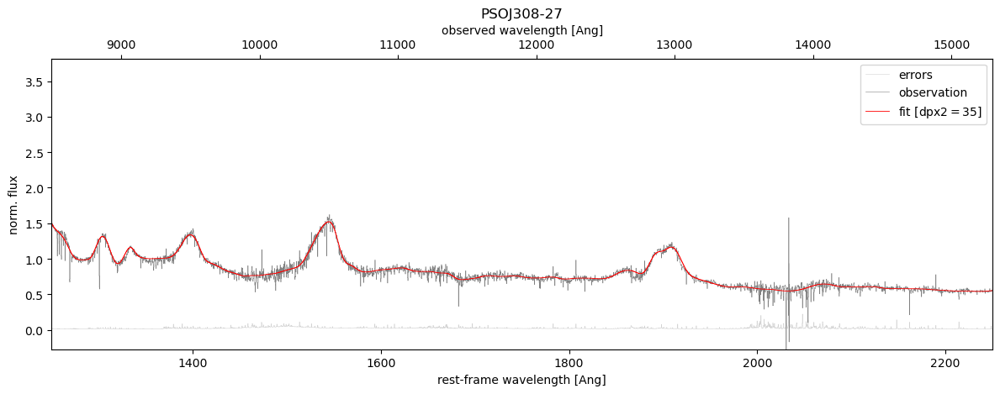

7779


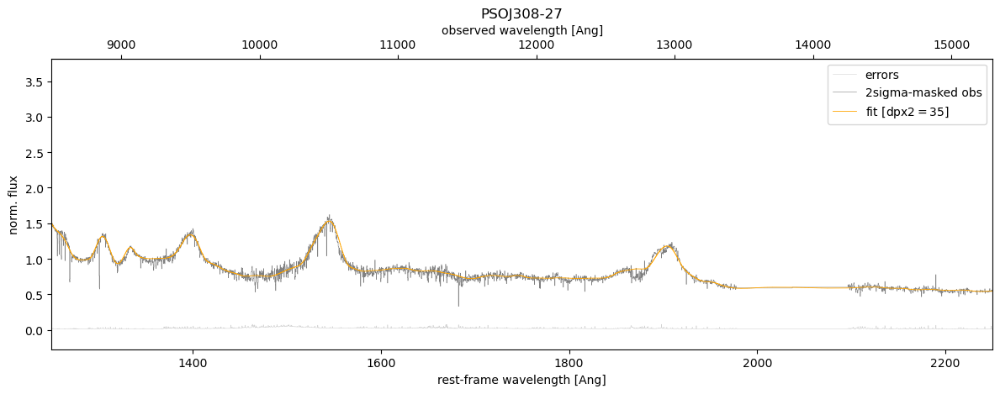

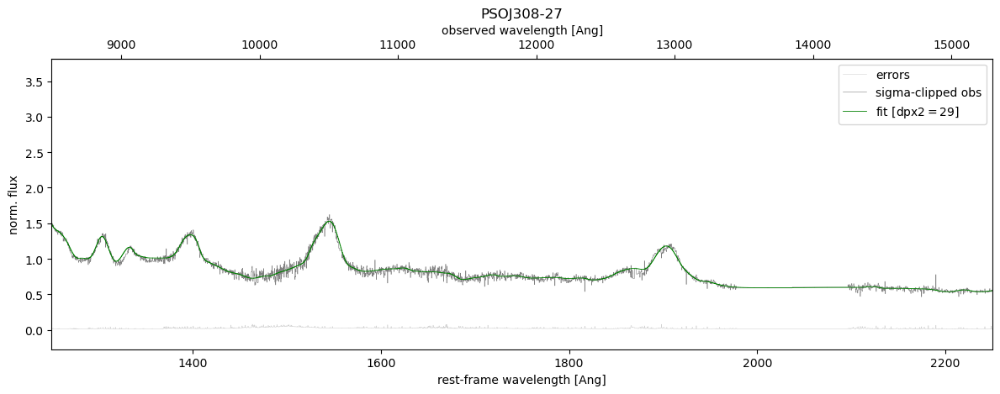

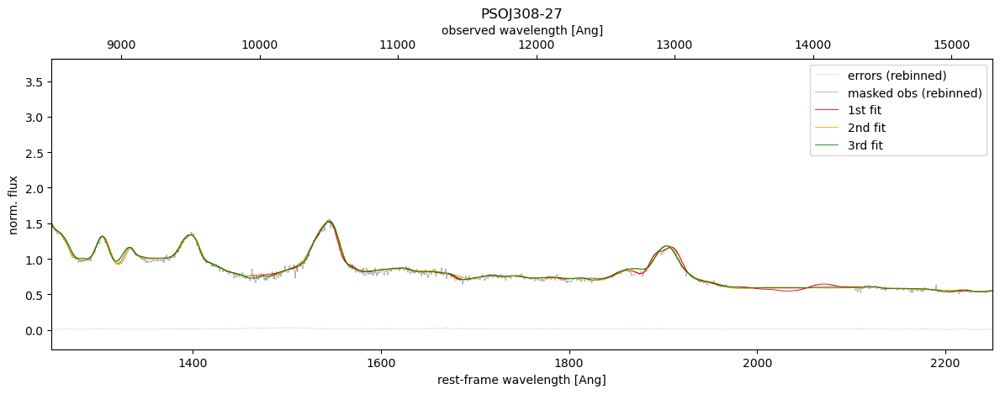

PSOJ359-06


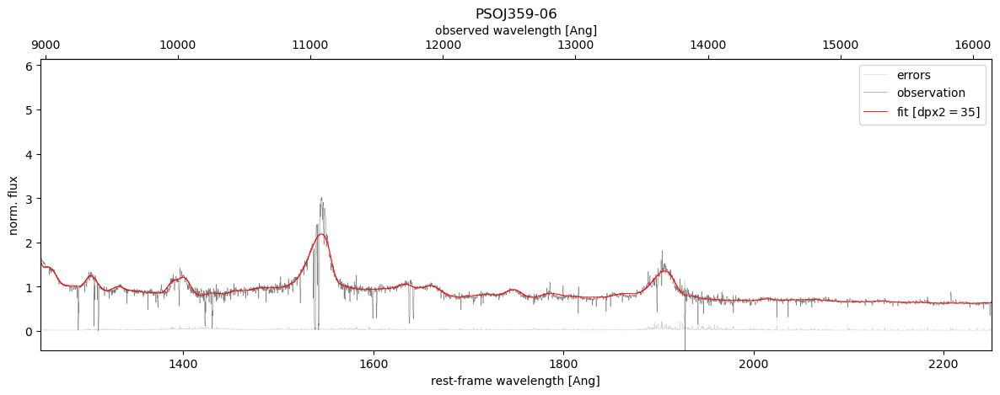

7779


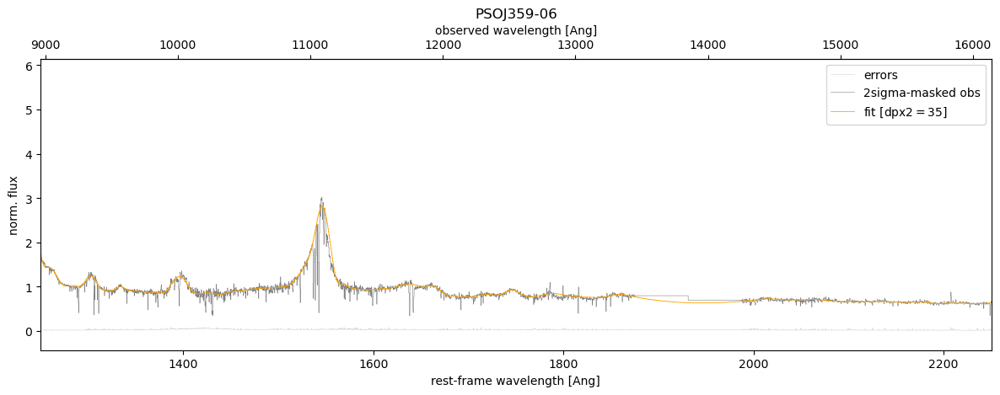

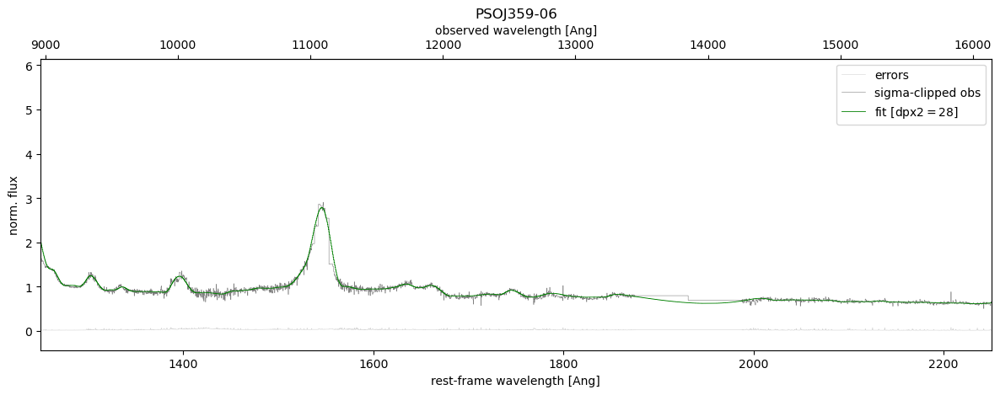

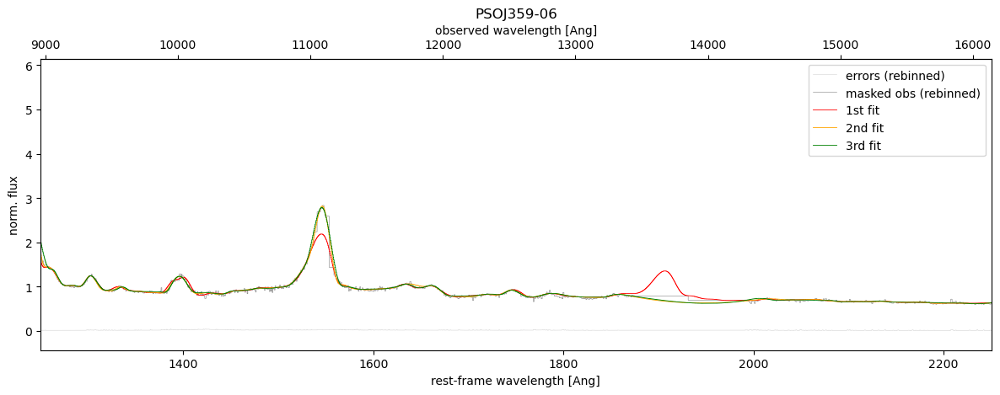

J1212+0505


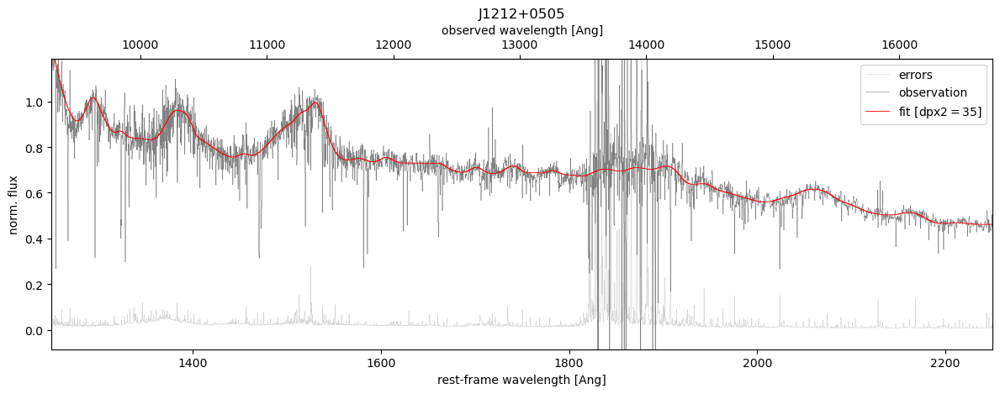

7779


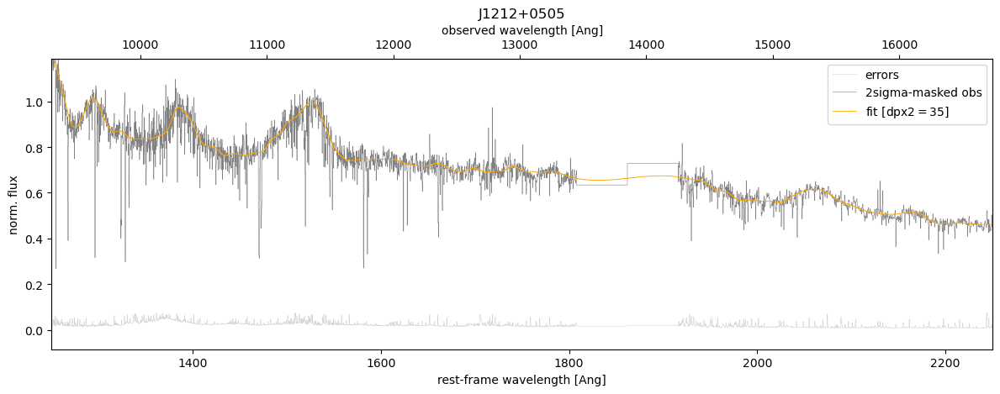

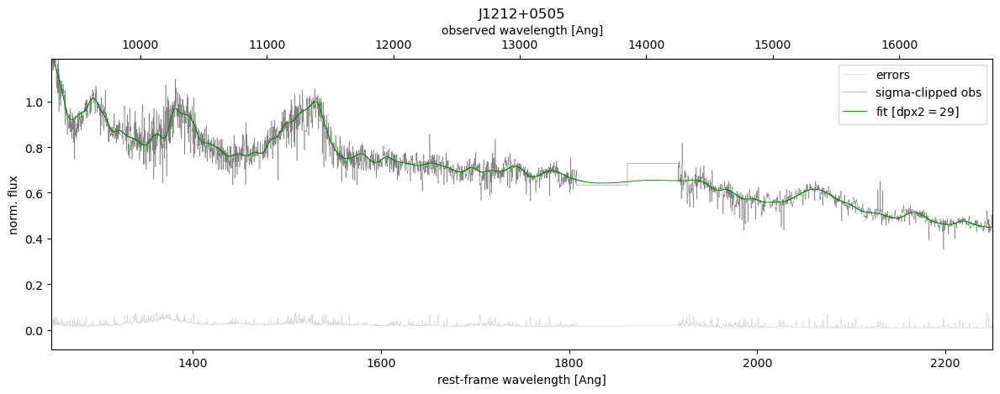

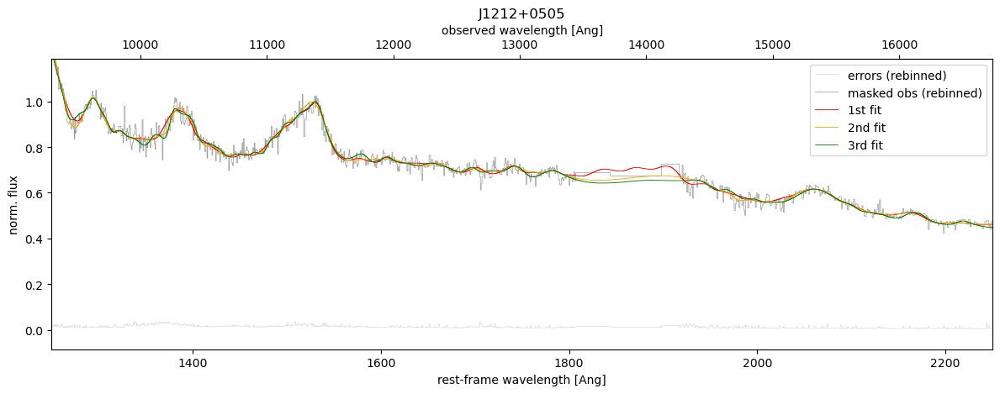

PSOJ025-11


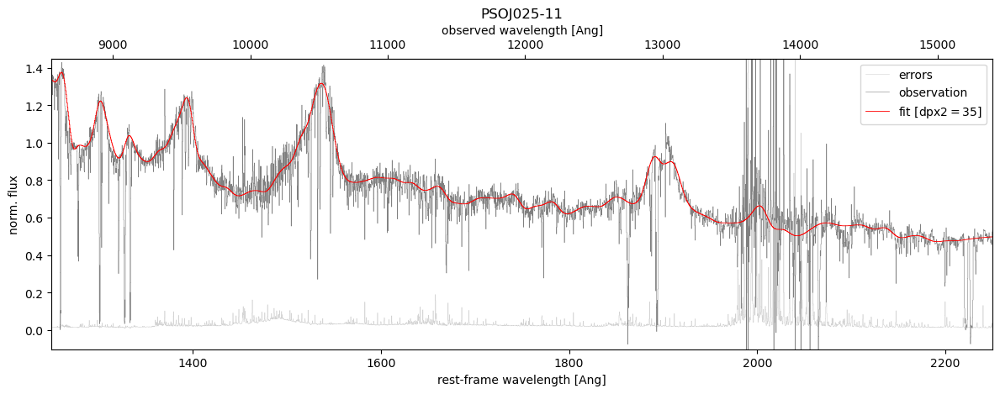

7779


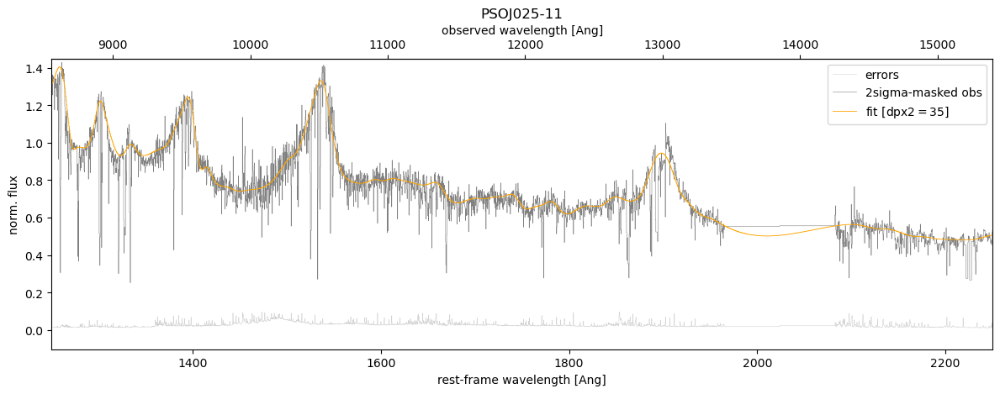

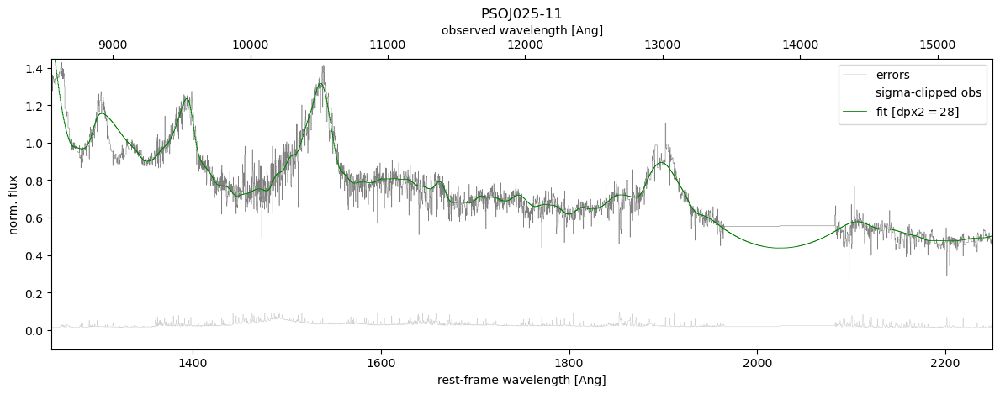

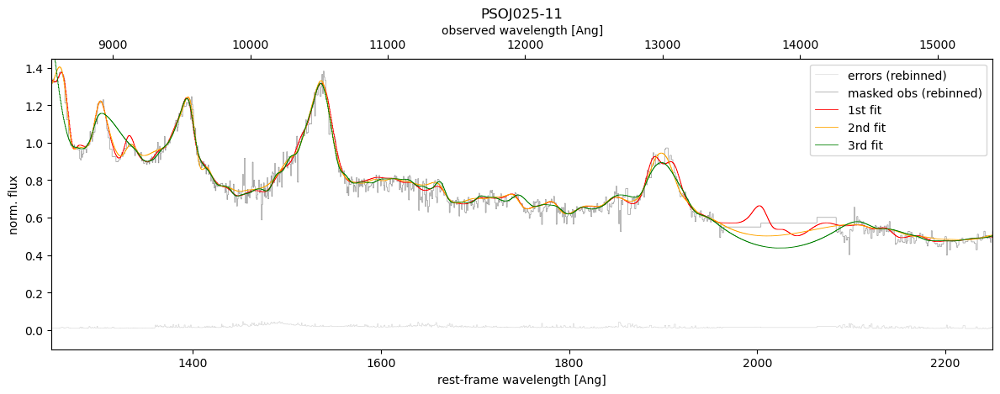

PSOJ217-16


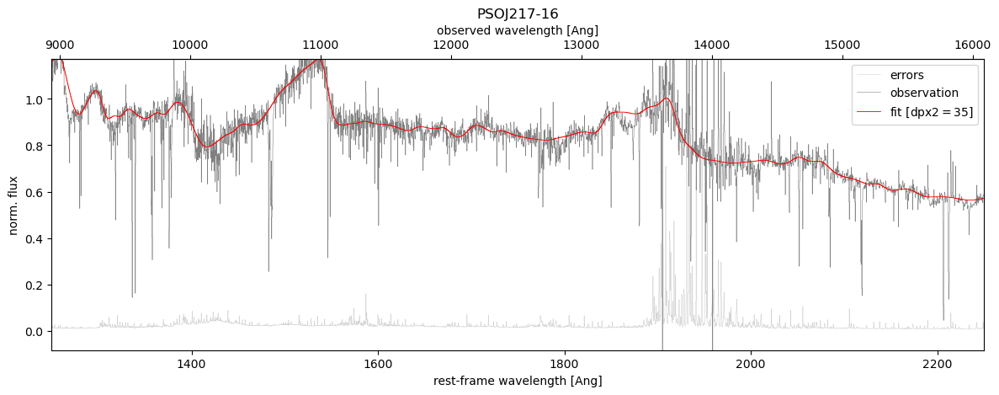

7779


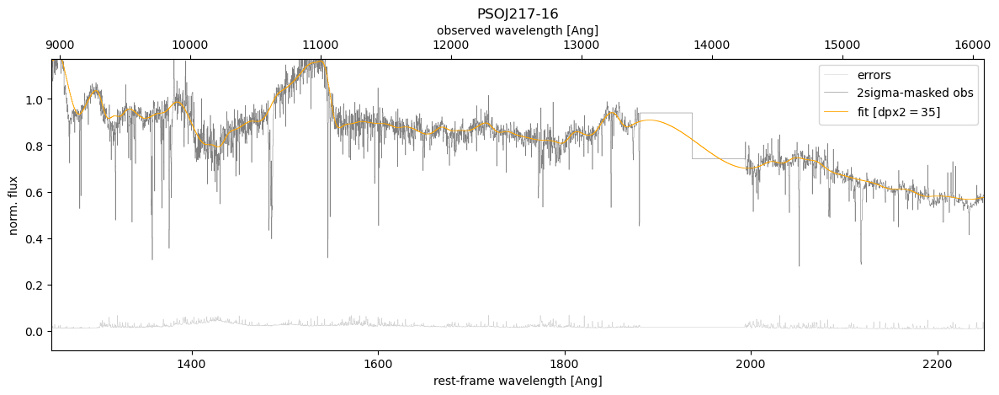

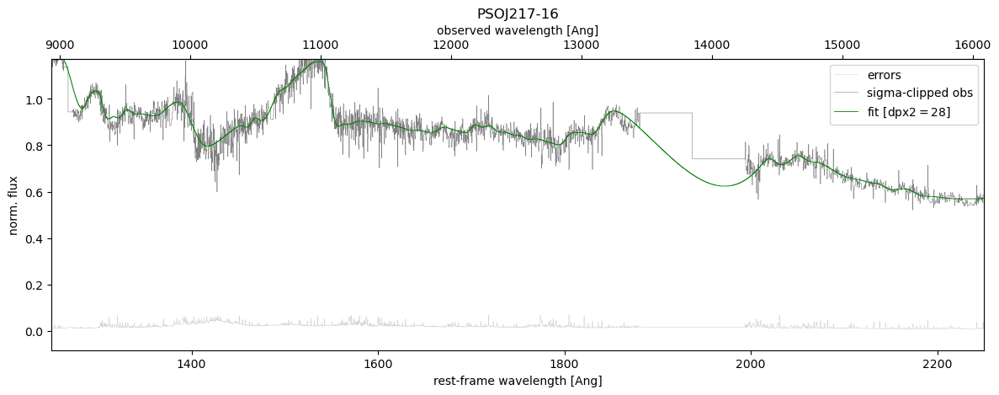

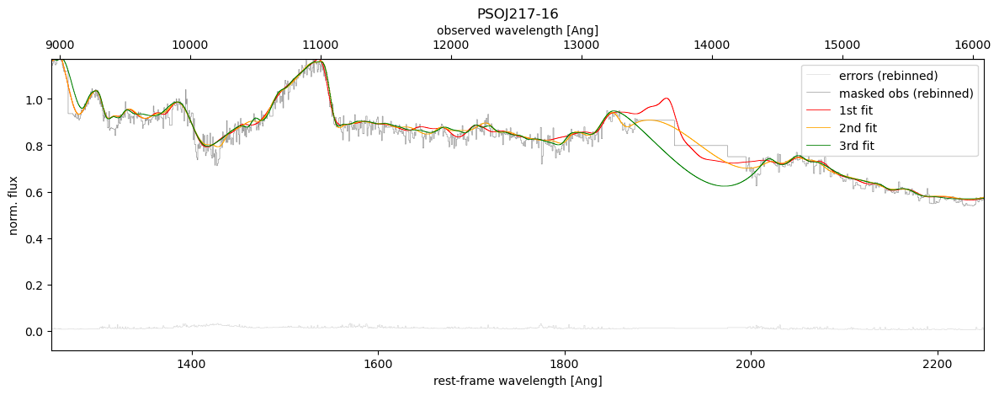

VDESJ0224-4711


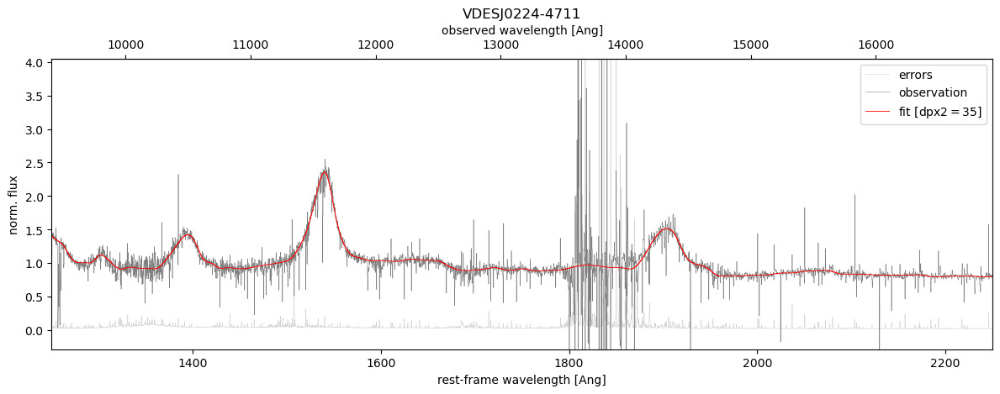

7778


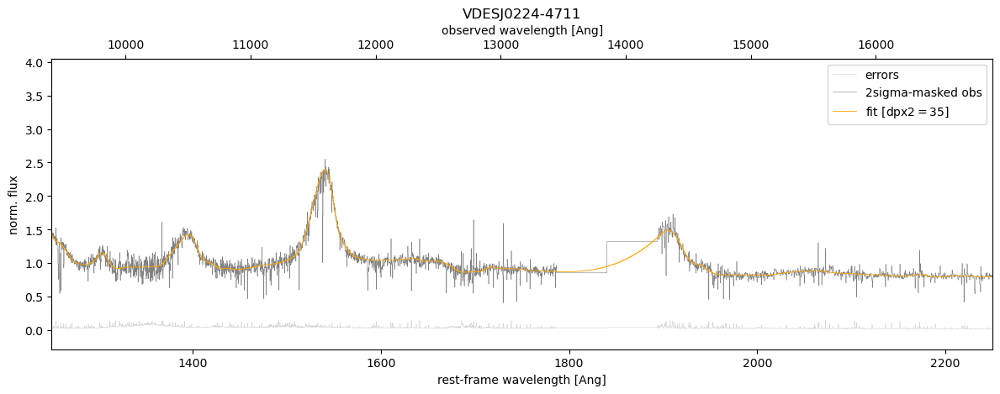

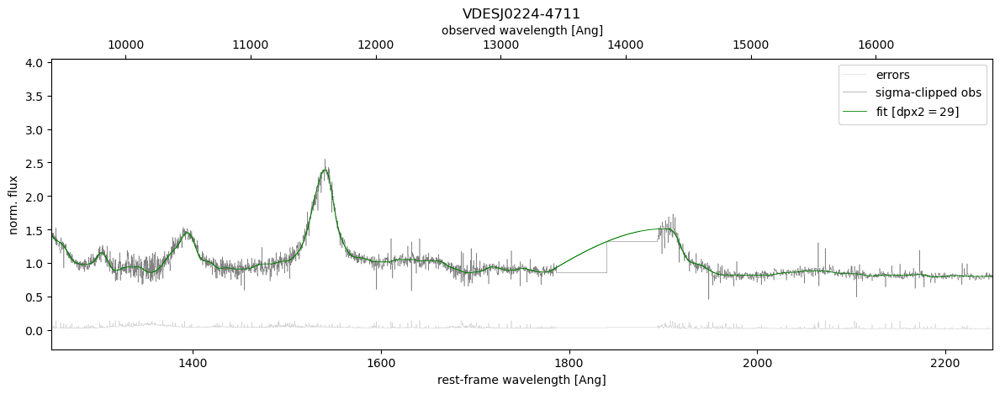

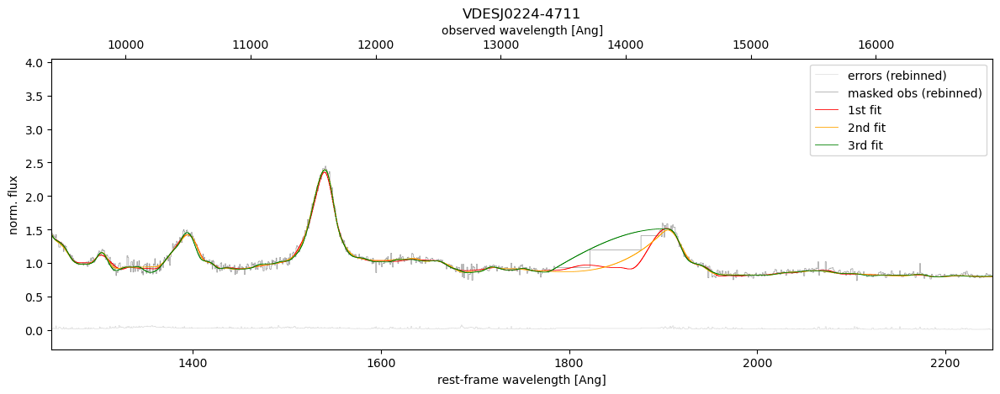

PSOJ158-14


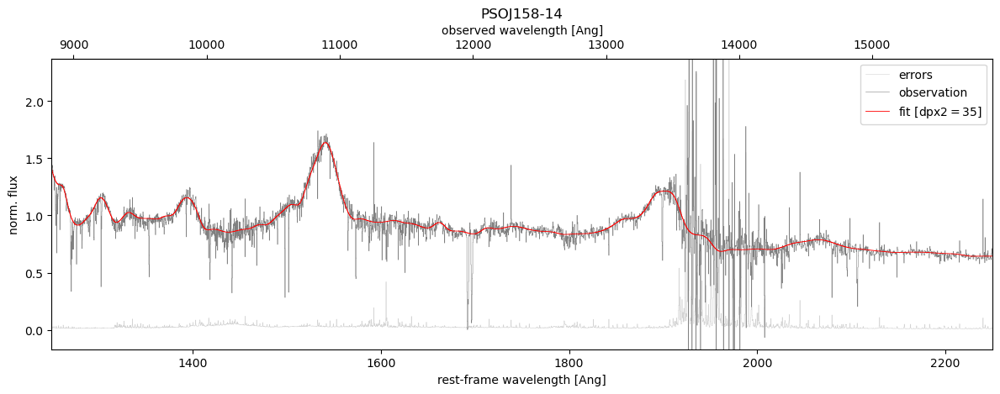

7779


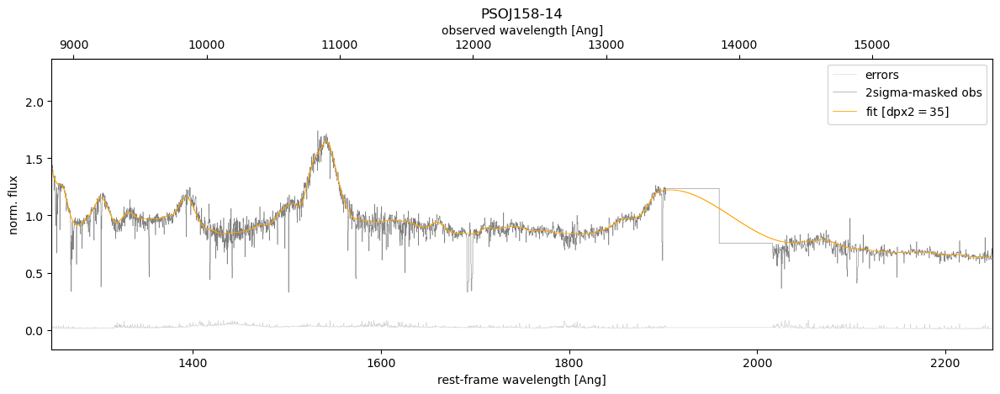

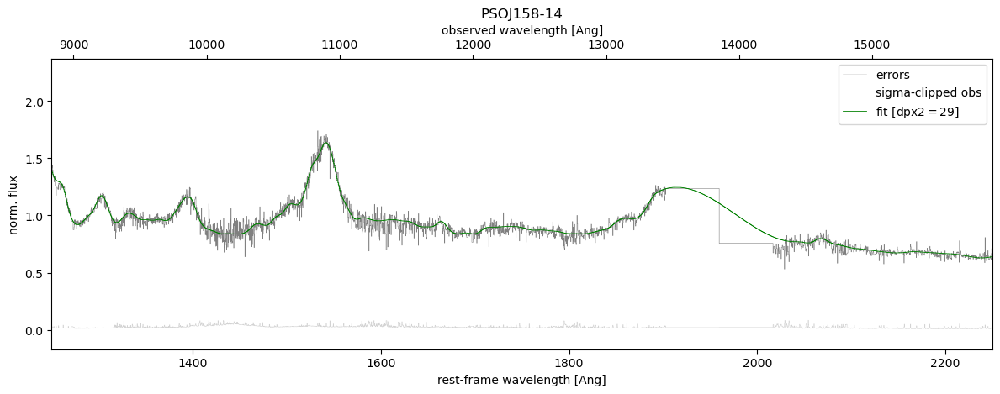

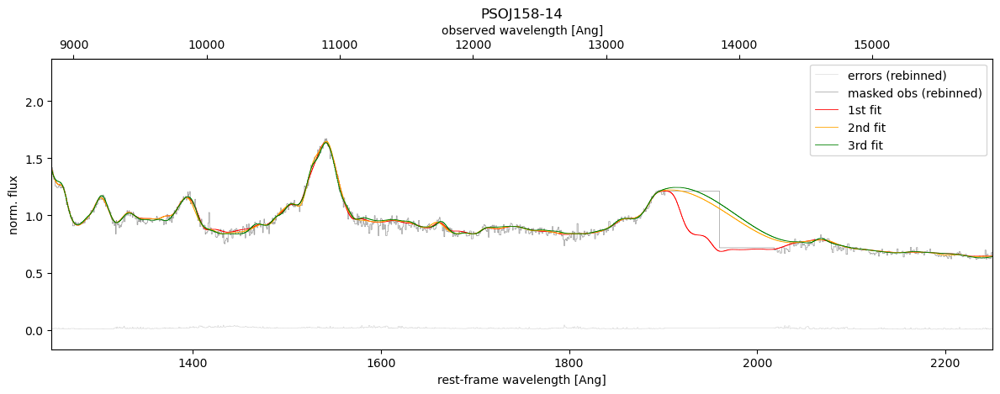

PSOJ029-29


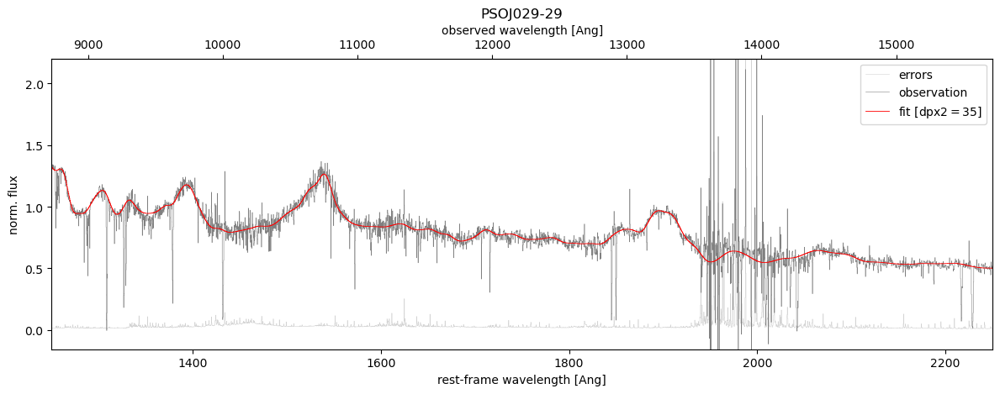

7778


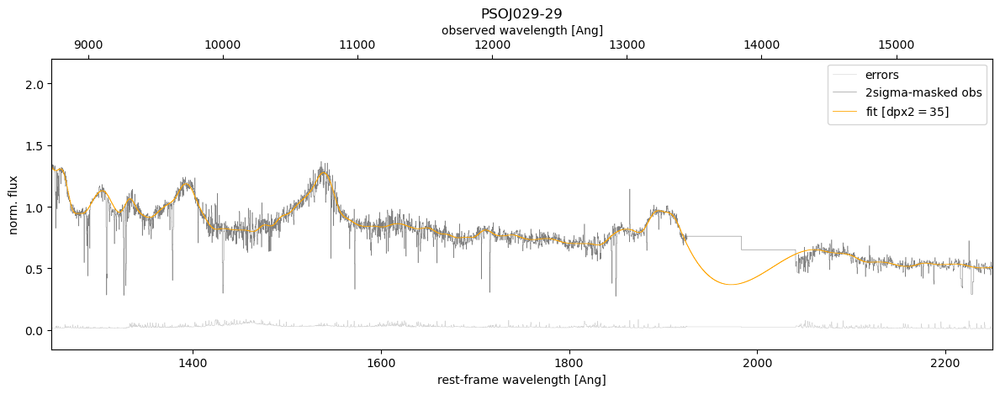

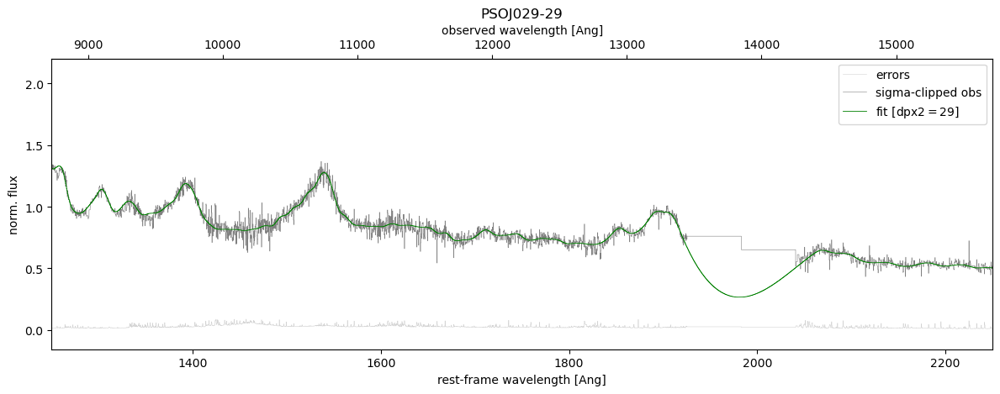

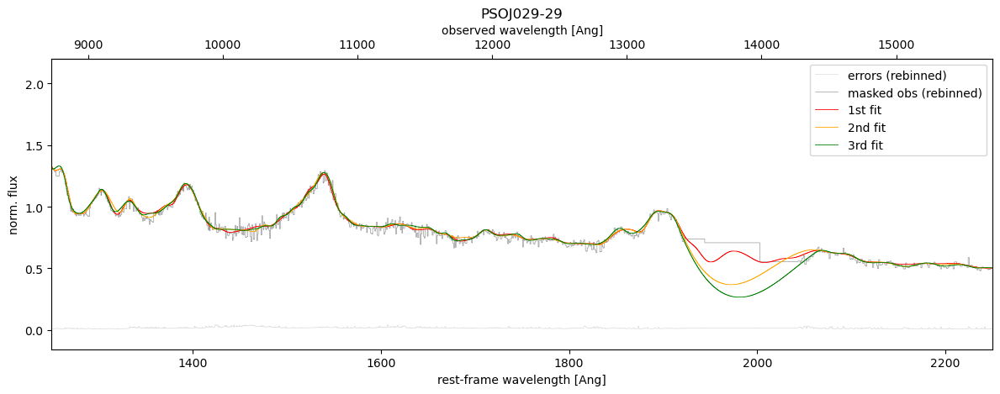

PSOJ323+12


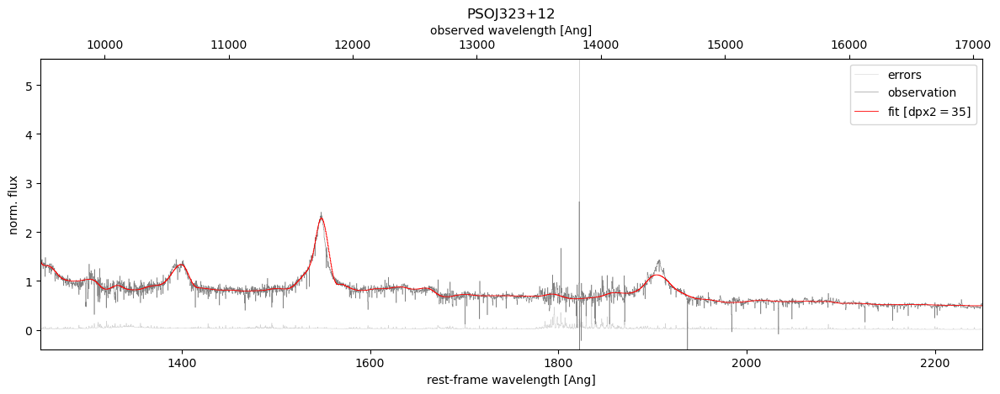

7778


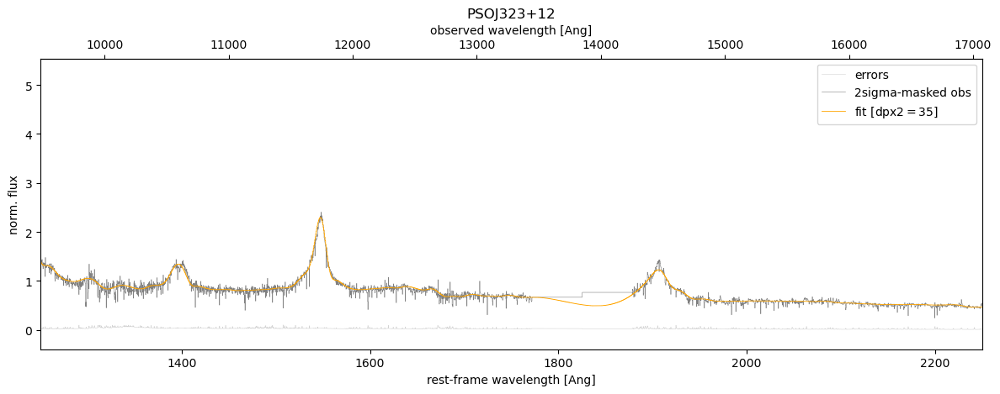

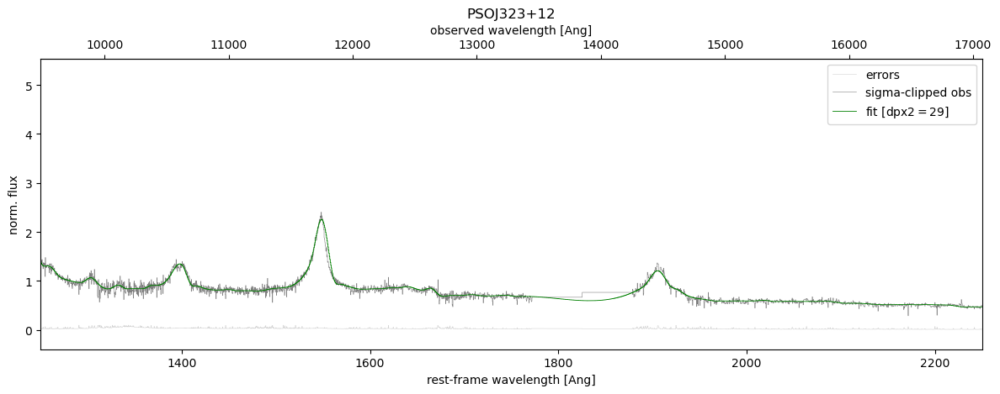

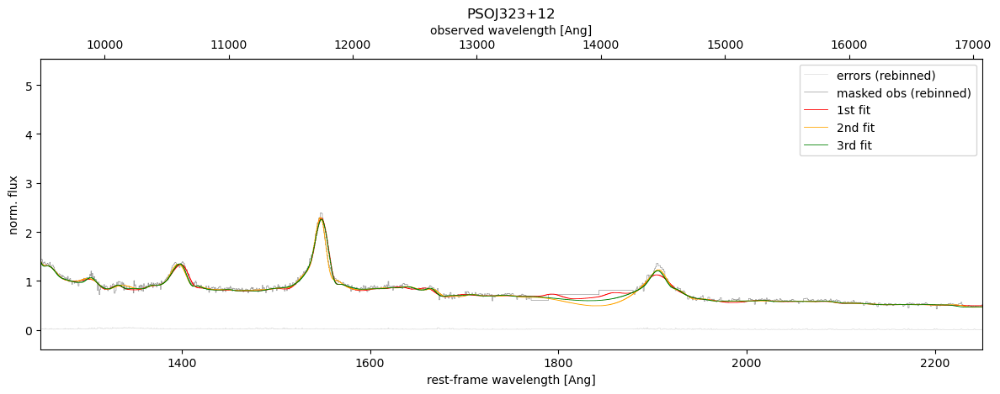

PSOJ183-12


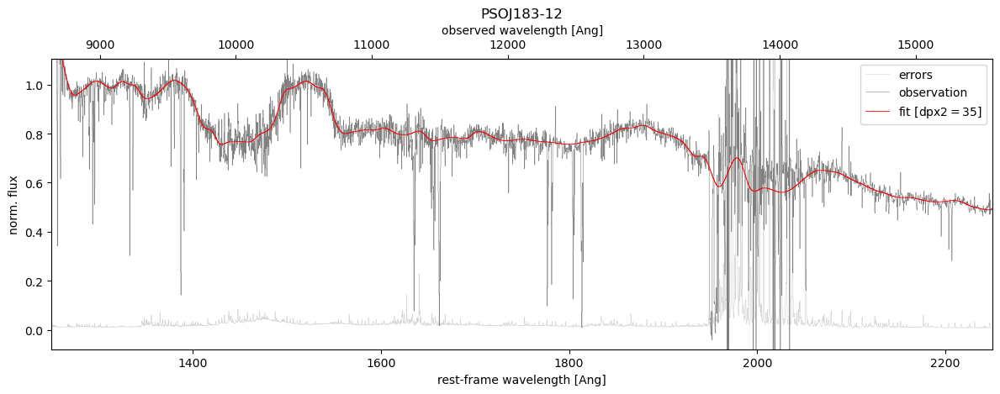

7778


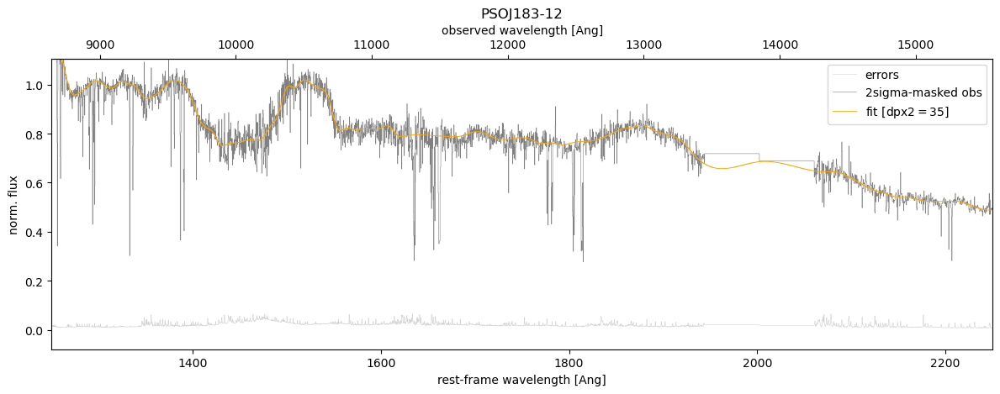

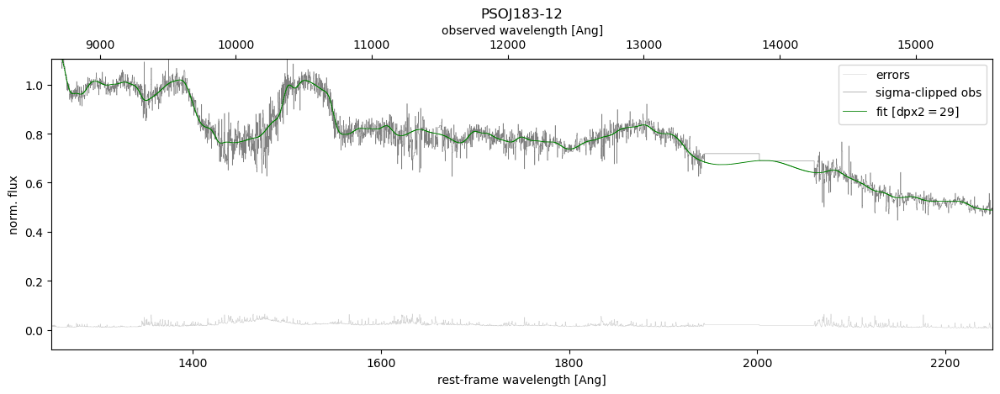

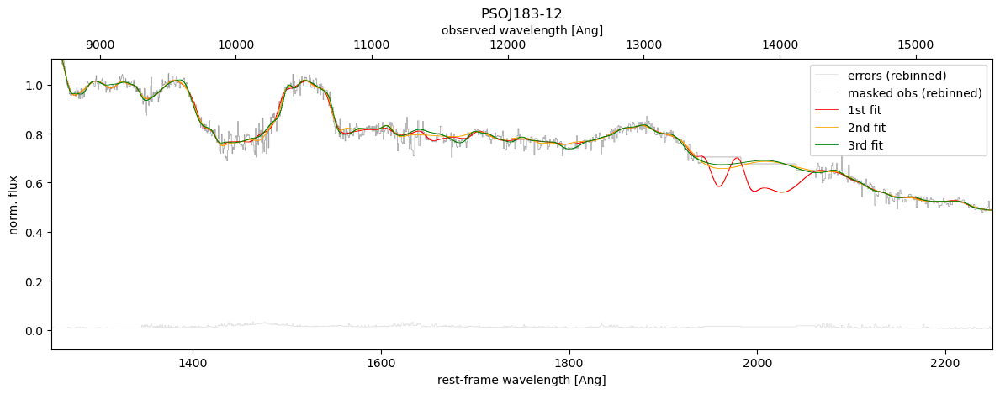

J1535+1943


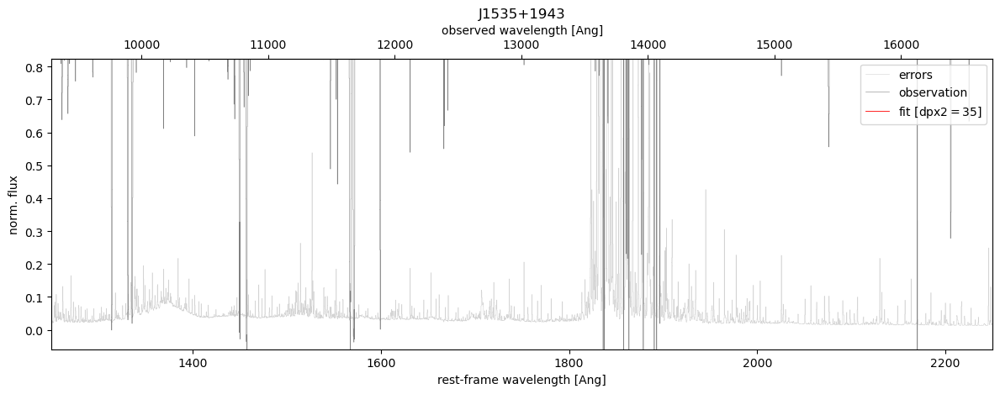

7779


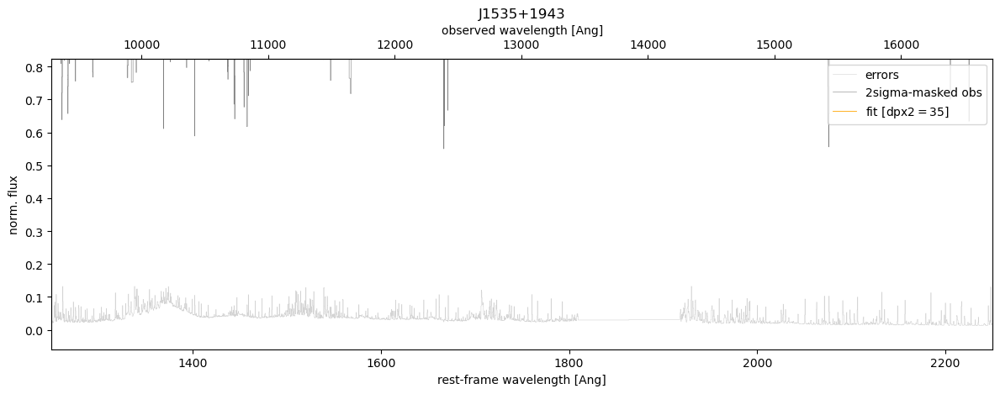

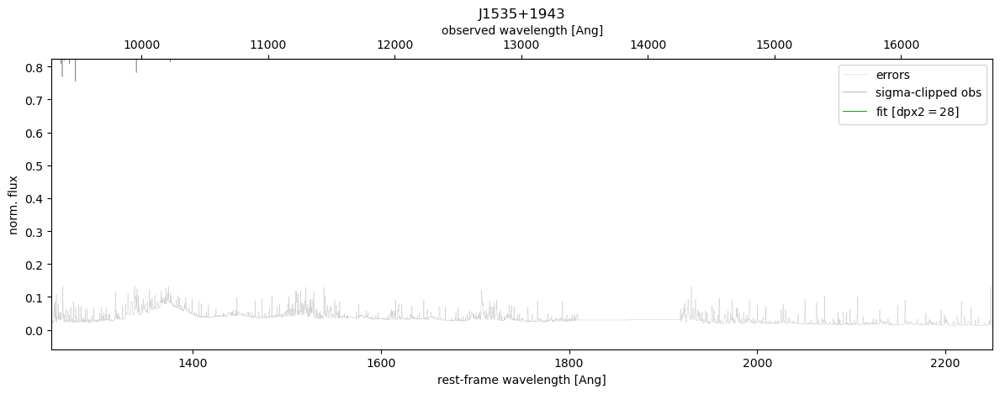

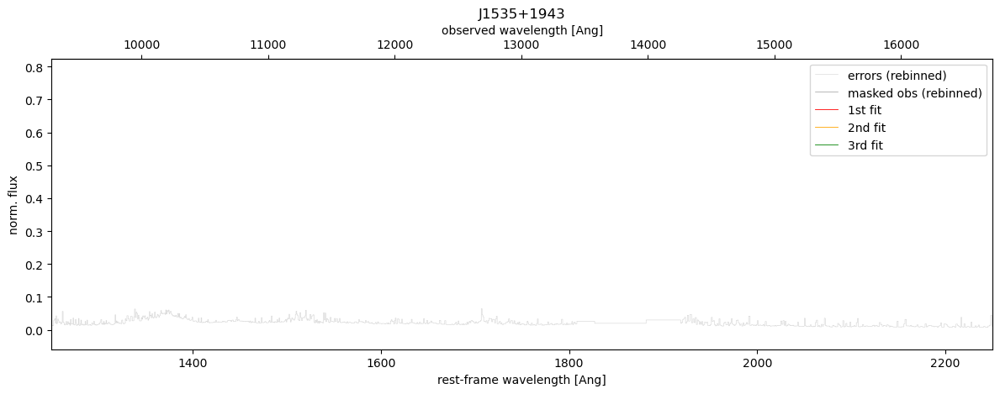

ATLASJ029.9915-36.5658


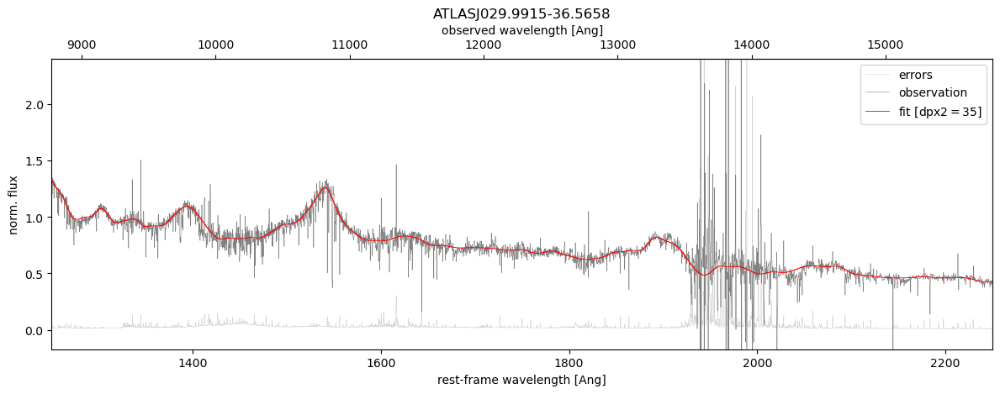

7779


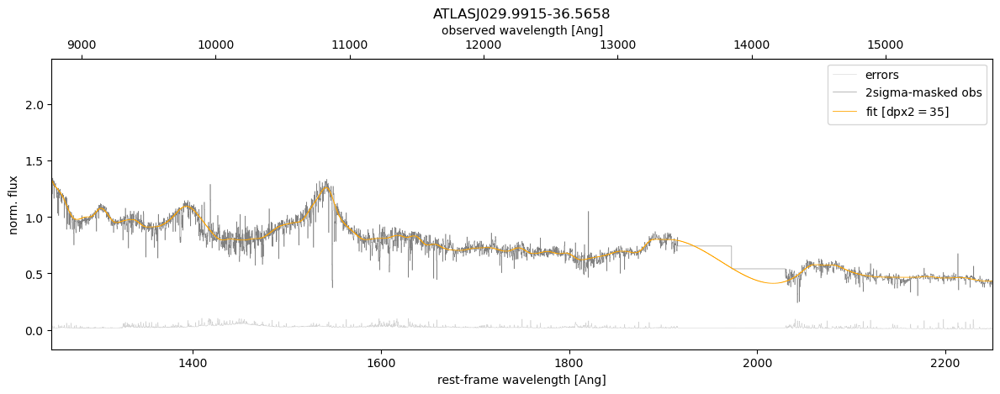

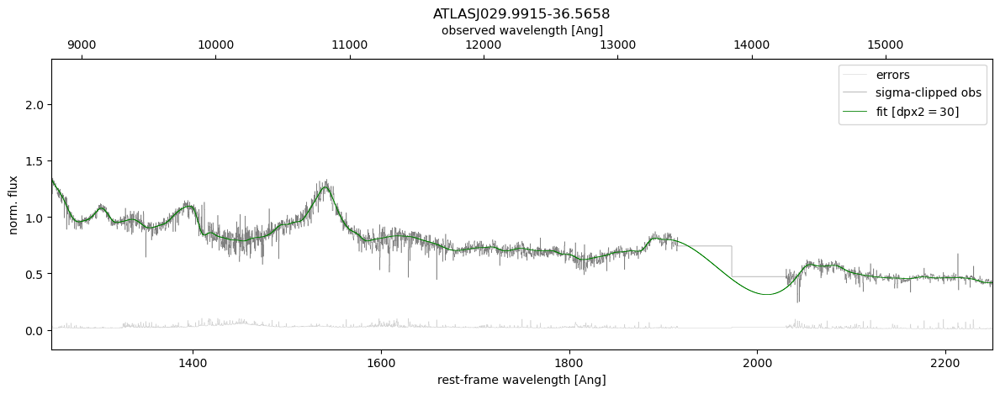

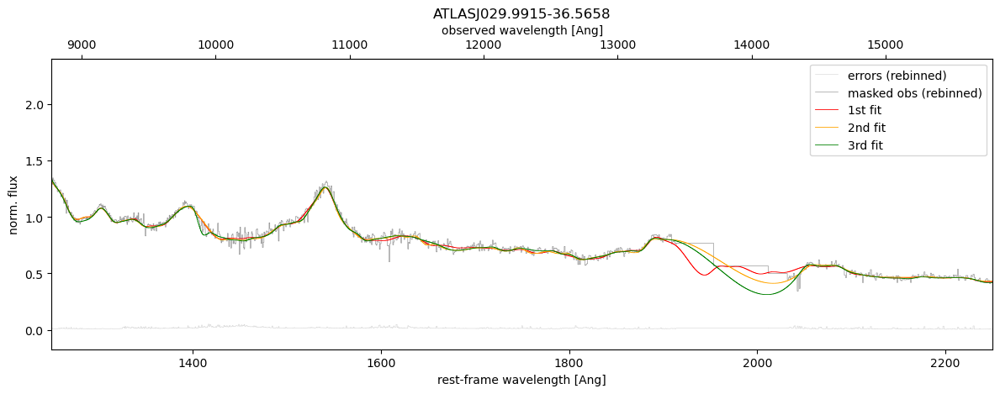

In [9]:
#pp = PdfPages('plots/data_cleaning_zoom.pdf')

for i,qname in enumerate(hnames):
    print(qname)
    # if qname == 'J2100-1715':
    #     print(i)
    #     continue
    # if qname == 'PSOJ011+09':
    #     print(i)
    #     continue

    pp = PdfPages('plots/2024_06_15/{}_dc.pdf'.format(qname))
    fname = qname + '.txt'
    z_in, snr = hz[i], hsnr[i]
    wl1,wl2 = wl1r[i],wl2r[i]

    # load spectrum
    spec = np.loadtxt(hspath + fname)
    wl, flux, sig = spec[:,0], spec[:,1], spec[:,2]

    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(wl[np.logical_and(wl>1250*(1+z_in),wl<2250*(1+z_in))]) 
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(wl,flux,sig,z_in,deltapix2)
        fval1 = mode(flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]
        wl_normed,flux_normed = spec_norm[0],spec_norm[1]
        sig_normed = sigma_norm
        wl_fit,flux_fit = spec_fit[0],spec_fit[1]
        fit1 = spec_fit
        
    except Exception as error:               
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        continue


    # define plot range
    lya = 1215.67
    lya_range = np.logical_and(wl_normed>lya-30, wl_normed<lya+30)
    lya_max = max(flux_normed[lya_range])
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-lya_max*0.05,lya_max*0.7)
    xlimit = (1250,2250)

    
    # plot spectrum and 1st fit
    fig1 = plt.figure(1)
    ax1 = fig1.subplots()
    fig1.set_figwidth(12)
    ax1.plot(wl_normed,sig_normed,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax1.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='observation')
    ax1.plot(wl_fit,flux_fit,linewidth=0.6, drawstyle='steps-mid', color='red',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    ax1.set_xlim(xlimit)
    ax1.set_ylim(ylimit)
    ax1.set_xlabel('rest-frame wavelength [Ang]')
    ax1.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax1 = ax1.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax1.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    pp.savefig(fig1)
    plt.show()
    plt.close()


##### masking of entries with error > 2sig, and 2nd fit #####

    # mask both water absorption ranges
    mask1 = np.logical_or(wl<w1l,wl>w1r)
    mask2 = np.logical_or(wl<w2l,wl>w2r)
    mask3 = np.logical_and(mask1,mask2)
    wl = wl[mask3]
    flux = flux[mask3]
    sig = sig[mask3]
    print(len(flux))

    # stddev and mean of errors
    err_threshold = 5*10**(-17)                   # add error threshold to mask values with very large systematic errors
    sig_std = np.std(sig[sig<err_threshold])
    sig_mean = np.mean(sig[sig<err_threshold])


    # mean of flux
    flux_median = np.median(flux[sig<err_threshold])
    
    # mask errors larger than 2 sigma and flux values close to zero
    mask = np.logical_and( sig <= sig_mean+2*sig_std, flux >= 0.5*flux_median )
    
    
    # Apply mask to wavelength and flux arrays
    masked_wl = wl[mask]
    masked_flux = flux[mask]
    masked_sig = sig[mask]    
    
    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))])      # used to calculate the ratio 

    
    # apply 2nd fit to masked spectra
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
        fit2 = spec_fit
        fval2 = mode(masked_flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]
        
    except Exception as error:             # error most likely due to the signal magnitude being much larger than error threshold set before
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        err_threshold = 5*10**(0)         # decrease error threshold and re-do masking
        sig_std = np.std(sig[sig<err_threshold])
        sig_mean = np.mean(sig[sig<err_threshold])
        mask = sig <= sig_mean+2*sig_std
        masked_wl = wl[mask]
        masked_flux = flux[mask]
        masked_sig = sig[mask]
        npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))]) 
        #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

        try:
            spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
            fit2 = spec_fit
            fval2 = mode(masked_flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]
            
        except Exception as error:
            err = type(error).__name__
            print('2nd fit was not possible:', err) 
            print(masked_wl)
            continue


    
    spec_norm2 = spec_norm
    sigma_norm2 = sigma_norm
    
    # plot masked spectrum and fit
    fig2 = plt.figure(2)
    ax2 = fig2.subplots()
    fig2.set_figwidth(12)
    ax2.plot(spec_norm[0],sigma_norm*fval2/fval1,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax2.plot(spec_norm[0],spec_norm[1]*fval2/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='2sigma-masked obs')
    ax2.plot(spec_fit[0],spec_fit[1]*fval2/fval1,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    ax2.set_xlim(xlimit)
    ax2.set_ylim(ylimit)
    ax2.set_xlabel('rest-frame wavelength [Ang]')
    ax2.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax2 = ax2.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax2.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    pp.savefig(fig2)
    plt.show()
    plt.close()


##### sigma clipping ####

    fval = np.mean(masked_flux/spec_norm2[1])
    
    #fit_interp = np.array([np.interp(k,spec_fit[0],spec_fit[1]) for k in spec_norm2[0]])
    diff = [abs(np.interp(spec_norm[0][k],spec_fit[0],spec_fit[1])-spec_norm[1][k]) for k in range(len(spec_norm[0]))]
    mask4 = [diff[k]<4*sigma_norm[k] for k in range(len(spec_norm[0]))]
    masked2_wl = masked_wl[mask4]
    masked2_flux = masked_flux[mask4]
    masked2_sig = masked_sig[mask4]

    # pseudo_flux = np.zeros(len(fit_interp))
    # pseudo_flux[mask4] = masked_flux[mask4]
    # pseudo_flux[np.logical_not(mask4)] = fit_interp[np.logical_not(mask4)]*fval
    # print(len(spec_norm2[0]),len(pseudo_flux))

    # update deltapix after masking
    npix_highz = len(masked2_wl[np.logical_and(masked2_wl>1250*(1+z_in),masked2_wl<2250*(1+z_in))])     
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)       
    
    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked2_wl,masked2_flux,masked2_sig,z_in,deltapix2)
        fit3 = spec_fit
        fval3 = mode(masked2_flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]

        #pseudo_fit, _ , _ = spline_fit(spec_norm2[0]*(1+z_in),pseudo_flux,sigma_norm2,z_in,deltapix2)
    except Exception as error:
        err = type(error).__name__
        print('sigma clipping not possible:', err) 
        continue

    
    # save fit + normalised spectrum
    norm_save='{}_norm'.format(qname)
    with open(hnpath + norm_save + '.txt','w') as nsave:
        for x in itertools.zip_longest(*spec_norm,sigma_norm):
            nsave.write('{} \t {} \t {}\n'.format(*x))
    nsave.close()


    fit_save='{}_dpx{}'.format(qname,deltapix2)
    with open(hfpath + fit_save + '.txt','w') as fsave:
        for x in itertools.zip_longest(*spec_fit):
            fsave.write('{} \t {}\n'.format(*x))
    fsave.close()
    
        
    # plot masked spectrum and fit
    fig3 = plt.figure(3)
    ax3 = fig3.subplots()
    fig3.set_figwidth(12)
    ax3.plot(spec_norm[0],sigma_norm*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax3.plot(spec_norm[0],spec_norm[1]*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='sigma-clipped obs')
    ax3.plot(spec_fit[0],spec_fit[1]*fval3/fval1,linewidth=0.6,drawstyle='steps-mid',color='green',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    #ax3.plot(pseudo_fit[0],pseudo_fit[1],linewidth=0.6,drawstyle='steps-mid',color='blue',alpha=1,label='pseudo fit')
    ax3.set_xlim(xlimit)
    ax3.set_ylim(ylimit)
    ax3.set_xlabel('rest-frame wavelength [Ang]')
    ax3.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax3 = ax3.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax3.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    pp.savefig(fig3)
    plt.show()
    plt.close()

    # fig31 = plt.figure(21)
    # ax31 = fig31.subplots()
    # fig31.set_figwidth(12)
    # ax31.plot(spec_norm2[0],spec_norm2[1],lw=0.4,drawstyle='steps-mid',color='grey',alpha=1,label='sigma-clipped + subst. obs')
    # ax31.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='green',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    # ax31.plot(pseudo_fit[0],pseudo_fit[1],linewidth=0.6,drawstyle='steps-mid',color='blue',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    # ax31.set_xlim(xlimit)
    # ax31.set_ylim(ylimit)
    # ax31.set_xlabel('rest-frame wavelength [Ang]')
    # ax31.set_ylabel('norm. flux')
    # plt.legend(loc='upper right')
    # plt.title(qname)

    # sax31 = ax31.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    # sax31.set_xlabel('observed wavelength [Ang]')
    # plt.tight_layout()
    
    # pp.savefig(fig31)
    # plt.show()
    # plt.close()
    

    # fig0 = plt.figure(10)
    # ax0 = fig0.subplots()
    # fig0.set_figwidth(12)
    # ax0.plot(spec_norm2[0],np.array(diff),linewidth=0.2,drawstyle='steps-mid',color='blue',alpha=1,label='diff flux and fit')
    # ax0.plot(spec_norm2[0][np.logical_not(mask4)],4*sigma_norm2[np.logical_not(mask4)],linewidth=0.4,drawstyle='steps-mid',color='black',alpha=1,label='4*error')
    # ax0.set_xlim(xlimit)
    # ax0.set_ylim(-0.1*max(np.array(diff)[np.logical_and(spec_norm2[0]>1250,spec_norm2[0]<2250)]),max(np.array(diff)[np.logical_and(spec_norm2[0]>1250,spec_norm2[0]<2250)]))
    # ax0.set_xlabel('rest-frame wavelength [Ang]')
    # ax0.set_ylabel('norm. flux')
    # plt.legend(loc='upper right')
    # plt.title(qname)

    # sax0 = ax0.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    # sax0.set_xlabel('observed wavelength [Ang]')
    # plt.tight_layout()

    # pp.savefig(fig0)
    # plt.show()
    # plt.close()


###### rebinning of spectra #####

    # rebin spectrum
    bin_size = 3
    wl_rebin,flux_rebin,sig_rebin=[],[],[]
    j = 0
    while j <= len(spec_norm[0])-bin_size:
        wl_rebin.append(np.mean(spec_norm[0][j:j+bin_size]))
        flux_rebin.append(np.mean(spec_norm[1][j:j+bin_size]))
        sig_rebin.append(np.sqrt(np.sum([k**2 for k in sigma_norm[j:j+bin_size]]))/3)
        j+=bin_size

    # plot rebinned spectrum and all previous fit
    fig4 = plt.figure(4)
    ax4 = fig4.subplots()
    fig4.set_figwidth(12)
    ax4.plot(wl_rebin,sig_rebin*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors (rebinned)')
    ax4.plot(wl_rebin,flux_rebin*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='masked obs (rebinned)')
    ax4.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='1st fit')
    ax4.plot(fit2[0],fit2[1]*fval2/fval1,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='2nd fit')
    ax4.plot(fit3[0],fit3[1]*fval3/fval1,linewidth=0.6,drawstyle='steps-mid',color='green',alpha=1,label='3rd fit')
    ax4.set_xlim(xlimit)
    ax4.set_ylim(ylimit)
    ax4.set_xlabel('rest-frame wavelength [Ang]')
    ax4.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax4 = ax4.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax4.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    pp.savefig(fig4)
    plt.show()
    plt.close()

    pp.close()

PSOJ036+03
2


/tmp/ipykernel_10487/2913835660.py:25: RuntimeWarning: invalid value encountered in divide
  fval1 = mode(flux/spec_norm[1])[0]


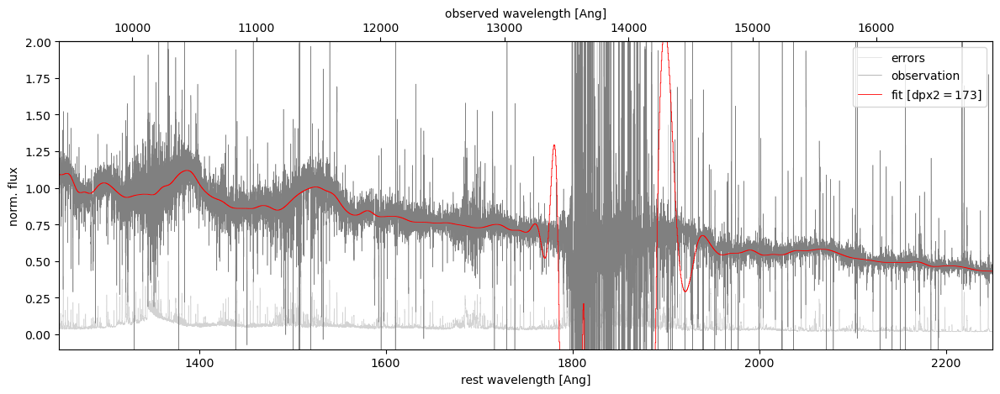

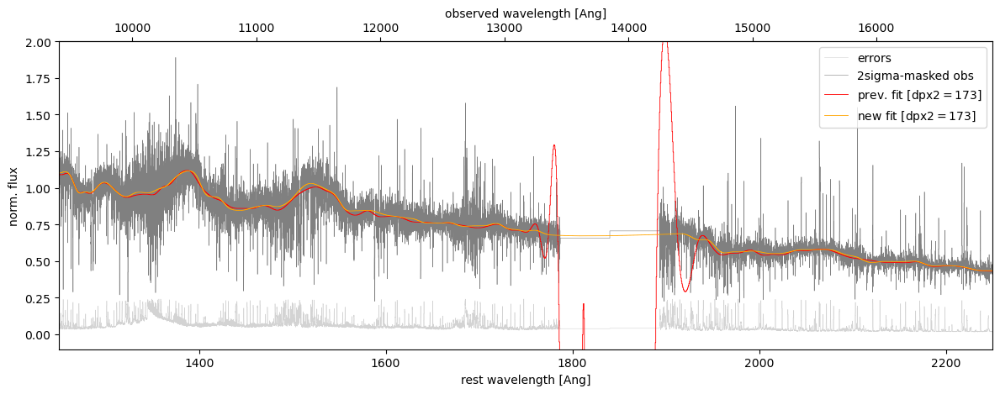

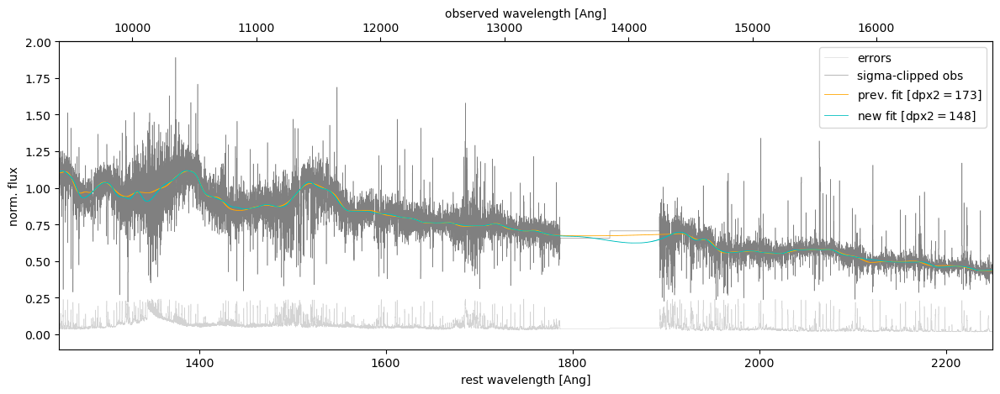

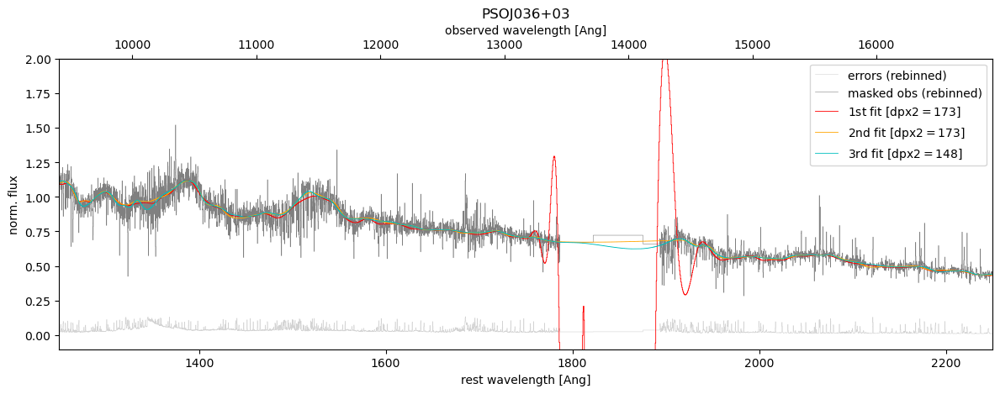

In [37]:
pp = PdfPages('plots/PSOJ036+03.pdf')                   #PdfPages('plots/PSOJ056-16.pdf')
h2names = ['PSOJ036+03']                                #['PSOJ056-16']
for qname in h2names:
    print(qname)

    i = np.where(hnames == qname)[0][0]
    print(i)
    fname = qname + '.txt'
    z_in, snr = hz[i], hsnr[i]
    wl1,wl2 = wl1r[i],wl2r[i]

    # load spectrum
    spec = np.loadtxt(hspath + fname)
    wl, flux, sig = spec[:,0], spec[:,1], spec[:,2]

    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(wl[np.logical_and(wl>1250*(1+z_in),wl<2250*(1+z_in))]) 
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)
    deltapix2_1 = deltapix2

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(wl,flux,sig,z_in,deltapix2)
        fval1 = mode(flux/spec_norm[1])[0]
        wl_normed,flux_normed = spec_norm[0],spec_norm[1]
        sig_normed = sigma_norm
        wl_fit,flux_fit = spec_fit[0],spec_fit[1]
        fit1 = spec_fit
        
    except Exception as error:               
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        continue

    
    # define plot range
    lya = 1215.67
    lya_range = np.logical_and(wl_normed>lya-30, wl_normed<lya+30)
    lya_max = max(flux_normed[lya_range])
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-lya_max*0.05,2)   #lya_max*0.7)
    xlimit = (1250,2250)

    # plot spectrum and 1st fit
    fig1 = plt.figure(1)
    ax1 = fig1.subplots()
    fig1.set_figwidth(12)
    ax1.plot(wl_normed,sig_normed,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax1.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='observation')
    ax1.plot(wl_fit,flux_fit,linewidth=0.6, drawstyle='steps-mid', color='red',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    ax1.set_xlim(xlimit)
    ax1.set_ylim(ylimit)
    ax1.set_xlabel('rest wavelength [Ang]')
    ax1.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax1 = ax1.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax1.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()
    plt.savefig('plots/{}_1st.pdf'.format(qname), format='pdf')

    pp.savefig(fig1)
    #plt.show()
    #plt.close()



##### masking of entries with error > 2sig, and 2nd fit #####

    # mask both water absorption ranges
    mask1 = np.logical_or(wl<w1l,wl>w1r)
    n_masked = len(wl) - len(wl[mask1])
    mask2 = np.logical_or(wl<w2l,wl>w2r)
    mask3 = np.logical_and(mask1,mask2)
    wl = wl[mask3]
    flux = flux[mask3]
    sig = sig[mask3]
    
    # stddev and mean of errors
    err_threshold = 5*10**(-17)                   # add error threshold to mask values with very large systematic errors
    sig_std = np.std(sig[sig<err_threshold])
    sig_mean = np.mean(sig[sig<err_threshold])


    # mean of flux
    flux_median = np.median(flux[sig<err_threshold])
    
    # mask errors larger than 2 sigma and flux values close to zero
    mask = np.logical_and( sig <= sig_mean+2*sig_std, flux >= 0.5*flux_median )
    
    
    # Apply mask to wavelength and flux arrays
    masked_wl = wl[mask]
    masked_flux = flux[mask]
    masked_sig = sig[mask]    
    
    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))])     # used to calculate the ratio 

    
    # apply 2nd fit to masked spectra
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
        fit2 = spec_fit
        fval2 = mode(masked_flux/spec_norm[1])[0]
        
    except Exception as error:             # error most likely due to the signal magnitude being much larger than error threshold set before
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        err_threshold = 5*10**(-1)         # decrease error threshold and re-do masking
        sig_std = np.std(sig[sig<err_threshold])
        sig_mean = np.mean(sig[sig<err_threshold])
        mask = sig <= sig_mean+2*sig_std
        masked_wl = wl[mask]
        masked_flux = flux[mask]
        masked_sig = sig[mask]
        npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))]) 
        #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

        try:
            spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
            fit2 = spec_fit
            fval2 = np.mode(masked_flux/spec_norm[1])[0]
            
        except Exception as error:
            err = type(error).__name__
            print('2nd fit was not possible:', err) 
            continue


    spec_norm2 = spec_norm
    sigma_norm2 = sigma_norm
    
    # plot masked spectrum and fit
    fig2 = plt.figure(2)
    ax2 = fig2.subplots()
    fig2.set_figwidth(12)
    ax2.plot(spec_norm[0],sigma_norm,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax2.plot(spec_norm[0],spec_norm[1]*fval2/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='2sigma-masked obs')
    ax2.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='prev. fit [dpx2$={}$]'.format(deltapix2_1))
    ax2.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='new fit [dpx2$={}$]'.format(deltapix2))
    ax2.set_xlim(xlimit)
    ax2.set_ylim(ylimit)
    ax2.set_xlabel('rest wavelength [Ang]')
    ax2.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax2 = ax2.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax2.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()
    plt.savefig('plots/{}_2nd.pdf'.format(qname), format='pdf')

    pp.savefig(fig2)
    #plt.show()
    #plt.close()


##### sigma clipping ####

    fval = np.mean(masked_flux/spec_norm2[1])
    
    #fit_interp = np.array([np.interp(k,spec_fit[0],spec_fit[1]) for k in spec_norm2[0]])
    diff = [abs(np.interp(spec_norm[0][k],spec_fit[0],spec_fit[1])-spec_norm[1][k]) for k in range(len(spec_norm[0]))]
    mask4 = [diff[k]<4*sigma_norm[k] for k in range(len(spec_norm[0]))]
    masked2_wl = masked_wl[mask4]
    masked2_flux = masked_flux[mask4]
    masked2_sig = masked_sig[mask4]

    # pseudo_flux = np.zeros(len(fit_interp))
    # pseudo_flux[mask4] = masked_flux[mask4]
    # pseudo_flux[np.logical_not(mask4)] = fit_interp[np.logical_not(mask4)]*fval
    # print(len(spec_norm2[0]),len(pseudo_flux))

    # update deltapix after masking
    npix_highz = len(masked2_wl[np.logical_and(masked2_wl>1250*(1+z_in),masked2_wl<2250*(1+z_in))])
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)      
    deltapix2 = 148
    
    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked2_wl,masked2_flux,masked2_sig,z_in,deltapix2)
        fit3 = spec_fit
        fval3 = mode(masked2_flux/spec_norm[1])[0]

        #pseudo_fit, _ , _ = spline_fit(spec_norm2[0]*(1+z_in),pseudo_flux,sigma_norm2,z_in,deltapix2)
    except Exception as error:
        err = type(error).__name__
        print('sigma clipping not possible:', err) 
        continue

    
    # # save fit + normalised spectrum
    # norm_save='{}_norm'.format(qname)
    # with open(hnpath + norm_save + '.txt','w') as nsave:
    #     for x in itertools.zip_longest(*spec_norm,sigma_norm):
    #         nsave.write('{} \t {} \t {}\n'.format(*x))
    # nsave.close()


    # fit_save='{}_dpx{}'.format(qname,deltapix2)
    # with open(hfpath + fit_save + '.txt','w') as fsave:
    #     for x in itertools.zip_longest(*spec_fit):
    #         fsave.write('{} \t {}\n'.format(*x))
    # fsave.close()
    
        
    # plot masked spectrum and fit
    fig3 = plt.figure(3)
    ax3 = fig3.subplots()
    fig3.set_figwidth(12)
    ax3.plot(spec_norm[0],sigma_norm,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors')
    ax3.plot(spec_norm[0],spec_norm[1]*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='sigma-clipped obs')
    #ax3.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2_1))
    ax3.plot(fit2[0],fit2[1],linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='prev. fit [dpx2$={}$]'.format(deltapix2_1))
    ax3.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='c',alpha=1,label='new fit [dpx2$={}$]'.format(deltapix2))
    #ax3.plot(pseudo_fit[0],pseudo_fit[1],linewidth=0.6,drawstyle='steps-mid',color='blue',alpha=1,label='pseudo fit')
    ax3.set_xlim(xlimit)
    ax3.set_ylim(ylimit)
    ax3.set_xlabel('rest wavelength [Ang]')
    ax3.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax3 = ax3.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax3.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()
    plt.savefig('plots/{}_3rd.pdf'.format(qname), format='pdf')

    pp.savefig(fig3)
    #plt.show()
    #plt.close()

    
###### rebinning of spectra #####

    # rebin spectrum
    bin_size = 3
    wl_rebin,flux_rebin,sig_rebin=[],[],[]
    j = 0
    while j <= len(spec_norm[0])-bin_size:
        wl_rebin.append(np.mean(spec_norm[0][j:j+bin_size]))
        flux_rebin.append(np.mean(spec_norm[1][j:j+bin_size]))
        sig_rebin.append(np.sqrt(np.sum([k**2 for k in sigma_norm[j:j+bin_size]]))/3)
        j+=bin_size

    # plot rebinned spectrum and all previous fit
    fig4 = plt.figure(4)
    ax4 = fig4.subplots()
    fig4.set_figwidth(12)
    ax4.plot(wl_rebin,sig_rebin,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1,label='errors (rebinned)')
    ax4.plot(wl_rebin,flux_rebin,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1,label='masked obs (rebinned)')
    ax4.plot(*fit1,linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='1st fit [dpx2$={}$]'.format(deltapix2_1))
    ax4.plot(*fit2,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='2nd fit [dpx2$={}$]'.format(deltapix2_1))
    ax4.plot(*fit3,linewidth=0.6,drawstyle='steps-mid',color='c',alpha=1,label='3rd fit [dpx2$={}$]'.format(deltapix2))
    ax4.set_xlim(xlimit)
    ax4.set_ylim(ylimit)
    ax4.set_xlabel('rest wavelength [Ang]')
    ax4.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    plt.title(qname)

    sax4 = ax4.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax4.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()
    plt.savefig('plots/{}_4th.pdf'.format(qname), format='pdf')
    pp.savefig(fig4)
    #plt.show()
    #plt.close()

pp.close()

/tmp/ipykernel_10487/3448010540.py:27: RuntimeWarning: invalid value encountered in divide
  fval1 = mode(flux/spec_norm[1])[0]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


PSOJ036+03
2


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


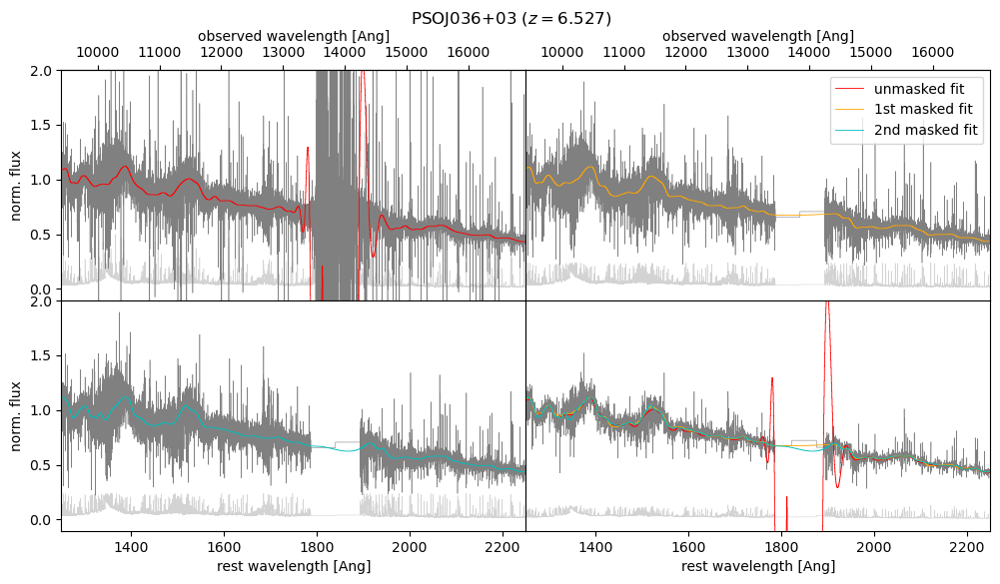

In [39]:
import matplotlib.gridspec as gridspec

#pp = PdfPages('plots/PSOJ036+03.pdf')                   #PdfPages('plots/PSOJ056-16.pdf')
h2names = ['PSOJ036+03']                                #['PSOJ056-16']
for qname in h2names:
    print(qname)

    i = np.where(hnames == qname)[0][0]
    print(i)
    fname = qname + '.txt'
    z_in, snr = hz[i], hsnr[i]
    wl1,wl2 = wl1r[i],wl2r[i]

    # load spectrum
    spec = np.loadtxt(hspath + fname)
    wl, flux, sig = spec[:,0], spec[:,1], spec[:,2]

    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(wl[np.logical_and(wl>1250*(1+z_in),wl<2250*(1+z_in))]) 
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)
    deltapix2_1 = deltapix2

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(wl,flux,sig,z_in,deltapix2)
        fval1 = mode(flux/spec_norm[1])[0]
        wl_normed,flux_normed = spec_norm[0],spec_norm[1]
        sig_normed = sigma_norm
        wl_fit,flux_fit = spec_fit[0],spec_fit[1]
        fit1 = spec_fit
        
    except Exception as error:               
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        continue

    
    # define plot range
    lya = 1215.67
    lya_range = np.logical_and(wl_normed>lya-30, wl_normed<lya+30)
    lya_max = max(flux_normed[lya_range])
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-lya_max*0.05,2)   #lya_max*0.7)
    xlimit = (1250,2250)


    # plot grid
    fig = plt.figure(2)
    fig.set_figwidth(12)
    fig.set_figheight(6)
    fig.suptitle(qname + ' ($z={}$)'.format(z_in))
    gs = gridspec.GridSpec(2, 2)

    # Create subplots within the gridspec
    ax1 = plt.subplot(gs[0])
    ax2 = plt.subplot(gs[1], sharex=ax1,sharey=ax1)
    ax3 = plt.subplot(gs[2], sharex=ax1)
    ax4 = plt.subplot(gs[3], sharex=ax1,sharey=ax3)
    # ax5 = plt.subplot(gs[4], sharex=ax1)
    # ax6 = plt.subplot(gs[5], sharex=ax1,sharey=ax5)
    ax = [ax1,ax2,ax3,ax4]
    
    # plot spectrum and 1st fit
    # fig1 = plt.figure(1)
    # ax1 = fig1.subplots()
    # fig1.set_figwidth(12)
    ax1.plot(wl_normed,sig_normed,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1)#,label='errors')
    ax1.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1)#,label='observation')
    ax1.plot(wl_fit,flux_fit,linewidth=0.6, drawstyle='steps-mid', color='red',alpha=1,label='unmasked fit')# [dpx2$={}$]'.format(deltapix2))
    ax1.set_xlim(xlimit)
    ax1.set_ylim(ylimit)
    # ax1.set_xlabel('rest wavelength [Ang]')
    ax1.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    # plt.title(qname)

    sax1 = ax1.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax1.set_xlabel('observed wavelength [Ang]')
    # plt.tight_layout()
    # plt.savefig('plots/{}_1st.pdf'.format(qname), format='pdf')

    #pp.savefig(fig1)
    #plt.show()
    #plt.close()



##### masking of entries with error > 2sig, and 2nd fit #####

    # mask both water absorption ranges
    mask1 = np.logical_or(wl<w1l,wl>w1r)
    n_masked = len(wl) - len(wl[mask1])
    mask2 = np.logical_or(wl<w2l,wl>w2r)
    mask3 = np.logical_and(mask1,mask2)
    wl = wl[mask3]
    flux = flux[mask3]
    sig = sig[mask3]
    
    # stddev and mean of errors
    err_threshold = 5*10**(-17)                   # add error threshold to mask values with very large systematic errors
    sig_std = np.std(sig[sig<err_threshold])
    sig_mean = np.mean(sig[sig<err_threshold])


    # mean of flux
    flux_median = np.median(flux[sig<err_threshold])
    
    # mask errors larger than 2 sigma and flux values close to zero
    mask = np.logical_and( sig <= sig_mean+2*sig_std, flux >= 0.5*flux_median )
    
    
    # Apply mask to wavelength and flux arrays
    masked_wl = wl[mask]
    masked_flux = flux[mask]
    masked_sig = sig[mask]    
    
    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))])     # used to calculate the ratio 

    
    # apply 2nd fit to masked spectra
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
        fit2 = spec_fit
        fval2 = mode(masked_flux/spec_norm[1])[0]
        
    except Exception as error:             # error most likely due to the signal magnitude being much larger than error threshold set before
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        err_threshold = 5*10**(-1)         # decrease error threshold and re-do masking
        sig_std = np.std(sig[sig<err_threshold])
        sig_mean = np.mean(sig[sig<err_threshold])
        mask = sig <= sig_mean+2*sig_std
        masked_wl = wl[mask]
        masked_flux = flux[mask]
        masked_sig = sig[mask]
        npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))]) 
        #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

        try:
            spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
            fit2 = spec_fit
            fval2 = np.mode(masked_flux/spec_norm[1])[0]
            
        except Exception as error:
            err = type(error).__name__
            print('2nd fit was not possible:', err) 
            continue


    spec_norm2 = spec_norm
    sigma_norm2 = sigma_norm
    
    # plot masked spectrum and fit
    # fig2 = plt.figure(2)
    # ax2 = fig2.subplots()
    # fig2.set_figwidth(12)
    ax2.plot(spec_norm[0],sigma_norm,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1)#,label='errors')
    ax2.plot(spec_norm[0],spec_norm[1]*fval2/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1)#,label='2sigma-masked obs')
    #ax2.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='prev. fit [dpx2$={}$]'.format(deltapix2_1))
    ax2.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='1st masked fit')# [dpx2$={}$]'.format(deltapix2))
    ax2.set_xlim(xlimit)
    ax2.set_ylim(ylimit)
    # ax2.set_xlabel('rest wavelength [Ang]')
    # ax2.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    # plt.title(qname)

    sax2 = ax2.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax2.set_xlabel('observed wavelength [Ang]')
    # plt.tight_layout()
    # plt.savefig('plots/{}_2nd.pdf'.format(qname), format='pdf')

    #pp.savefig(fig2)
    #plt.show()
    #plt.close()


##### sigma clipping ####

    fval = np.mean(masked_flux/spec_norm2[1])
    
    #fit_interp = np.array([np.interp(k,spec_fit[0],spec_fit[1]) for k in spec_norm2[0]])
    diff = [abs(np.interp(spec_norm[0][k],spec_fit[0],spec_fit[1])-spec_norm[1][k]) for k in range(len(spec_norm[0]))]
    mask4 = [diff[k]<4*sigma_norm[k] for k in range(len(spec_norm[0]))]
    masked2_wl = masked_wl[mask4]
    masked2_flux = masked_flux[mask4]
    masked2_sig = masked_sig[mask4]

    # pseudo_flux = np.zeros(len(fit_interp))
    # pseudo_flux[mask4] = masked_flux[mask4]
    # pseudo_flux[np.logical_not(mask4)] = fit_interp[np.logical_not(mask4)]*fval
    # print(len(spec_norm2[0]),len(pseudo_flux))

    # update deltapix after masking
    npix_highz = len(masked2_wl[np.logical_and(masked2_wl>1250*(1+z_in),masked2_wl<2250*(1+z_in))])
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)      
    deltapix2 = 148
    
    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked2_wl,masked2_flux,masked2_sig,z_in,deltapix2)
        fit3 = spec_fit
        fval3 = mode(masked2_flux/spec_norm[1])[0]

        #pseudo_fit, _ , _ = spline_fit(spec_norm2[0]*(1+z_in),pseudo_flux,sigma_norm2,z_in,deltapix2)
    except Exception as error:
        err = type(error).__name__
        print('sigma clipping not possible:', err) 
        continue

    
    # # save fit + normalised spectrum
    # norm_save='{}_norm'.format(qname)
    # with open(hnpath + norm_save + '.txt','w') as nsave:
    #     for x in itertools.zip_longest(*spec_norm,sigma_norm):
    #         nsave.write('{} \t {} \t {}\n'.format(*x))
    # nsave.close()


    # fit_save='{}_dpx{}'.format(qname,deltapix2)
    # with open(hfpath + fit_save + '.txt','w') as fsave:
    #     for x in itertools.zip_longest(*spec_fit):
    #         fsave.write('{} \t {}\n'.format(*x))
    # fsave.close()
    
        
    # plot masked spectrum and fit
    # fig3 = plt.figure(3)
    # ax3 = fig3.subplots()
    # fig3.set_figwidth(12)
    ax3.plot(spec_norm[0],sigma_norm,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1)#,label='errors')
    ax3.plot(spec_norm[0],spec_norm[1]*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1)#,label='sigma-clipped obs')
    #ax3.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2_1))
    #ax3.plot(fit2[0],fit2[1],linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='prev. fit [dpx2$={}$]'.format(deltapix2_1))
    ax3.plot(spec_fit[0],spec_fit[1],linewidth=0.6,drawstyle='steps-mid',color='c',alpha=1,label='2nd masked fit')# [dpx2$={}$]'.format(deltapix2))
    #ax3.plot(pseudo_fit[0],pseudo_fit[1],linewidth=0.6,drawstyle='steps-mid',color='blue',alpha=1,label='pseudo fit')
    ax3.set_xlim(xlimit)
    ax3.set_ylim(ylimit)
    ax3.set_xlabel('rest wavelength [Ang]')
    ax3.set_ylabel('norm. flux')
    plt.legend(loc='upper right')
    # plt.title(qname)

    # sax3 = ax3.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    # sax3.set_xlabel('observed wavelength [Ang]')
    # plt.tight_layout()
    # plt.savefig('plots/{}_3rd.pdf'.format(qname), format='pdf')

    # pp.savefig(fig3)
    #plt.show()
    #plt.close()

    
###### rebinning of spectra #####

    # rebin spectrum
    bin_size = 3
    wl_rebin,flux_rebin,sig_rebin=[],[],[]
    j = 0
    while j <= len(spec_norm[0])-bin_size:
        wl_rebin.append(np.mean(spec_norm[0][j:j+bin_size]))
        flux_rebin.append(np.mean(spec_norm[1][j:j+bin_size]))
        sig_rebin.append(np.sqrt(np.sum([k**2 for k in sigma_norm[j:j+bin_size]]))/3)
        j+=bin_size

    # plot rebinned spectrum and all previous fit
    # fig4 = plt.figure(4)
    # ax4 = fig4.subplots()
    # fig4.set_figwidth(12)
    ax4.plot(wl_rebin,sig_rebin,linewidth=0.4, drawstyle='steps-mid', color='lightgrey',alpha=1)#,label='errors (rebinned)')
    ax4.plot(wl_rebin,flux_rebin,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=1)#,label='masked obs (rebinned)')
    ax4.plot(*fit1,linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='unmasked fit')# [dpx2$={}$]'.format(deltapix2_1))
    ax4.plot(*fit2,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='1st masked fit')# [dpx2$={}$]'.format(deltapix2_1))
    ax4.plot(*fit3,linewidth=0.6,drawstyle='steps-mid',color='c',alpha=1,label='2nd masked fit')# [dpx2$={}$]'.format(deltapix2))
    ax4.set_xlim(xlimit)
    ax4.set_ylim(ylimit)
    ax4.set_xlabel('rest wavelength [Ang]')
    # ax4.set_ylabel('norm. flux')
    # plt.legend(loc='upper right')
    # plt.title(qname)

    # Move legend from ax4 to ax2
    legend = ax4.legend()
    if legend is not None:
        legend.remove()
        ax2.legend(*ax4.get_legend_handles_labels(), loc='upper right')

    # sax4 = ax4.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    # sax4.set_xlabel('observed wavelength [Ang]')
    # plt.tight_layout()
    # plt.savefig('plots/{}_4th.pdf'.format(qname), format='pdf')
    # pp.savefig(fig4)
    #plt.show()
    #plt.close()
  
    # Remove the space between subplots
    plt.subplots_adjust(hspace=0)
    plt.subplots_adjust(wspace=0)

    ax2.tick_params(axis='y', which='both', left=False, labelleft=False)
    ax4.tick_params(axis='y', which='both', left=False, labelleft=False)

    fig.savefig('plots/{}_datacleaned_compact.pdf'.format(qname),format='pdf')
# pp.close()

In [13]:
#pp = PdfPages('plots/data_cleaning_zoom.pdf')

for i,qname in enumerate(hnames):
    if qname != 'J0108+0711':    #'PSOJ323+12':  
        continue
    print(qname)

    # pp = PdfPages('plots/2024_06_15/{}_dc.pdf'.format(qname))
    fname = qname + '.txt'
    z_in, snr = hz[i], hsnr[i]
    wl1,wl2 = wl1r[i],wl2r[i]

    # load spectrum
    spec = np.loadtxt(hspath + fname)
    wl, flux, sig = spec[:,0], spec[:,1], spec[:,2]
    
    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(wl[np.logical_and(wl>1250*(1+z_in),wl<2250*(1+z_in))]) 
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(wl,flux,sig,z_in,deltapix2)
        fval1 = mode(flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]
        wl_normed,flux_normed = spec_norm[0],spec_norm[1]
        sig_normed = sigma_norm
        wl_fit,flux_fit = spec_fit[0],spec_fit[1]
        fit1 = spec_fit
        
    except Exception as error:               
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        continue


    # define plot range
    lya = 1215.67
    lya_range = np.logical_and(wl_normed>lya-30, wl_normed<lya+30)
    lya_max = max(flux_normed[lya_range])
    #ylimit = (-lya_max/4,lya_max*1.1)
    #xlimit = (min(wl_normed)-50,max(wl_normed)+50)
    ylimit = (-0.1,1.8)
    xlimit = (1250,2250)

    plt.rcParams.update({'font.size': 14})
    # plot spectrum and 1st fit
    fig1 = plt.figure(1)
    ax1 = fig1.subplots()
    fig1.set_figwidth(12)
    ax1.plot(wl_normed,sig_normed,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=0.6,label='uncertainties')
    ax1.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='black',alpha=0.5,label='observation')
    ax1.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='red',alpha=0.6,label='observation')
    # ax1.plot(wl_fit,flux_fit,linewidth=0.6, drawstyle='steps-mid', color='red',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    ax1.set_xlim(xlimit)
    # ax1.set_ylim(0,3)
    ax1.set_ylim(ylimit)
    ax1.set_xlabel('rest-frame wavelength [Ang]')
    ax1.set_ylabel('norm. flux')
    # ax1.set_yticks([])
    # plt.legend(loc='upper right')
    plt.title(qname)

    sax1 = ax1.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax1.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    # pp.savefig(fig1)
    plt.savefig('plots/GalaxyCoffee/dc1.png',bbox_inches='tight')
    plt.show()
    plt.close()


##### masking of entries with error > 2sig, and 2nd fit #####

    # mask both water absorption ranges
    mask1 = np.logical_or(wl<w1l,wl>w1r)
    mask2 = np.logical_or(wl<w2l,wl>w2r)
    mask3 = np.logical_and(mask1,mask2)
    wl = wl[mask3]
    flux = flux[mask3]
    sig = sig[mask3]
    print(len(flux))

    # stddev and mean of errors
    err_threshold = 5*10**(-17)                   # add error threshold to mask values with very large systematic errors
    sig_std = np.std(sig[sig<err_threshold])
    sig_mean = np.mean(sig[sig<err_threshold])


    # mean of flux
    flux_median = np.median(flux[sig<err_threshold])
    
    # mask errors larger than 2 sigma and flux values close to zero
    mask = np.logical_and( sig <= sig_mean+2*sig_std, flux >= 0.5*flux_median )
    
    
    # Apply mask to wavelength and flux arrays
    masked_wl = wl[mask]
    masked_flux = flux[mask]
    masked_sig = sig[mask]    
    
    # count number of pixels in range 1250-2250 rest-frame
    npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))])      # used to calculate the ratio 

    
    # apply 2nd fit to masked spectra
    npix_eboss = 2553      # number of eboss spectrum pixels in range 1250 < wl < 2250
    dpx_eboss = 25         # deltapix2 used for eboss fits
    #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
        fit2 = spec_fit
        fval2 = mode(masked_flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]
        
    except Exception as error:             # error most likely due to the signal magnitude being much larger than error threshold set before
        err = type(error).__name__
        print('1st fit was not possible:', err) 
        err_threshold = 5*10**(0)         # decrease error threshold and re-do masking
        sig_std = np.std(sig[sig<err_threshold])
        sig_mean = np.mean(sig[sig<err_threshold])
        mask = sig <= sig_mean+2*sig_std
        masked_wl = wl[mask]
        masked_flux = flux[mask]
        masked_sig = sig[mask]
        npix_highz = len(masked_wl[np.logical_and(masked_wl>1250*(1+z_in),masked_wl<2250*(1+z_in))]) 
        #deltapix2 = round(dpx_eboss * npix_highz/npix_eboss) 

        try:
            spec_fit, spec_norm, sigma_norm = spline_fit(masked_wl,masked_flux,masked_sig,z_in,deltapix2)
            fit2 = spec_fit
            fval2 = mode(masked_flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]
            
        except Exception as error:
            err = type(error).__name__
            print('2nd fit was not possible:', err) 
            print(masked_wl)
            continue


    
    spec_norm2 = spec_norm
    sigma_norm2 = sigma_norm
    
    # plot masked spectrum and fit
    fig2 = plt.figure(2)
    ax2 = fig2.subplots()
    fig2.set_figwidth(12)
    ax2.plot(spec_norm[0],sigma_norm*fval2/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=0.6,label='errors')
    ax2.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='black',alpha=0.5,label='observation')
    ax2.plot(spec_norm[0],spec_norm[1]*fval2/fval1,linewidth=0.4, drawstyle='steps-mid', color='red',alpha=0.6,label='2sigma-masked obs')
    # ax2.plot(spec_fit[0],spec_fit[1]*fval2/fval1,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    ax2.set_xlim(xlimit)
    ax2.set_ylim(ylimit)
    ax2.set_xlabel('rest-frame wavelength [Ang]')
    ax2.set_ylabel('norm. flux')
    # ax5.set_yticks([])
    # plt.legend(loc='upper right')
    plt.title(qname)

    sax2 = ax2.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax2.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    # pp.savefig(fig2)
    plt.savefig('plots/GalaxyCoffee/dc2.png',bbox_inches='tight')
    plt.show()
    plt.close()


##### sigma clipping ####

    fval = np.mean(masked_flux/spec_norm2[1])
    
    #fit_interp = np.array([np.interp(k,spec_fit[0],spec_fit[1]) for k in spec_norm2[0]])
    diff = [abs(np.interp(spec_norm[0][k],spec_fit[0],spec_fit[1])-spec_norm[1][k]) for k in range(len(spec_norm[0]))]
    mask4 = [diff[k]<4*sigma_norm[k] for k in range(len(spec_norm[0]))]
    masked2_wl = masked_wl[mask4]
    masked2_flux = masked_flux[mask4]
    masked2_sig = masked_sig[mask4]

    # update deltapix after masking
    npix_highz = len(masked2_wl[np.logical_and(masked2_wl>1250*(1+z_in),masked2_wl<2250*(1+z_in))])     
    deltapix2 = round(dpx_eboss * npix_highz/npix_eboss)       
    
    try:
        spec_fit, spec_norm, sigma_norm = spline_fit(masked2_wl,masked2_flux,masked2_sig,z_in,deltapix2)
        fit3 = spec_fit
        fval3 = mode(masked2_flux[spec_norm[1]!=0]/spec_norm[1][spec_norm[1]!=0])[0]

        #pseudo_fit, _ , _ = spline_fit(spec_norm2[0]*(1+z_in),pseudo_flux,sigma_norm2,z_in,deltapix2)
    except Exception as error:
        err = type(error).__name__
        print('sigma clipping not possible:', err) 
        continue
    
        
    # plot masked spectrum and fit
    fig3 = plt.figure(3)
    ax3 = fig3.subplots()
    fig3.set_figwidth(12)
    ax3.plot(spec_norm[0],sigma_norm*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=0.6,label='errors')
    ax3.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='black',alpha=0.5,label='observation')
    ax3.plot(spec_norm[0],spec_norm[1]*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='red',alpha=0.6,label='sigma-clipped obs')
    # ax3.plot(spec_fit[0],spec_fit[1]*fval3/fval1,linewidth=0.6,drawstyle='steps-mid',color='green',alpha=1,label='fit [dpx2$={}$]'.format(deltapix2))
    #ax3.plot(pseudo_fit[0],pseudo_fit[1],linewidth=0.6,drawstyle='steps-mid',color='blue',alpha=1,label='pseudo fit')
    ax3.set_xlim(xlimit)
    ax3.set_ylim(ylimit)
    ax3.set_xlabel('rest-frame wavelength [Ang]')
    ax3.set_ylabel('norm. flux')
    # ax3.set_yticks([])
    # plt.legend(loc='upper right')
    plt.title(qname)

    sax3 = ax3.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax3.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    # pp.savefig(fig3)
    plt.savefig('plots/GalaxyCoffee/dc3.png',bbox_inches='tight')
    plt.show()
    plt.close()


###### rebinning of spectra #####

    # rebin spectrum
    bin_size = 3
    wl_rebin,flux_rebin,sig_rebin=[],[],[]
    j = 0
    while j <= len(spec_norm[0])-bin_size:
        wl_rebin.append(np.mean(spec_norm[0][j:j+bin_size]))
        flux_rebin.append(np.mean(spec_norm[1][j:j+bin_size]))
        sig_rebin.append(np.sqrt(np.sum([k**2 for k in sigma_norm[j:j+bin_size]]))/3)
        j+=bin_size

    # plot rebinned spectrum and all previous fit
    fig4 = plt.figure(4)
    ax4 = fig4.subplots()
    fig4.set_figwidth(12)
    ax4.plot(wl_rebin,np.array(sig_rebin)*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=0.6,label='errors (rebinned)')
    ax4.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='black',alpha=0.5,label='observation')
    ax4.plot(wl_rebin,np.array(flux_rebin)*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='red',alpha=0.6,label='masked obs (rebinned)')
    # ax4.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='1st fit')
    # ax4.plot(fit2[0],fit2[1]*fval2/fval1,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='2nd fit')
    # ax4.plot(fit3[0],fit3[1]*fval3/fval1,linewidth=0.6,drawstyle='steps-mid',color='green',alpha=1,label='3rd fit')
    ax4.set_xlim(xlimit)
    ax4.set_ylim(ylimit)
    ax4.set_xlabel('rest-frame wavelength [Ang]')
    ax4.set_ylabel('norm. flux')
    # ax4.set_yticks([])
    # plt.legend(loc='upper right')
    plt.title(qname)

    sax4 = ax4.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax4.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    # pp.savefig(fig4)
    plt.savefig('plots/GalaxyCoffee/dc4.png',bbox_inches='tight')
    plt.show()
    plt.close()


    # plot rebinned spectrum and all previous fit
    fig5 = plt.figure(5)
    ax5 = fig5.subplots()
    fig5.set_figwidth(12)
    ax5.plot(wl_rebin,np.array(sig_rebin)*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='grey',alpha=0.6,label='errors (rebinned)')
    # ax5.plot(wl_rebin,np.array(flux_rebin)*fval3/fval1,linewidth=0.4, drawstyle='steps-mid', color='red',alpha=0.6,label='masked obs (rebinned)')
    # ax4.plot(fit1[0],fit1[1],linewidth=0.6,drawstyle='steps-mid',color='red',alpha=1,label='1st fit')
    # ax4.plot(fit2[0],fit2[1]*fval2/fval1,linewidth=0.6,drawstyle='steps-mid',color='orange',alpha=1,label='2nd fit')
    ax5.plot(wl_normed,flux_normed,linewidth=0.4, drawstyle='steps-mid', color='black',alpha=0.5,label='observation')
    maskint1 = fit3[0]<13450/(1+5.577) 
    maskint2 = fit3[0]>14250/(1+5.577)
    ax5.plot(fit3[0][maskint1],fit3[1][maskint1]*fval3/fval1,linewidth=2,drawstyle='steps-mid',color='red',alpha=1,label='3rd fit')
    ax5.plot(fit3[0][maskint2],fit3[1][maskint2]*fval3/fval1,linewidth=2,drawstyle='steps-mid',color='red',alpha=1,label='3rd fit')
    ax5.axvline(1290,ymax=1.1/1.9,color='green',lw=4)
    ax5.axhline(1,xmax=0.04,color='green',lw=4)
    ax5.set_xlim(xlimit)
    ax5.set_ylim(ylimit)
    ax5.set_xlabel('rest-frame wavelength [Ang]')
    ax5.set_ylabel('norm. flux')
    ax5.set_xticks([1290,1400,1600,1800,2000,2200])
    # plt.legend(loc='upper right')
    plt.title(qname)

    sax5 = ax5.secondary_xaxis('top', functions=(func(z_in),inv(z_in)))
    sax5.set_xlabel('observed wavelength [Ang]')
    plt.tight_layout()

    # pp.savefig(fig4)
    plt.savefig('plots/GalaxyCoffee/dc6.png',bbox_inches='tight')
    plt.show()
    plt.close()

    # pp.close()

J0108+0711
17622
30838.5


In [15]:
nn = 21020 #84445
sf='spectra_2_3/'
spec = np.loadtxt(glob.glob('/media/bartosz/USB STICK/BOSS_DR14_ext/'+sf+'normed/{}_*.txt'.format(int(nn)))[0])
wl = spec[:,0]#/(1+z)
flux = spec[:,1]
fit = np.loadtxt(glob.glob('/media/bartosz/USB STICK/BOSS_DR14_ext/'+sf+'fits/{}_*.txt'.format(int(nn)))[0])
wl_fit = fit[:,0]
flux_fit = fit[:,1]

print(len(wl[np.logical_and(wl>1250,wl<2250)]))
print(2250/(1000/2553))

2553
5744.25


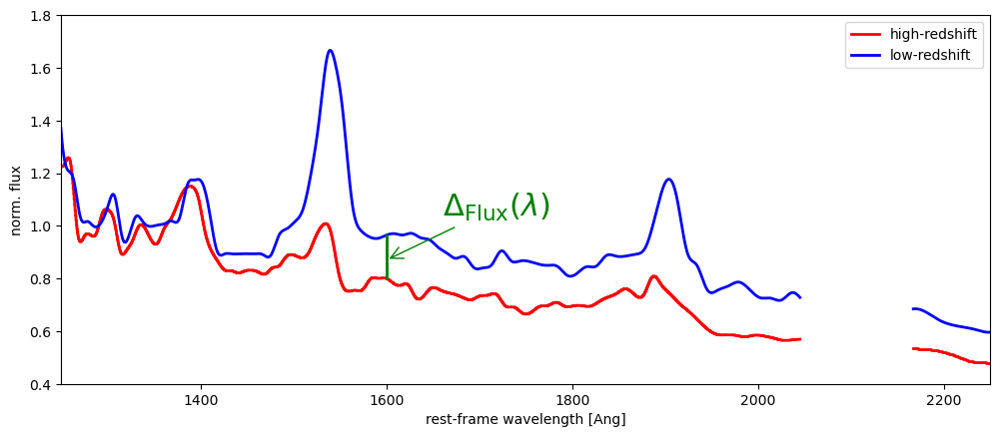

In [139]:
fig=plt.figure()
fig.set_figwidth(12)
# plt.plot(wl_rebin,np.array(flux_rebin)*fval3/fval1,lw=0.4, drawstyle='steps-mid', color='red',alpha=0.6)
# plt.plot(wl,flux,lw=0.4,drawstyle='steps-mid',color='blue',alpha=0.6)
plt.plot(fit3[0][maskint1],fit3[1][maskint1]*fval3/fval1,linewidth=2,drawstyle='steps-mid',color='red',alpha=1,label='high-redshift')
plt.plot(fit3[0][maskint2],fit3[1][maskint2]*fval3/fval1,linewidth=2,drawstyle='steps-mid',color='red',alpha=1)
plt.plot(wl_fit[maskint1],flux_fit[maskint1],c='blue',lw=2,label='low-redshift')
plt.plot(wl_fit[maskint2],flux_fit[maskint2],c='blue',lw=2)
# plt.fill_between(wl_fit[maskint1], flux_fit[maskint1], fit3[1][maskint1], facecolor='green', hatch='\\', alpha=0.5)
# plt.fill_between(wl_fit[maskint2], flux_fit[maskint2], fit3[1][maskint2], facecolor='green', hatch='\\', alpha=0.5)
index = 1200
plt.axvline(wl_fit[index],ymin=(fit3[1][index]-0.4)/1.4,ymax=(flux_fit[index]-0.4)/1.4,c='green',lw=2)
mid_y = 0.87  # Midpoint for annotation

plt.annotate(
    '$\Delta_\\text{Flux}(\lambda)$',        # The text to annotate
    xy=(1600, mid_y),     # The point to annotate
    xytext=(1600 + 60, mid_y+0.2),  # The position of the text
    arrowprops=dict(arrowstyle='->', color='green'),  # Optional arrow properties
    color='green',
    fontsize=22,                # Text size
    ha='left',                  # Horizontal alignment
    va='center'                 # Vertical alignment
)

# plt.annotate(
#     '$d_\\text{N} = \sqrt{\sum_\lambda \Delta_\\text{Flux}(\lambda)^2}$',
#     xy=(1600,mid_y),
#     xytext=(1600+60,mid_y+0.4),
#     color='green',
#     fontsize=22,
# )

plt.xlim(1250,2250)
plt.ylim(0.4,1.8)
plt.legend()
plt.xlabel('rest-frame wavelength [Ang]')
plt.ylabel('norm. flux')
# plt.savefig('plots/GalaxyCoffee/distance4.pdf',bbox_inches='tight')
plt.show()